In [1]:
import pandas as pd
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import (accuracy_score, f1_score, 
                             confusion_matrix, roc_auc_score,
                             RocCurveDisplay)
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import SimpleRNN, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping

# Data Pre-processing

In [ ]:
combined_stocks_df = pd.read_csv("filtered_stocks_combined.csv")

# Convert Date to datetime and set as index
combined_stocks_df["Date"] = pd.to_datetime(combined_stocks_df["Date"])
combined_stocks_df.set_index("Date", inplace=True)

# Drop unnecessary columns if any
combined_stocks_df = combined_stocks_df.drop(columns=["index"])

# Pivot to multi-level columns: Ticker as level 1, feature as level 2
stocks_df = combined_stocks_df.pivot_table(
    index=combined_stocks_df.index,
    columns="ticker",
    values=[col for col in combined_stocks_df.columns if col != "ticker"]
)

# Sort columns for clarity and swap MultiIndex levels
stocks_df = stocks_df.sort_index(axis=1, level=0)
stocks_df_leveled = stocks_df.swaplevel(axis=1)
stocks_df_leveled = stocks_df_leveled.sort_index(axis=1, level=0)

# ---------------------------
# Time-based split and feature engineering per ticker
# ---------------------------
# Store splits for each ticker
train_dict, val_dict, test_dict = {}, {}, {}

# Compute log returns, then split each ticker's data into train (60%), val (20%) and test (20%)
for ticker in stocks_df_leveled.columns.levels[0]:
    # Compute log return from Close prices
    stocks_df_leveled.loc[:, (ticker, 'log_return')] = np.log(
        stocks_df_leveled[ticker]['Close'] / stocks_df_leveled[ticker]['Close'].shift(1)
    )
    # Get ticker dataframe and drop NA
    df = stocks_df_leveled[ticker].dropna().sort_index()
    total_len = len(df)
    train_end = int(total_len * 0.6)
    val_end = train_end + int(total_len * 0.2)

    # Store splits
    train_dict[ticker] = df.iloc[:train_end]
    val_dict[ticker] = df.iloc[train_end:val_end]
    test_dict[ticker] = df.iloc[val_end:]

train_df = pd.concat(train_dict, names=["Ticker", "Date"])
val_df = pd.concat(val_dict, names=["Ticker", "Date"])
test_df = pd.concat(test_dict, names=["Ticker", "Date"])
# Define features and binary classification target based on log_return
features = ['Open', 'High', 'Low', 'Close', 'Volume']
for split in [train_dict, val_dict, test_dict]:
    for ticker, df in split.items():
        df['target'] = (df['log_return'] > 0).astype(int)

# RNN Sequences

In [3]:
# generate sequences of a fixed length for RNN
def create_sequences(data, sequence_length, feature_cols):
    X, y = [], []
    # Ensure the data is sorted by date
    data = data.sort_index()
    for i in range(sequence_length, len(data)):
        seq = data.iloc[i-sequence_length:i][feature_cols].values  # shape: (sequence_length, num_features)
        target = data.iloc[i]['target']
        X.append(seq)
        y.append(target)
    return np.array(X), np.array(y)

# Set the sequence length/rolling window size
sequence_length = 60

In [4]:
# Helper function to process a split (train, val or test) across tickers
def process_split(split_dict, sequence_length, feature_cols):
    X_list, y_list = [], []
    for ticker, df in split_dict.items():
        # Only create sequences if there are enough data points
        if len(df) > sequence_length:
            X_seq, y_seq = create_sequences(df, sequence_length, feature_cols)
            X_list.append(X_seq)
            y_list.append(y_seq)
    if X_list:
        return np.concatenate(X_list, axis=0), np.concatenate(y_list, axis=0)
    else:
        return None, None

X_train, y_train = process_split(train_dict, sequence_length, features)
X_val, y_val = process_split(val_dict, sequence_length, features)
X_test, y_test = process_split(test_dict, sequence_length, features)


# Feature Scaling

In [5]:
n_features = X_train.shape[-1]
X_train_reshaped = X_train.reshape(-1, n_features)
scaler = StandardScaler()
scaler.fit(X_train_reshaped)

X_train_scaled = scaler.transform(X_train_reshaped).reshape(X_train.shape)
X_val_scaled = scaler.transform(X_val.reshape(-1, n_features)).reshape(X_val.shape)
X_test_scaled = scaler.transform(X_test.reshape(-1, n_features)).reshape(X_test.shape)


# Building the Model

In [6]:
model = Sequential()
model.add(SimpleRNN(128, activation='relu', input_shape=(sequence_length, n_features)))
model.add(Dense(1))

opt = tf.keras.optimizers.Adam(learning_rate=0.001, decay=1e-6)
model.compile(optimizer=opt, loss='binary_crossentropy', metrics=['accuracy'])
model.summary()

c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\optimizers\base_optimizer.py:34: UserWarning: Argument `decay` is no longer supported and will be ignored.
  warnings.warn(


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ simple_rnn (SimpleRNN)          │ (None, 128)            │        17,152 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 17,281 (67.50 KB)

 Trainable params: 17,281 (67.50 KB)

 Non-trainable params: 0 (0.00 B)

# Model Training & Evaluation

Epoch 1/50
661/661 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - accuracy: 0.4984 - loss: 1.0079 - val_accuracy: 0.5017 - val_loss: 0.6981
Epoch 2/50
661/661 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - accuracy: 0.5135 - loss: 0.7238 - val_accuracy: 0.5060 - val_loss: 0.6944
Epoch 3/50
661/661 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - accuracy: 0.5077 - loss: 0.7127 - val_accuracy: 0.5017 - val_loss: 0.6943
Epoch 4/50
661/661 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - accuracy: 0.5101 - loss: 0.6976 - val_accuracy: 0.5017 - val_loss: 0.6989
Epoch 5/50
661/661 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - accuracy: 0.5151 - loss: 0.6945 - val_accuracy: 0.4948 - val_loss: 0.7051
Epoch 6/50
661/661 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - accuracy: 0.5132 - loss: 0.7059 - val_accuracy: 0.5052 - val_loss: 0.6980
Epoch 7/50
661/661 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - accuracy: 0.5044 - loss: 0.6962 - val_accuracy: 0.5037 - val_loss: 0.6939
Epoch 8/50
661/661 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.5135 - loss: 0.6939 - val_accuracy: 0

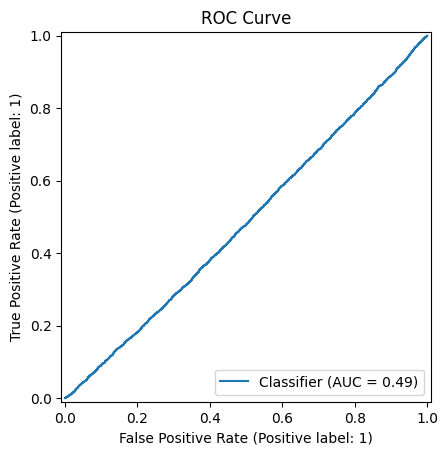

In [7]:
# Train the model
history = model.fit(X_train_scaled, y_train,
                    epochs=50,
                    batch_size=64,
                    validation_data=(X_val_scaled, y_val),
                    verbose=1)

# ---------------------------
# Evaluate the Model
# ---------------------------
# Get prediction probabilities on test set
y_pred_prob = model.predict(X_test_scaled).ravel()
y_pred_binary = (y_pred_prob > 0.5).astype(int)

# Compute evaluation metrics
accuracy = accuracy_score(y_test, y_pred_binary)
f1 = f1_score(y_test, y_pred_binary)
auc_roc = roc_auc_score(y_test, y_pred_prob)

print(f"Accuracy: {accuracy:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"AUC-ROC Score: {auc_roc:.4f}")

# Confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred_binary)
print("\nConfusion Matrix:")
print(pd.DataFrame(conf_matrix, 
                   index=['Actual Down', 'Actual Up'],
                   columns=['Predicted Down', 'Predicted Up']))

# Plot ROC curve
RocCurveDisplay.from_predictions(y_test, y_pred_prob)
plt.title('ROC Curve')
plt.show()

Loaded data with 75500 records.
Data sorted by 'Date' and 'index'.
           Date   index    Open    High     Low   Close     Volume  OpenInt  \
0    2011-01-03   45725  41.600  42.293  41.600  42.204  123930383        0   
1510 2011-01-03  123841  19.549  19.549  19.338  19.358   22577420        0   
3020 2011-01-03  220493  30.830  31.480  30.790  31.290    6245382        0   
4530 2011-01-03  692217   8.440   8.550   8.390   8.470   21152390        0   
6040 2011-01-03  711850  48.320  49.242  48.276  48.599    6232990        0   

     ticker  
0      AAPL  
1510    ABT  
3020   ADBE  
4530    AMD  
6040   AMGN  
Processing all tickers:
 ['AAPL' 'ABT' 'ADBE' 'AMD' 'AMGN' 'AMZN' 'AXP' 'BAC' 'BSX' 'C' 'CAT'
 'CMCSA' 'COST' 'CSCO' 'CVX' 'DHR' 'DIS' 'GE' 'GOOGL' 'GS' 'HD' 'HON'
 'IBM' 'INTU' 'JNJ' 'JPM' 'KO' 'LLY' 'MCD' 'MRK' 'MSFT' 'NVDA' 'ORCL'
 'PEP' 'PFE' 'PG' 'PGR' 'QCOM' 'SMFG' 'SPGI' 'SYK' 'T' 'TMO' 'TXN' 'UNH'
 'UNP' 'VZ' 'WFC' 'WMT' 'XOM']

Processing ticker: AAPL
Ticker: AAP

c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0046 - val_loss: 0.0112
Epoch 2/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.6955e-04 - val_loss: 0.0042
Epoch 3/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9410e-04 - val_loss: 0.0023
Epoch 4/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4642e-04 - val_loss: 0.0041
Epoch 5/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5920e-04 - val_loss: 0.0031
Epoch 6/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9700e-04 - val_loss: 0.0038
Epoch 7/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.1334e-04 - val_loss: 0.0032
Epoch 8/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.2017e-04 - val_loss: 0.0021
Epoch 9/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.0011e-04 - val_loss: 0.0039
Epoch 10/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.4138e-04 - val_loss: 0.0015
Epoch 11/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.5726e-04 - val_loss: 0.0018
Epoch 12/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms

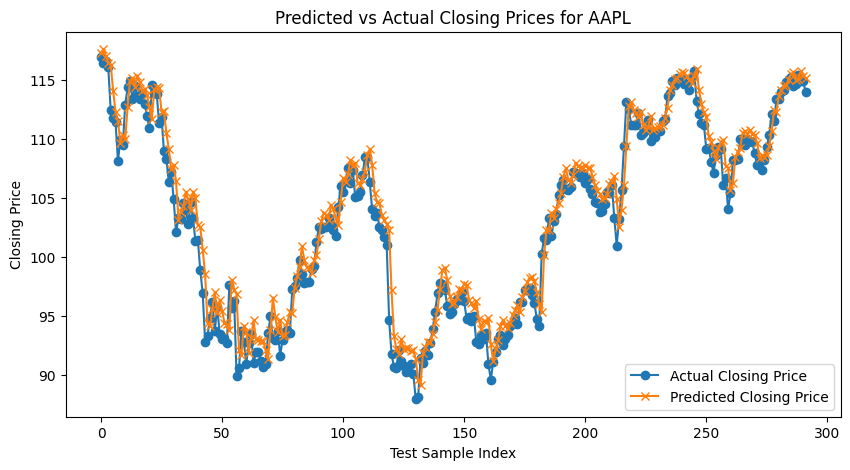

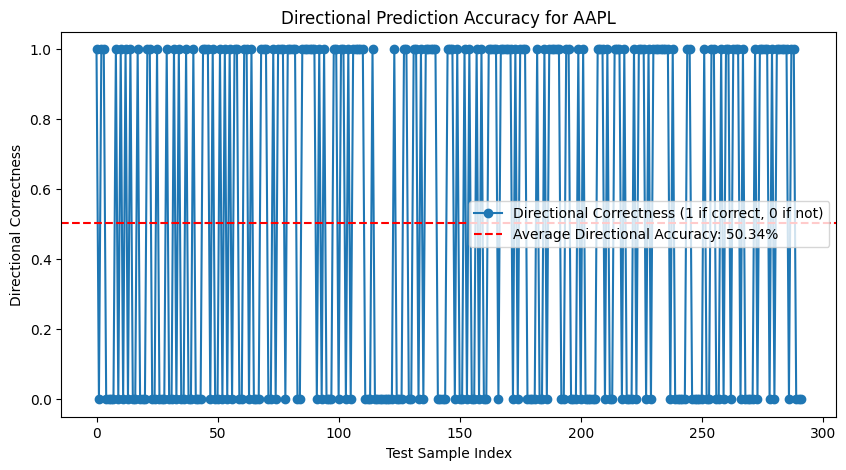

ROC AUC for AAPL: 0.52


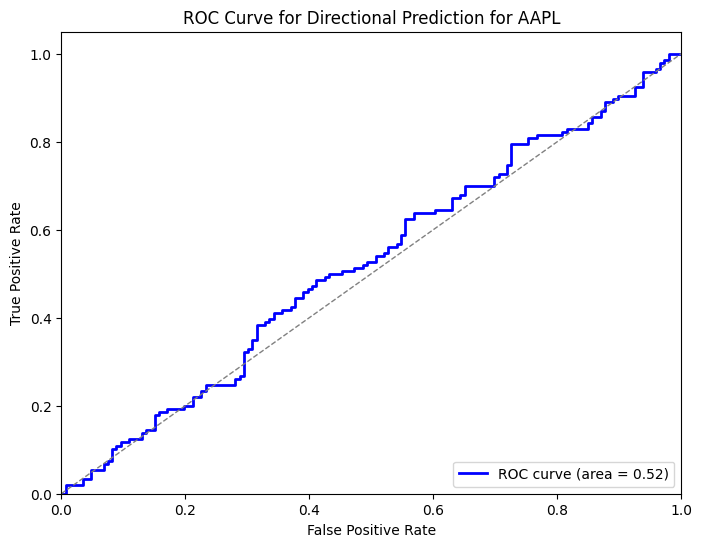


Processing ticker: ABT
Ticker: ABT - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0713 - val_loss: 0.0031
Epoch 2/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1838e-04 - val_loss: 0.0028
Epoch 3/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.0444e-04 - val_loss: 0.0024
Epoch 4/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.5022e-04 - val_loss: 0.0013
Epoch 5/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.9976e-04 - val_loss: 0.0023
Epoch 6/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.7941e-04 - val_loss: 0.0010
Epoch 7/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.4152e-04 - val_loss: 9.5820e-04
Epoch 8/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.0511e-04 - val_loss: 7.7329e-04
Epoch 9/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.3741e-04 - val_loss: 6.6514e-04
Epoch 10/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.4024e-04 - val_loss: 8.0688e-04
Epoch 11/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.3134e-04 - val_loss: 6.3116e-04
Epoch 12/50
28/28 ━━━━━━━

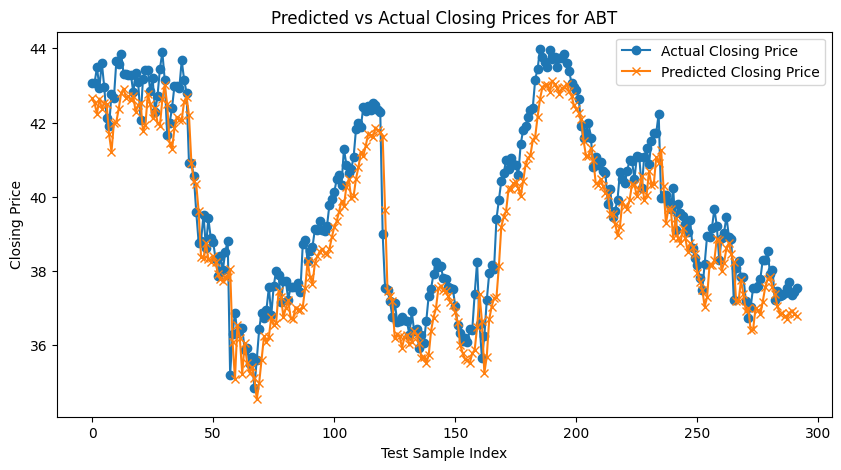

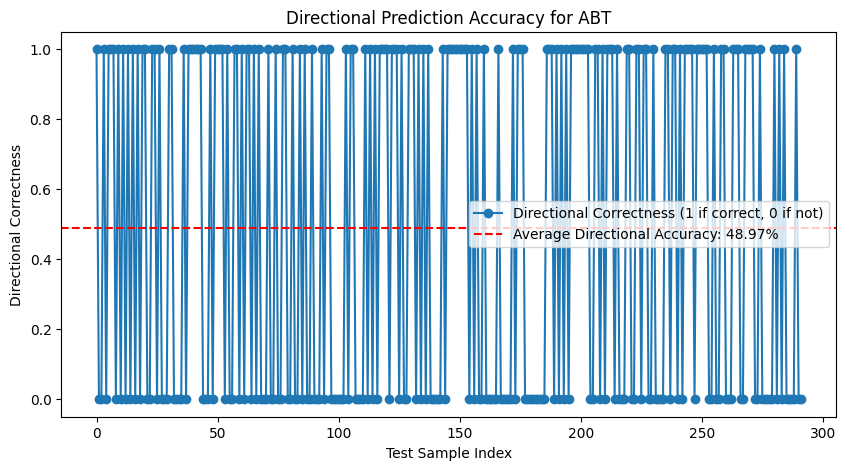

ROC AUC for ABT: 0.51


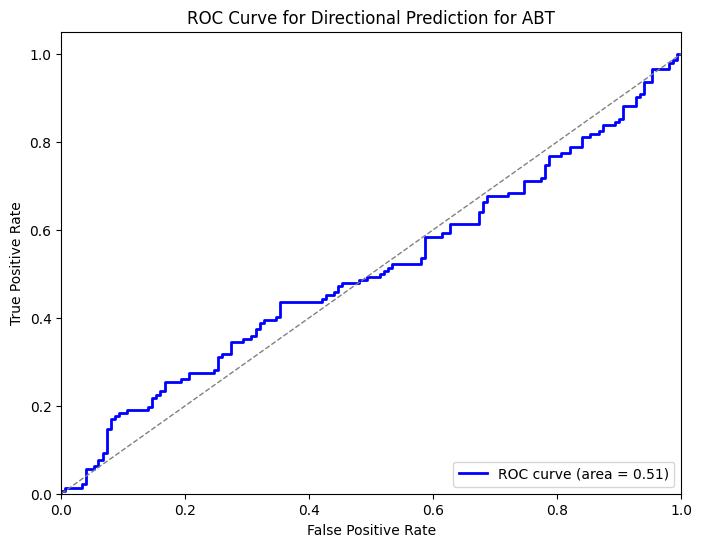


Processing ticker: ADBE
Ticker: ADBE - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0339 - val_loss: 0.0114
Epoch 2/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.2076e-04 - val_loss: 0.0061
Epoch 3/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9947e-04 - val_loss: 0.0038
Epoch 4/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0708e-04 - val_loss: 0.0033
Epoch 5/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.2390e-04 - val_loss: 0.0036
Epoch 6/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.4141e-04 - val_loss: 0.0022
Epoch 7/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.6242e-04 - val_loss: 0.0019
Epoch 8/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.0178e-04 - val_loss: 0.0016
Epoch 9/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.5776e-04 - val_loss: 0.0030
Epoch 10/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.3175e-04 - val_loss: 0.0015
Epoch 11/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.0130e-04 - val_loss: 0.0012
Epoch 12/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms

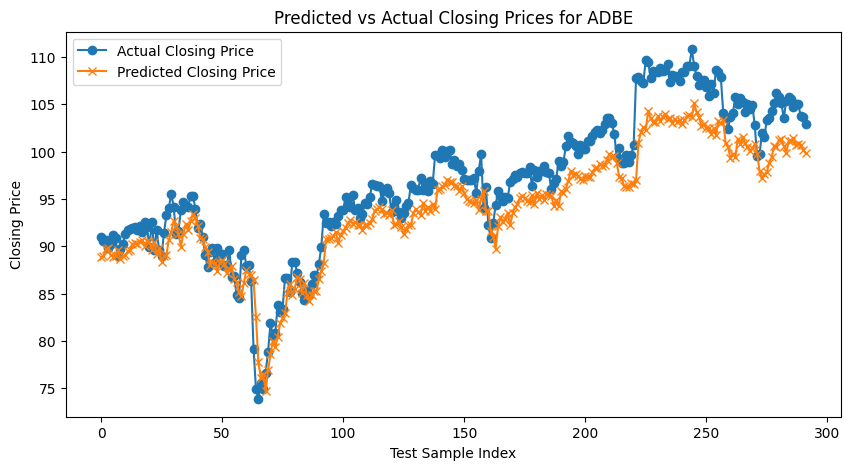

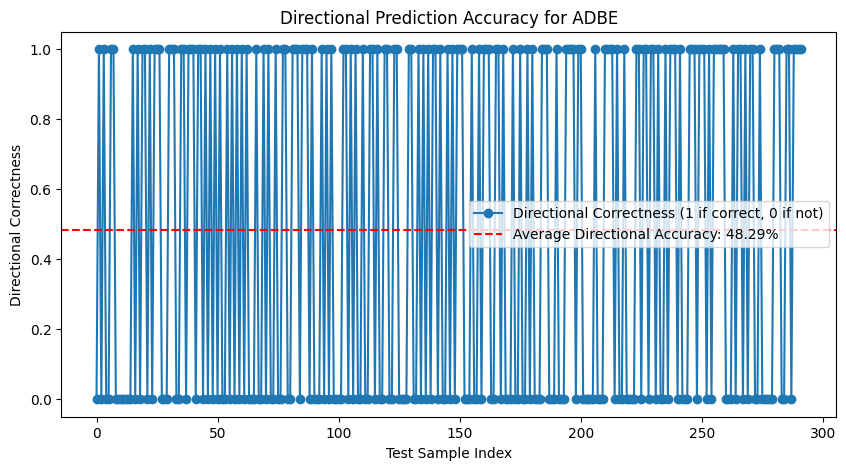

ROC AUC for ADBE: 0.62


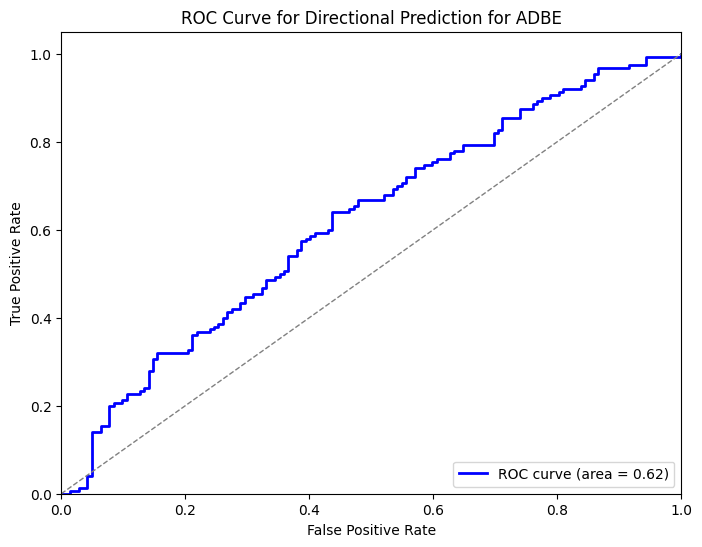


Processing ticker: AMD
Ticker: AMD - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.1321 - val_loss: 0.0024
Epoch 2/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0032 - val_loss: 0.0025
Epoch 3/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0024 - val_loss: 9.3755e-04
Epoch 4/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0020 - val_loss: 9.8468e-04
Epoch 5/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0022 - val_loss: 5.2510e-04
Epoch 6/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0019 - val_loss: 5.5400e-04
Epoch 7/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0018 - val_loss: 0.0024
Epoch 8/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0019 - val_loss: 9.0288e-04
Epoch 9/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0018 - val_loss: 5.4516e-04
Epoch 10/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0015 - val_loss: 6.6893e-04
Epoch 11/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0014 - val_loss: 6.4032e-04
Epoch 12/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - 

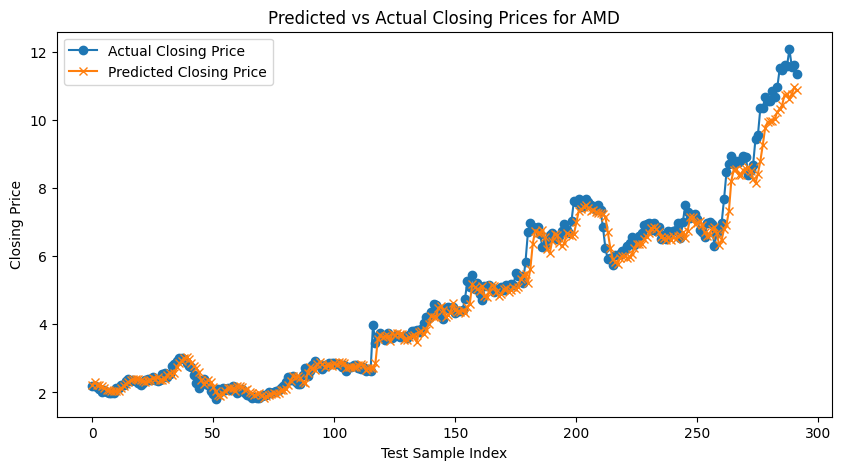

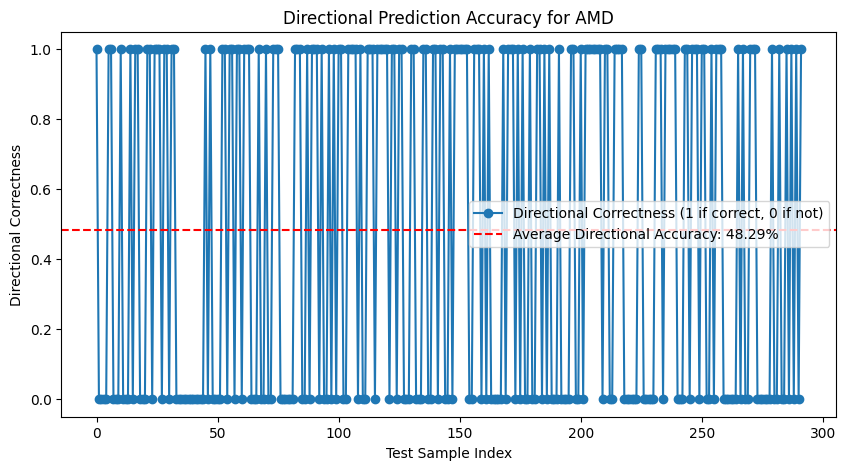

ROC AUC for AMD: 0.49


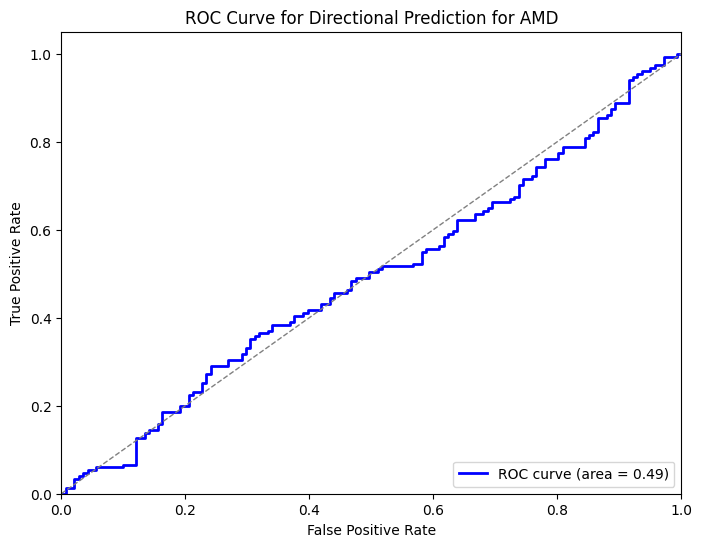


Processing ticker: AMGN
Ticker: AMGN - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0389 - val_loss: 0.0209
Epoch 2/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6872e-04 - val_loss: 0.0112
Epoch 3/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7810e-04 - val_loss: 0.0090
Epoch 4/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2438e-04 - val_loss: 0.0072
Epoch 5/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7360e-04 - val_loss: 0.0073
Epoch 6/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9852e-04 - val_loss: 0.0043
Epoch 7/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3508e-04 - val_loss: 0.0047
Epoch 8/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7846e-04 - val_loss: 0.0061
Epoch 9/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.3505e-04 - val_loss: 0.0057
Epoch 10/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.8351e-04 - val_loss: 0.0071
Epoch 11/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6052e-04 - val_loss: 0.0054
Epoch 12/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms

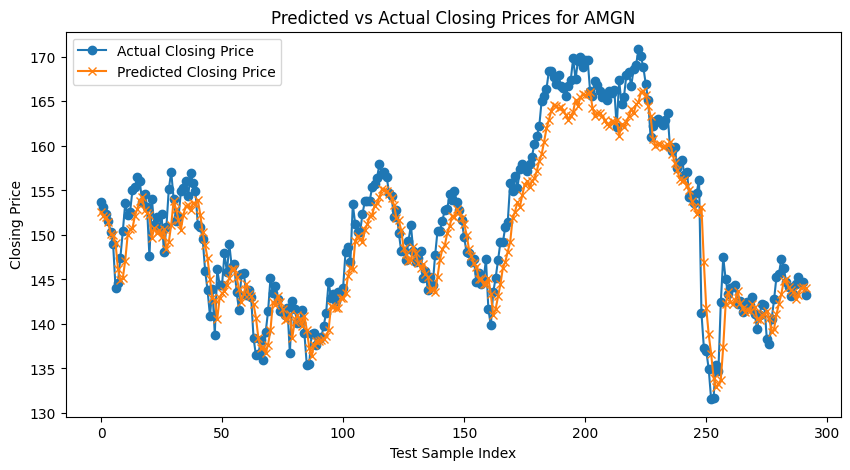

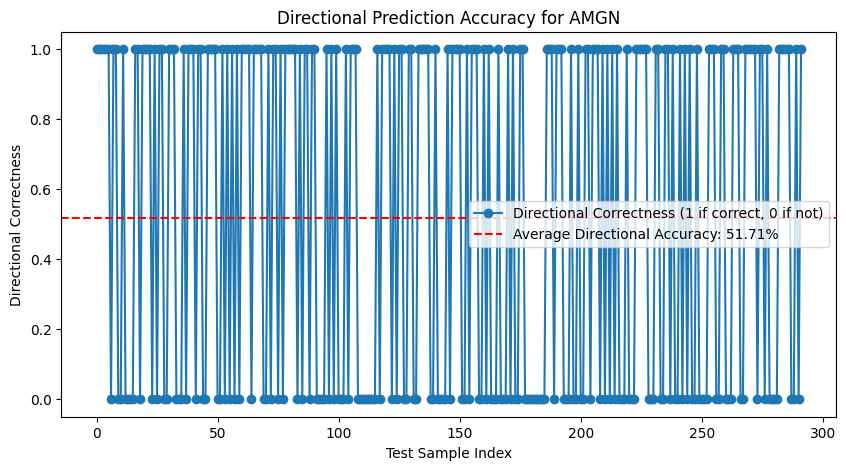

ROC AUC for AMGN: 0.54


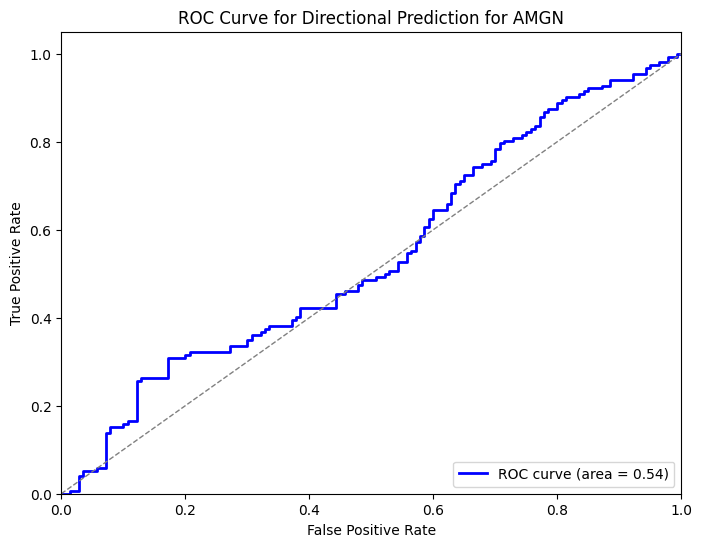


Processing ticker: AMZN
Ticker: AMZN - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0335 - val_loss: 0.0141
Epoch 2/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6417e-04 - val_loss: 0.0106
Epoch 3/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.2399e-04 - val_loss: 0.0063
Epoch 4/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.6689e-04 - val_loss: 0.0061
Epoch 5/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.3192e-04 - val_loss: 0.0051
Epoch 6/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.3963e-04 - val_loss: 0.0044
Epoch 7/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.0053e-04 - val_loss: 0.0048
Epoch 8/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.2222e-04 - val_loss: 0.0035
Epoch 9/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.9367e-04 - val_loss: 0.0039
Epoch 10/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.0658e-04 - val_loss: 0.0034
Epoch 11/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.1010e-04 - val_loss: 0.0033
Epoch 12/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms

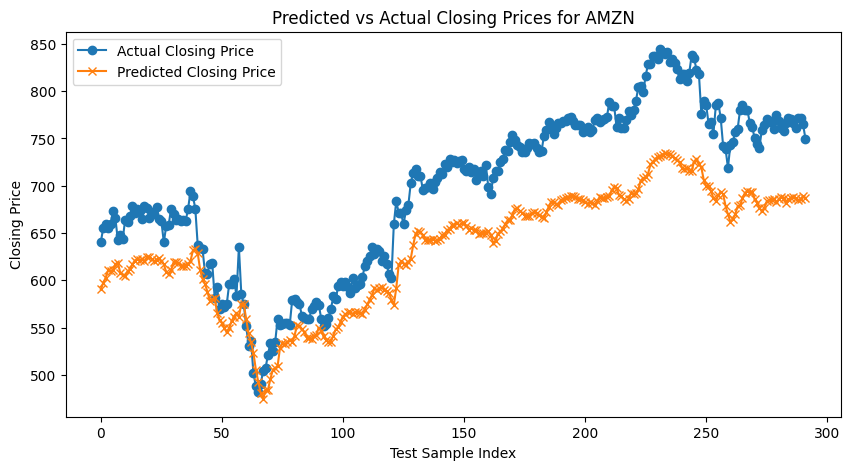

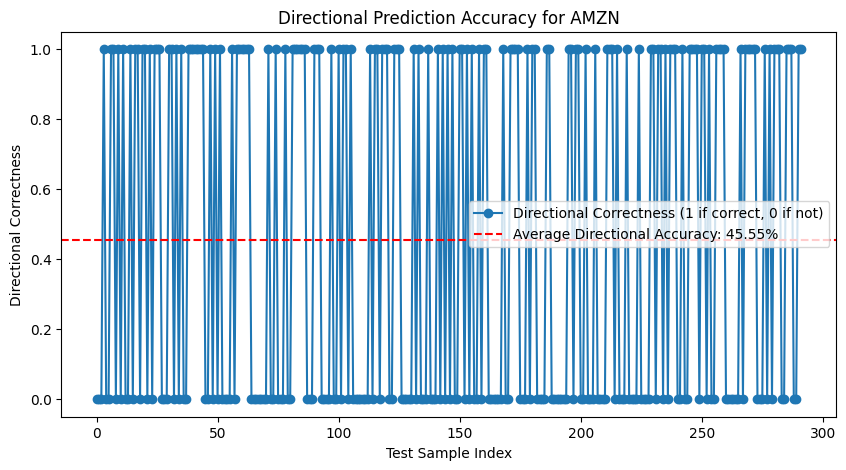

ROC AUC for AMZN: 0.53


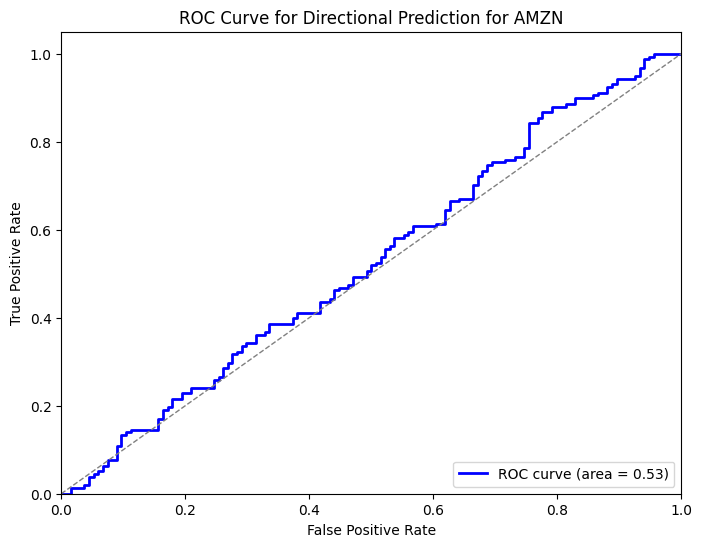


Processing ticker: AXP
Ticker: AXP - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.1400 - val_loss: 0.0049
Epoch 2/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0023 - val_loss: 0.0024
Epoch 3/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0013 - val_loss: 0.0024
Epoch 4/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0012 - val_loss: 0.0017
Epoch 5/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0010 - val_loss: 0.0015
Epoch 6/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 9.7458e-04 - val_loss: 0.0015
Epoch 7/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 9.7302e-04 - val_loss: 0.0014
Epoch 8/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0011 - val_loss: 0.0017
Epoch 9/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.4080e-04 - val_loss: 0.0013
Epoch 10/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 9.0085e-04 - val_loss: 0.0027
Epoch 11/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.2775e-04 - val_loss: 0.0013
Epoch 12/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9334

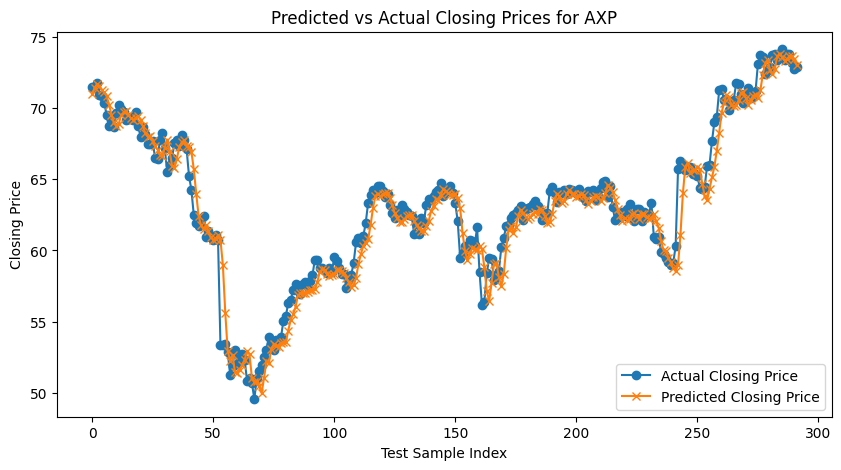

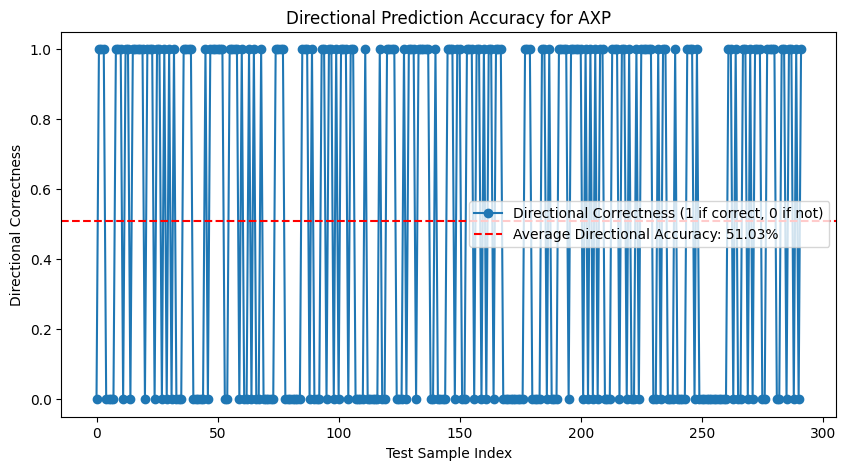

ROC AUC for AXP: 0.48


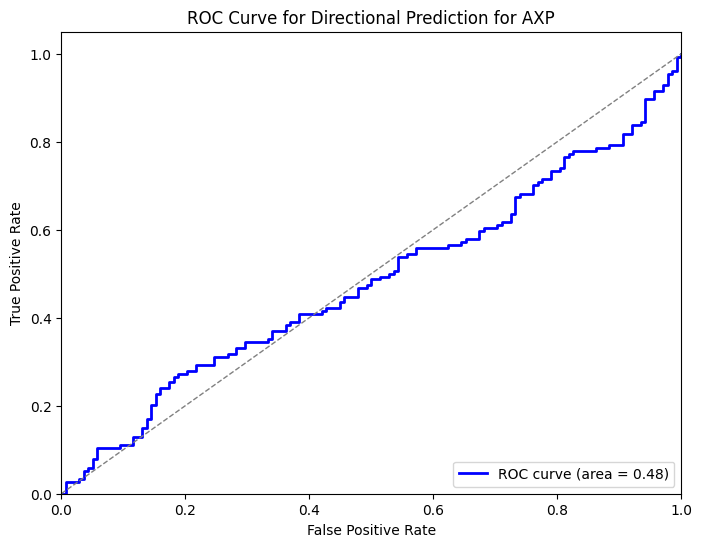


Processing ticker: BAC
Ticker: BAC - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.1079 - val_loss: 0.0047
Epoch 2/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0019 - val_loss: 0.0020
Epoch 3/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5231e-04 - val_loss: 5.0738e-04
Epoch 4/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4663e-04 - val_loss: 4.1628e-04
Epoch 5/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0482e-04 - val_loss: 4.6859e-04
Epoch 6/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5884e-04 - val_loss: 3.0735e-04
Epoch 7/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.9717e-04 - val_loss: 5.0037e-04
Epoch 8/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6588e-04 - val_loss: 7.1488e-04
Epoch 9/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.2587e-04 - val_loss: 3.4222e-04
Epoch 10/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.8104e-04 - val_loss: 3.5826e-04
Epoch 11/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.6154e-04 - val_loss: 3.4250e-04
Epoch 12/50
2

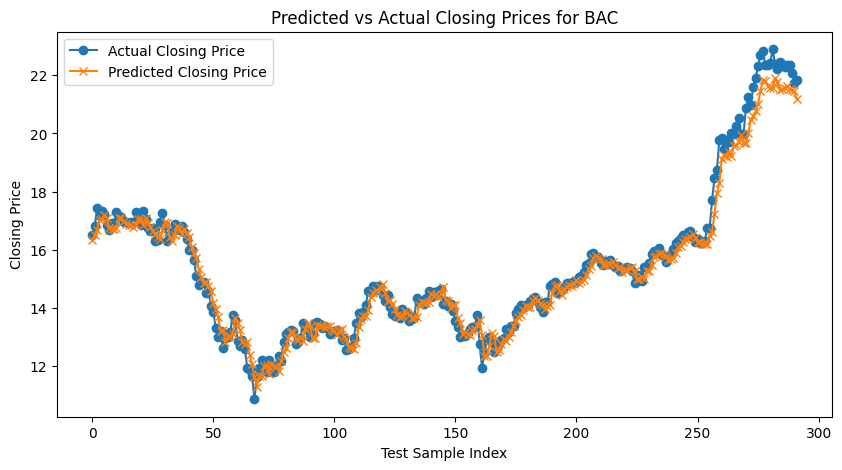

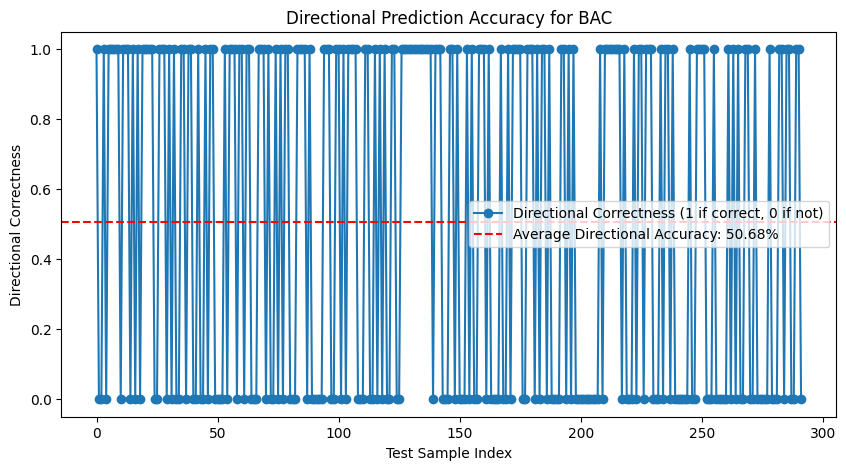

ROC AUC for BAC: 0.52


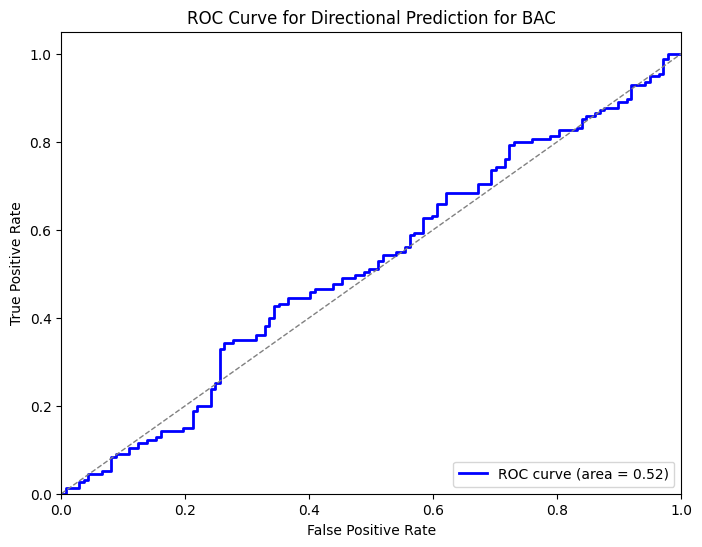


Processing ticker: BSX
Ticker: BSX - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0126 - val_loss: 0.0053
Epoch 2/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0553e-04 - val_loss: 0.0063
Epoch 3/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.1859e-04 - val_loss: 0.0064
Epoch 4/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.7847e-04 - val_loss: 0.0067
Epoch 5/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.4775e-04 - val_loss: 0.0066
Epoch 6/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.6700e-04 - val_loss: 0.0063
Epoch 7/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.6578e-04 - val_loss: 0.0066
Epoch 8/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.2170e-04 - val_loss: 0.0060
Epoch 9/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.3474e-04 - val_loss: 0.0055
Epoch 10/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.3218e-04 - val_loss: 0.0046
Epoch 11/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.9132e-04 - val_loss: 0.0055
Epoch 12/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4m

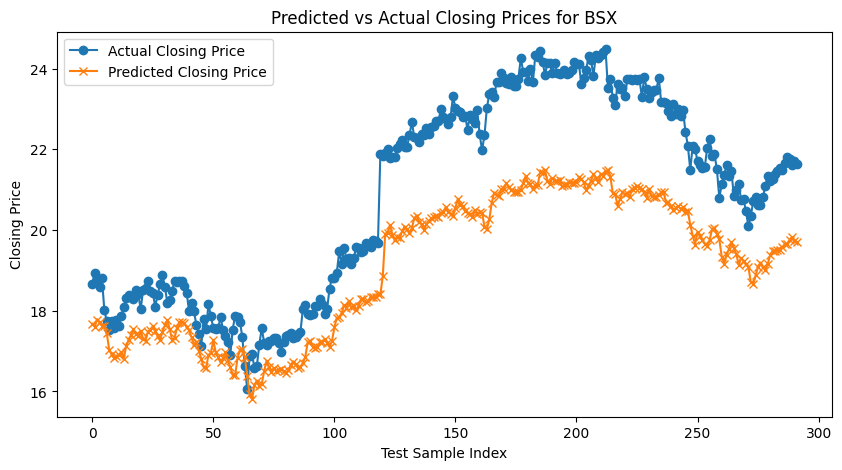

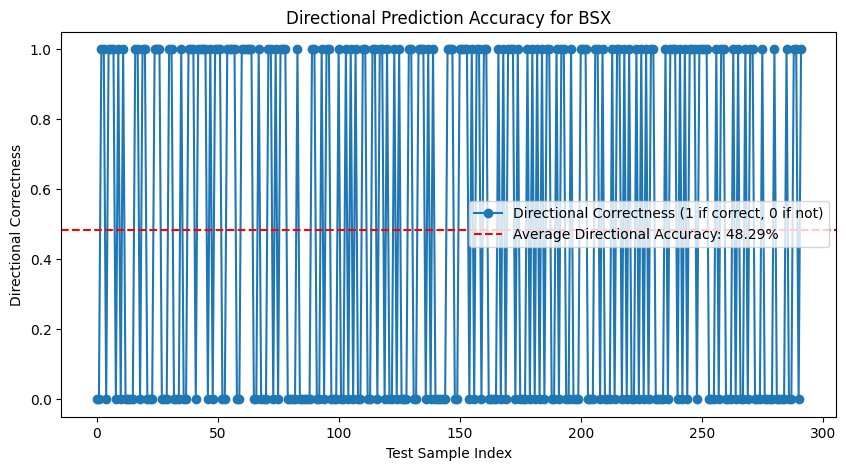

ROC AUC for BSX: 0.56


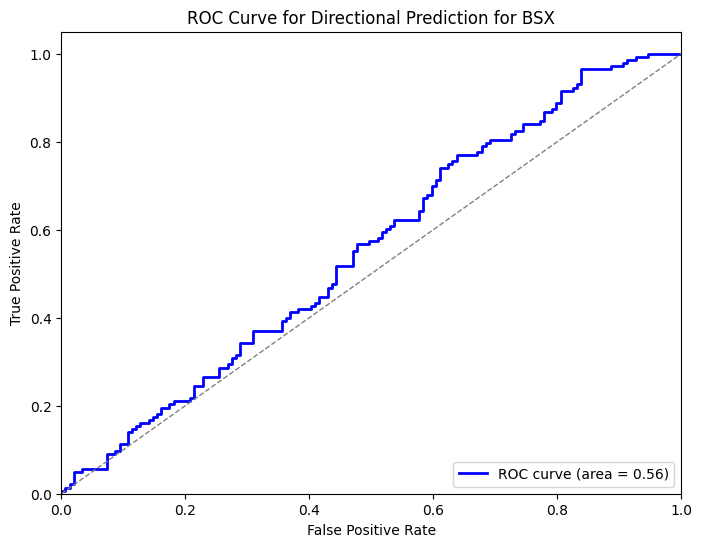


Processing ticker: C
Ticker: C - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.2858 - val_loss: 0.0047
Epoch 2/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0046 - val_loss: 0.0132
Epoch 3/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0042 - val_loss: 0.0053
Epoch 4/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0034 - val_loss: 0.0062
Epoch 5/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0029 - val_loss: 0.0031
Epoch 6/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0028 - val_loss: 0.0030
Epoch 7/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0024 - val_loss: 0.0030
Epoch 8/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0026 - val_loss: 0.0043
Epoch 9/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0022 - val_loss: 0.0032
Epoch 10/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0020 - val_loss: 0.0027
Epoch 11/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0019 - val_loss: 0.0018
Epoch 12/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0019 - val_loss: 0.0022

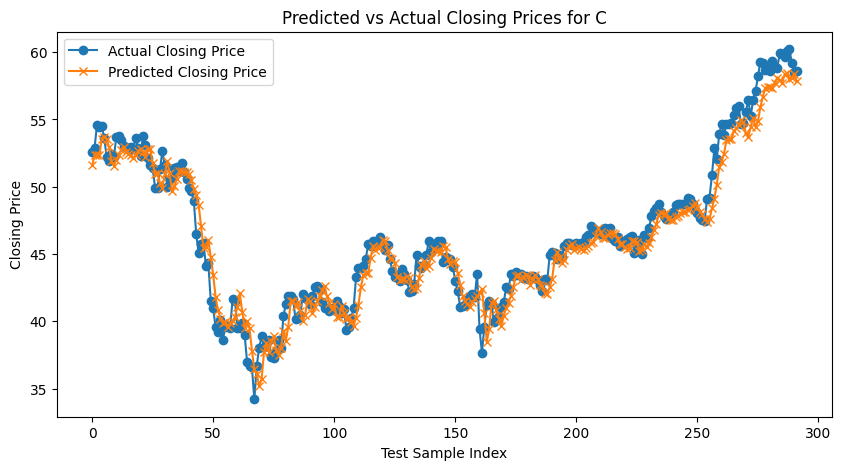

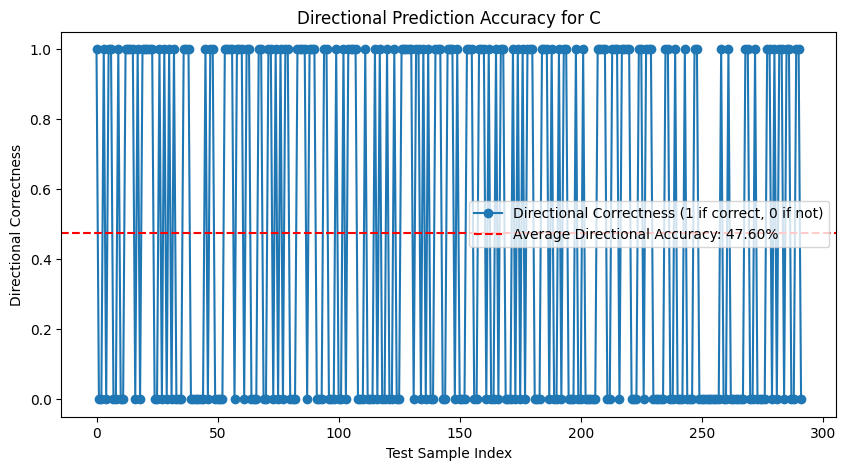

ROC AUC for C: 0.48


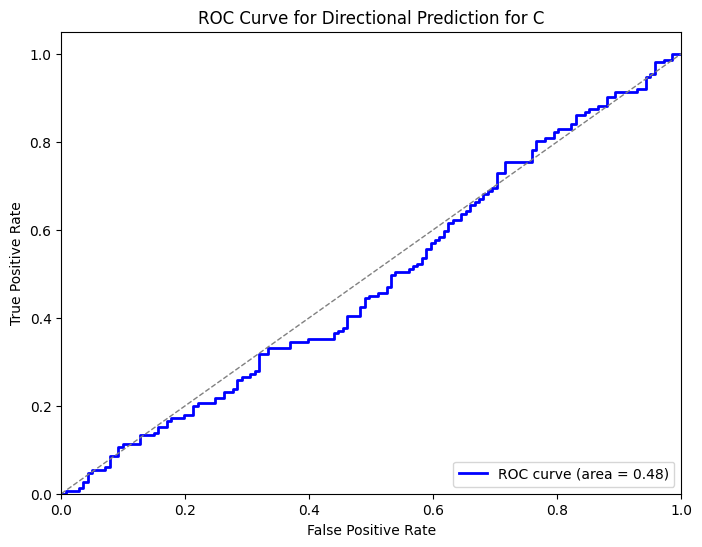


Processing ticker: CAT
Ticker: CAT - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0160 - val_loss: 0.0025
Epoch 2/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0026 - val_loss: 0.0018
Epoch 3/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0021 - val_loss: 0.0021
Epoch 4/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 5/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0015 - val_loss: 0.0014
Epoch 6/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0016 - val_loss: 0.0013
Epoch 7/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0018 - val_loss: 0.0019
Epoch 8/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0017 - val_loss: 0.0013
Epoch 9/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0012 - val_loss: 0.0013
Epoch 10/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0013 - val_loss: 0.0012
Epoch 11/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0013 - val_loss: 0.0013
Epoch 12/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0014 - val_loss: 0.0011


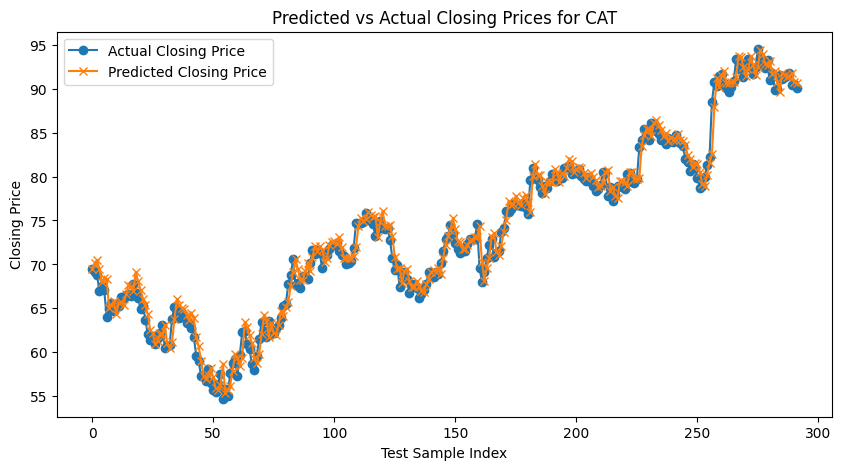

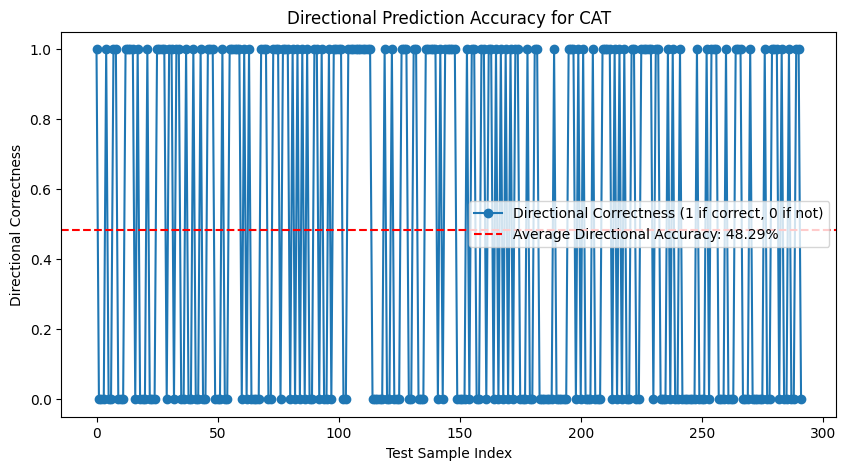

ROC AUC for CAT: 0.50


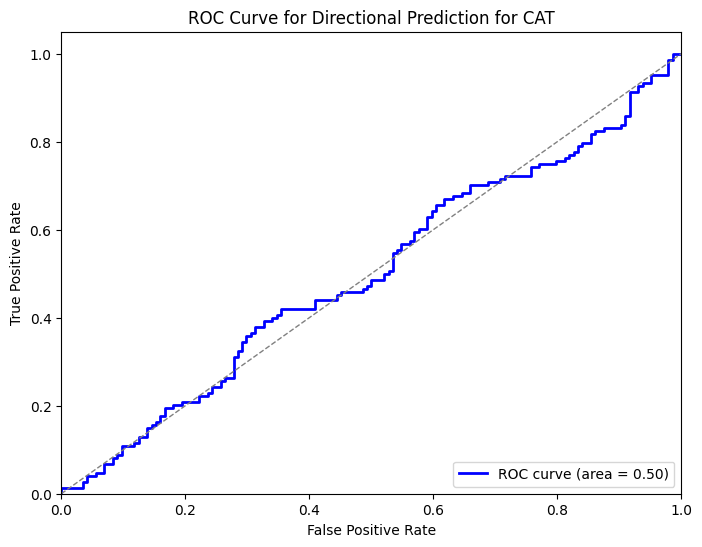


Processing ticker: CMCSA
Ticker: CMCSA - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0105 - val_loss: 0.0045
Epoch 2/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5135e-04 - val_loss: 0.0027
Epoch 3/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0335e-04 - val_loss: 0.0022
Epoch 4/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.4476e-04 - val_loss: 0.0022
Epoch 5/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6145e-04 - val_loss: 0.0042
Epoch 6/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9153e-04 - val_loss: 0.0017
Epoch 7/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.3749e-04 - val_loss: 0.0012
Epoch 8/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.9896e-04 - val_loss: 0.0022
Epoch 9/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.9839e-04 - val_loss: 0.0014
Epoch 10/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.4676e-04 - val_loss: 0.0013
Epoch 11/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.4217e-04 - val_loss: 0.0015
Epoch 12/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms

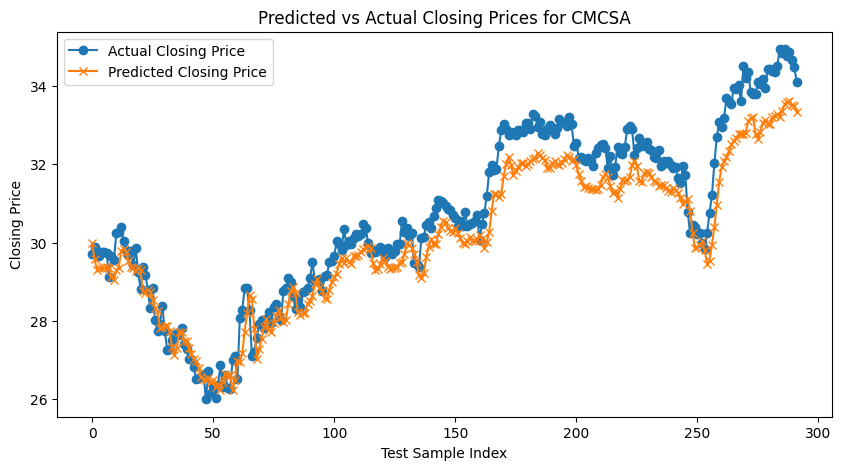

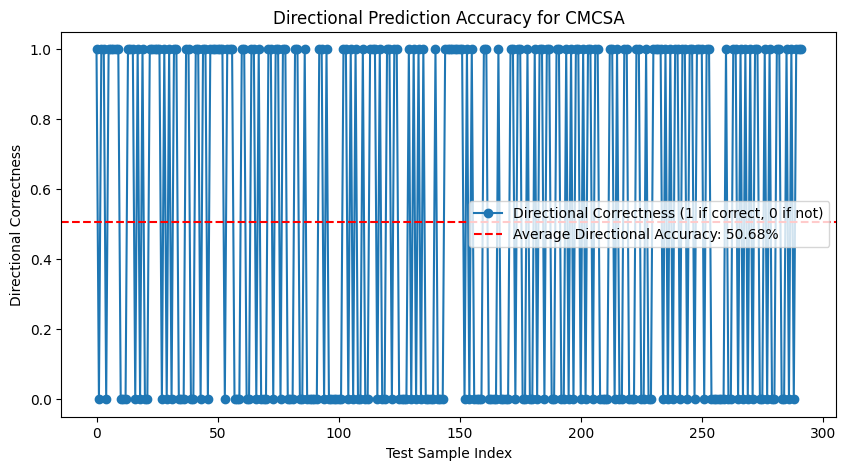

ROC AUC for CMCSA: 0.56


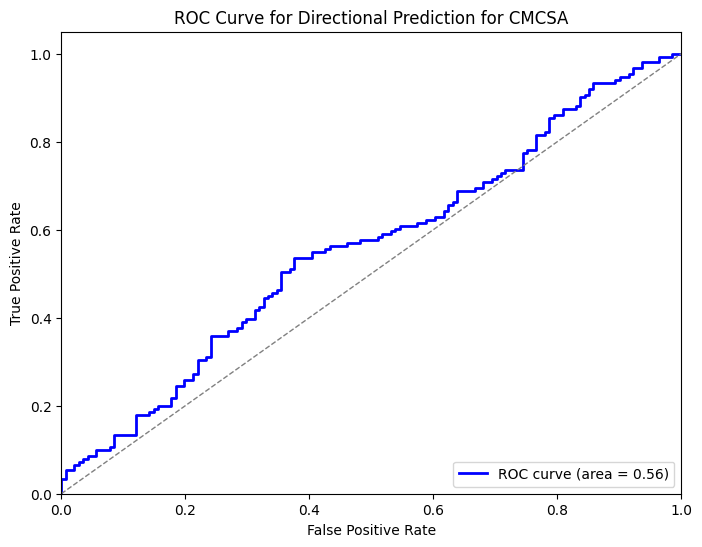


Processing ticker: COST
Ticker: COST - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0175 - val_loss: 0.0231
Epoch 2/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9460e-04 - val_loss: 0.0186
Epoch 3/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1820e-04 - val_loss: 0.0150
Epoch 4/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6193e-04 - val_loss: 0.0112
Epoch 5/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.2739e-04 - val_loss: 0.0103
Epoch 6/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.9225e-04 - val_loss: 0.0072
Epoch 7/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.5031e-04 - val_loss: 0.0073
Epoch 8/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.5922e-04 - val_loss: 0.0077
Epoch 9/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.4622e-04 - val_loss: 0.0057
Epoch 10/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.2397e-04 - val_loss: 0.0061
Epoch 11/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.1472e-04 - val_loss: 0.0055
Epoch 12/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms

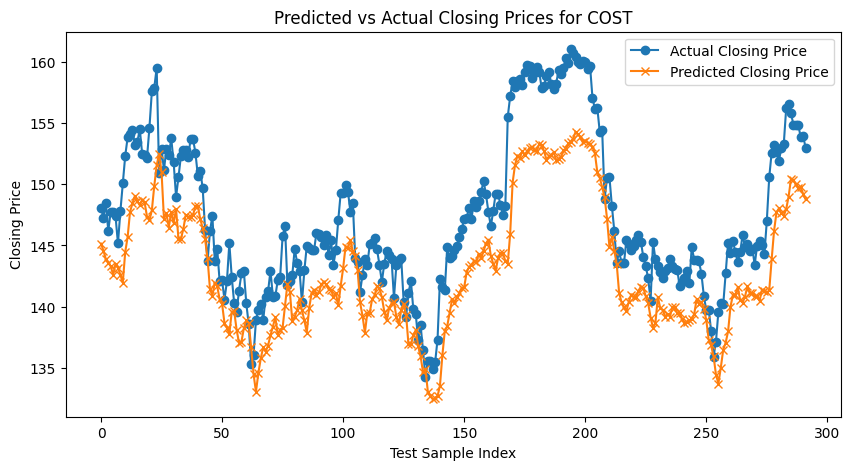

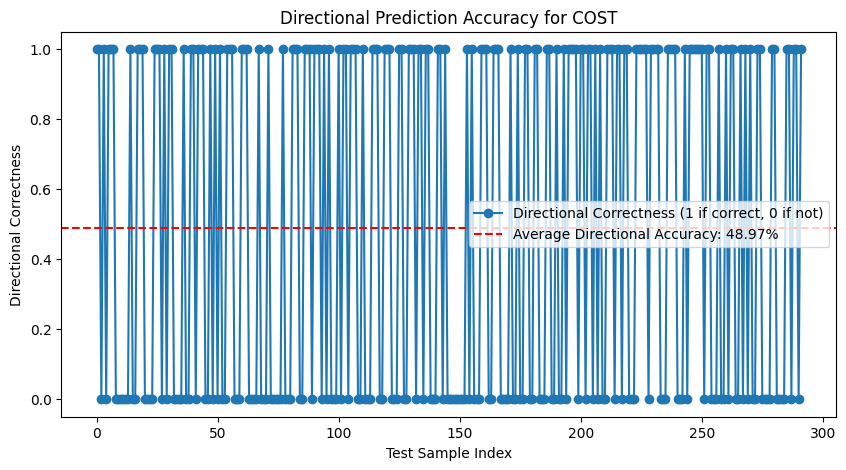

ROC AUC for COST: 0.54


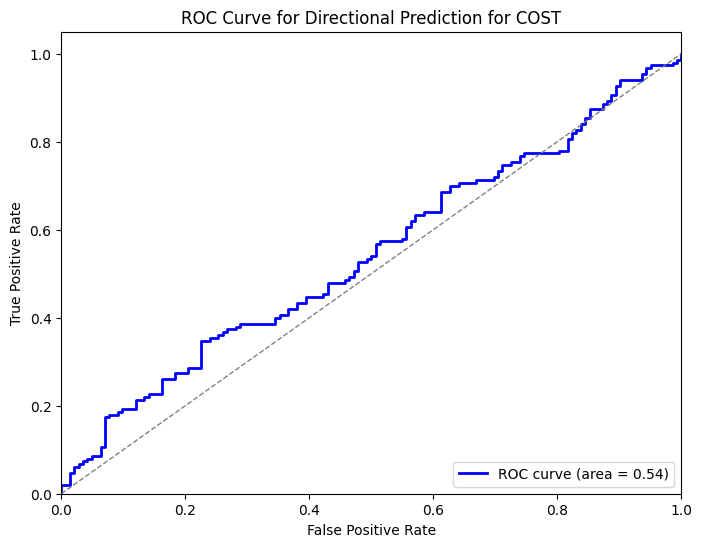


Processing ticker: CSCO
Ticker: CSCO - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0075 - val_loss: 0.0012
Epoch 2/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9120e-04 - val_loss: 5.0189e-04
Epoch 3/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9255e-04 - val_loss: 6.6498e-04
Epoch 4/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.6945e-04 - val_loss: 0.0015
Epoch 5/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6660e-04 - val_loss: 5.8001e-04
Epoch 6/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.7996e-04 - val_loss: 4.2040e-04
Epoch 7/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.6735e-04 - val_loss: 5.0137e-04
Epoch 8/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.5104e-04 - val_loss: 3.7105e-04
Epoch 9/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.2412e-04 - val_loss: 9.9767e-04
Epoch 10/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.7760e-04 - val_loss: 3.3043e-04
Epoch 11/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.8332e-04 - val_loss: 9.5950e-04
Epoch 12/

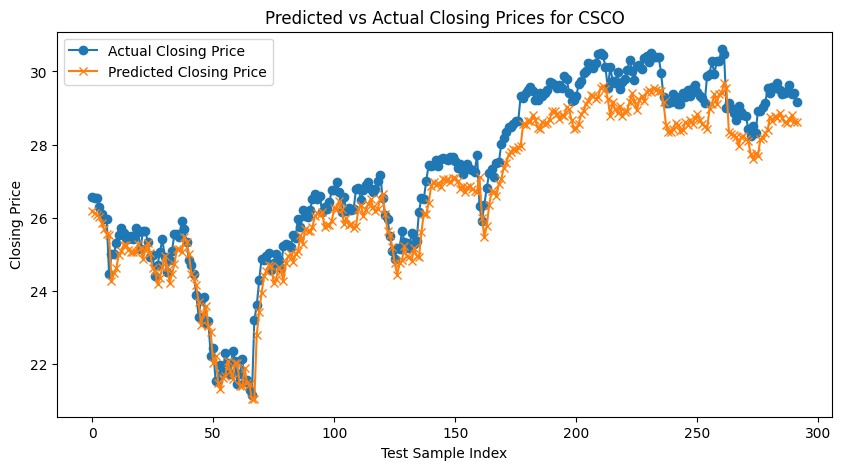

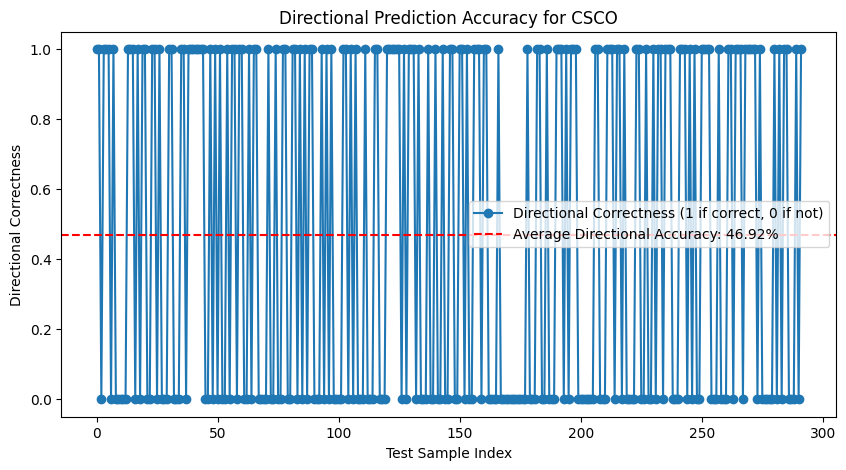

ROC AUC for CSCO: 0.51


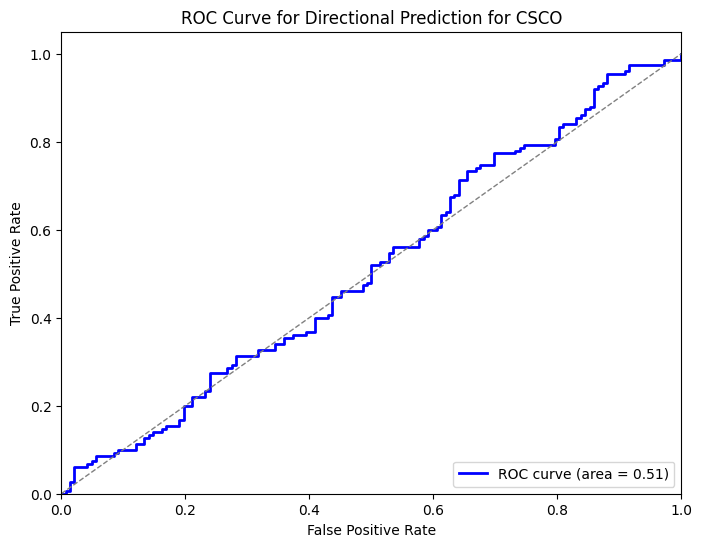


Processing ticker: CVX
Ticker: CVX - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.1570 - val_loss: 0.0120
Epoch 2/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0047 - val_loss: 0.0044
Epoch 3/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0018 - val_loss: 0.0040
Epoch 4/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0017 - val_loss: 0.0036
Epoch 5/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0014 - val_loss: 0.0035
Epoch 6/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0014 - val_loss: 0.0035
Epoch 7/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0014 - val_loss: 0.0032
Epoch 8/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0015 - val_loss: 0.0034
Epoch 9/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0013 - val_loss: 0.0031
Epoch 10/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0013 - val_loss: 0.0029
Epoch 11/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0012 - val_loss: 0.0030
Epoch 12/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0013 - val_loss: 0.0029


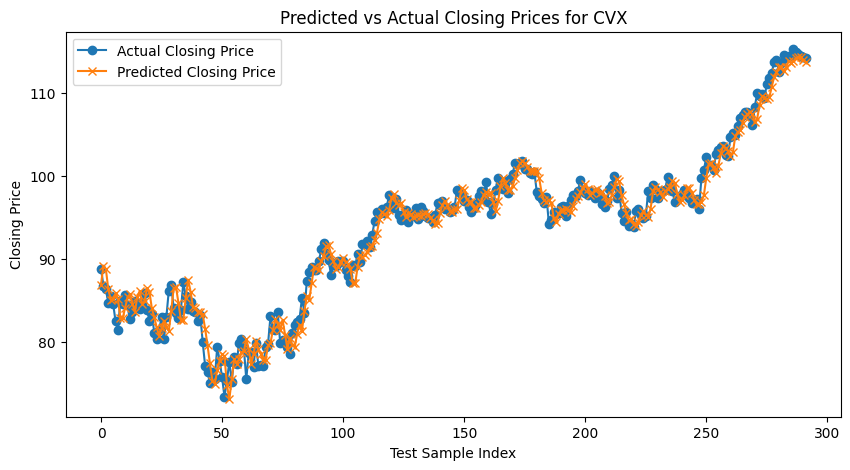

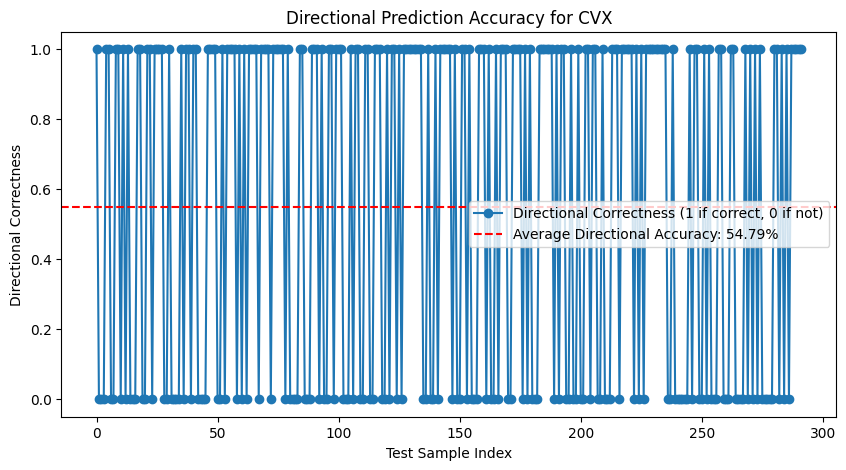

ROC AUC for CVX: 0.55


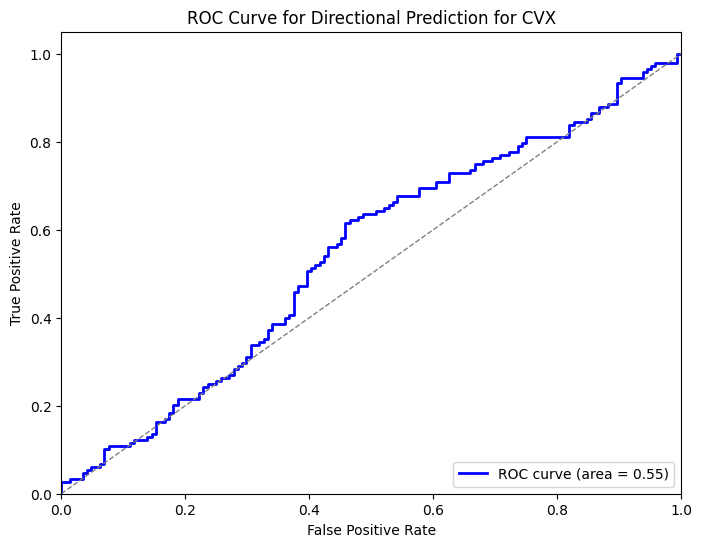


Processing ticker: DHR
Ticker: DHR - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0101 - val_loss: 0.0037
Epoch 2/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7559e-04 - val_loss: 0.0018
Epoch 3/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.4598e-04 - val_loss: 0.0012
Epoch 4/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.4369e-04 - val_loss: 0.0016
Epoch 5/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.5498e-04 - val_loss: 9.8423e-04
Epoch 6/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.4941e-04 - val_loss: 0.0015
Epoch 7/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.7363e-04 - val_loss: 8.1760e-04
Epoch 8/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.5428e-04 - val_loss: 0.0010
Epoch 9/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.3085e-04 - val_loss: 0.0011
Epoch 10/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.6629e-04 - val_loss: 7.8294e-04
Epoch 11/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.1026e-04 - val_loss: 7.5912e-04
Epoch 12/50
28/28 ━━━━━━━━━━━

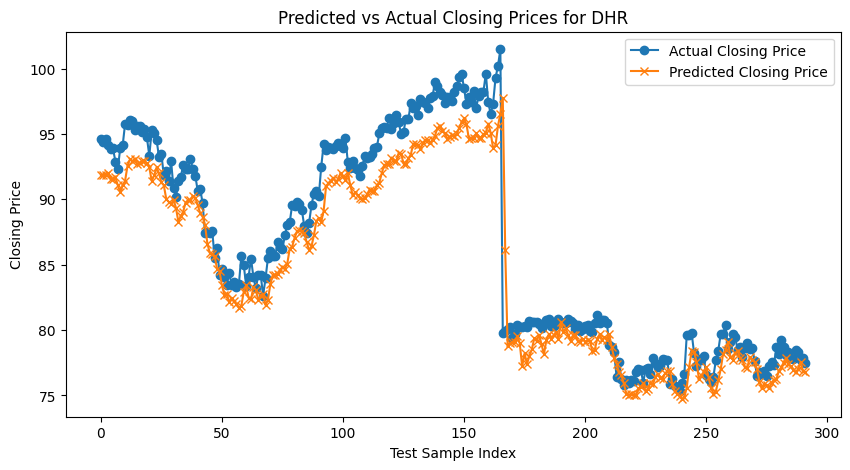

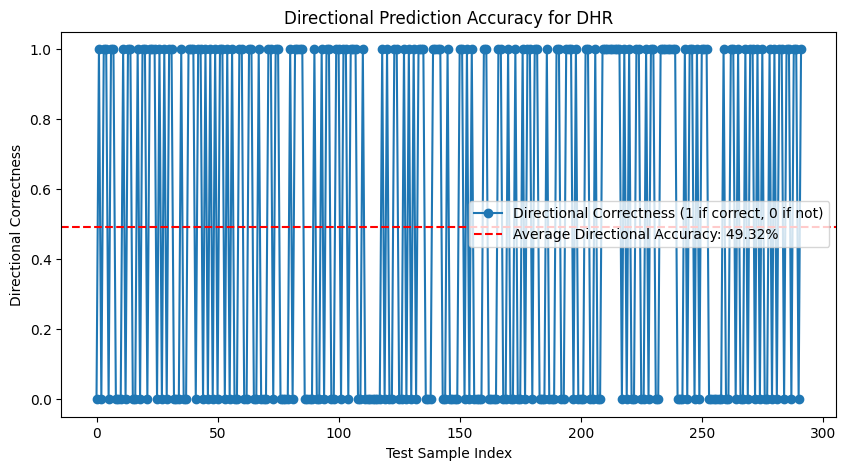

ROC AUC for DHR: 0.54


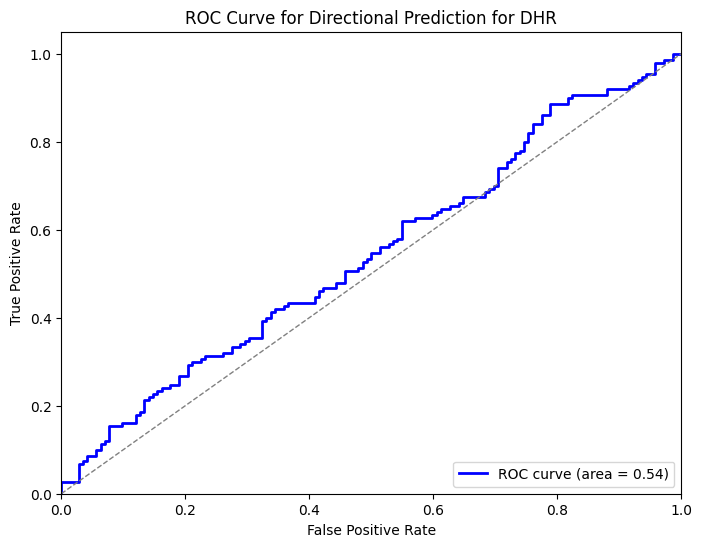


Processing ticker: DIS
Ticker: DIS - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0128 - val_loss: 0.0182
Epoch 2/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9575e-04 - val_loss: 0.0065
Epoch 3/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.0805e-04 - val_loss: 0.0054
Epoch 4/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.0755e-04 - val_loss: 0.0050
Epoch 5/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.6903e-04 - val_loss: 0.0043
Epoch 6/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.6852e-04 - val_loss: 0.0040
Epoch 7/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.5889e-04 - val_loss: 0.0044
Epoch 8/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.5847e-04 - val_loss: 0.0031
Epoch 9/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.4945e-04 - val_loss: 0.0034
Epoch 10/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.5175e-04 - val_loss: 0.0028
Epoch 11/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.3289e-04 - val_loss: 0.0027
Epoch 12/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms

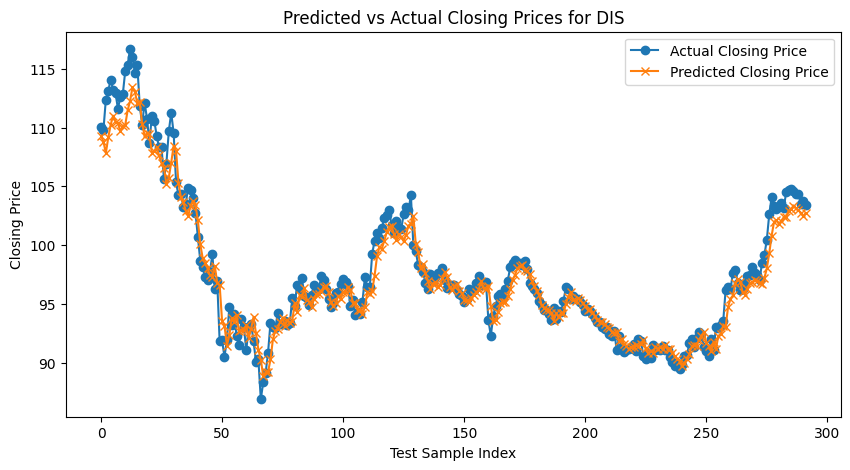

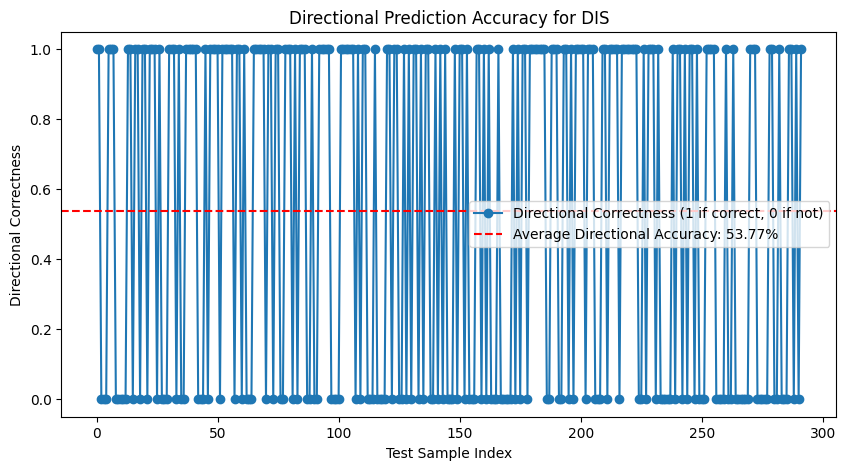

ROC AUC for DIS: 0.53


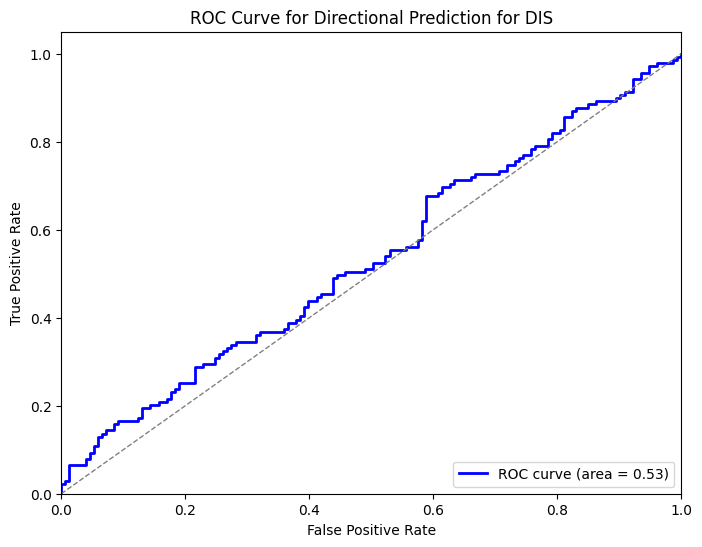


Processing ticker: GE
Ticker: GE - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0812 - val_loss: 0.0021
Epoch 2/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.3287e-04 - val_loss: 0.0032
Epoch 3/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4442e-04 - val_loss: 0.0021
Epoch 4/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6106e-04 - val_loss: 0.0019
Epoch 5/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3802e-04 - val_loss: 0.0017
Epoch 6/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3471e-04 - val_loss: 0.0015
Epoch 7/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8090e-04 - val_loss: 0.0016
Epoch 8/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1311e-04 - val_loss: 0.0015
Epoch 9/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6872e-04 - val_loss: 0.0012
Epoch 10/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5608e-04 - val_loss: 0.0012
Epoch 11/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.5428e-04 - val_loss: 0.0010
Epoch 12/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms

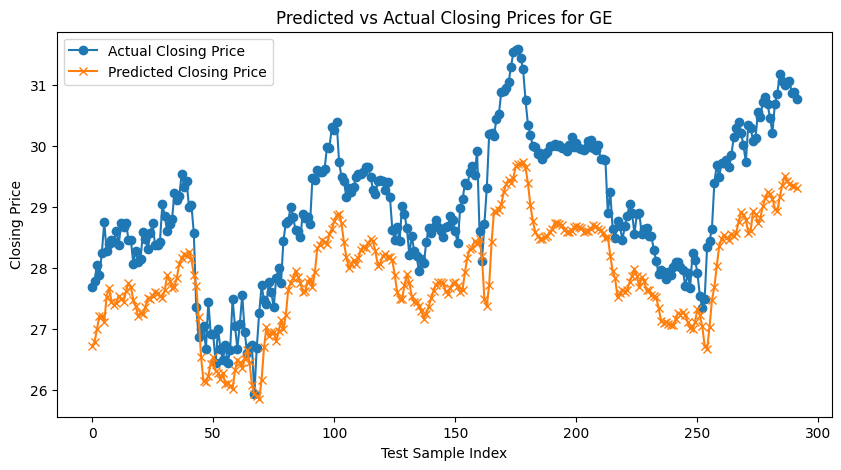

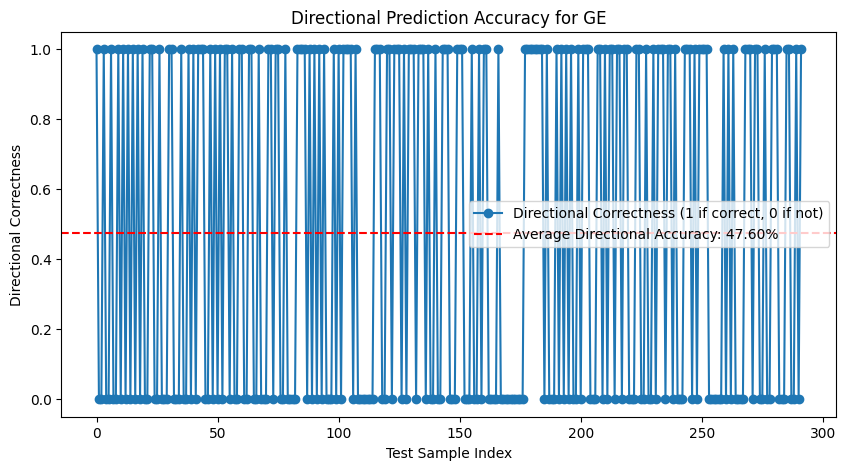

ROC AUC for GE: 0.54


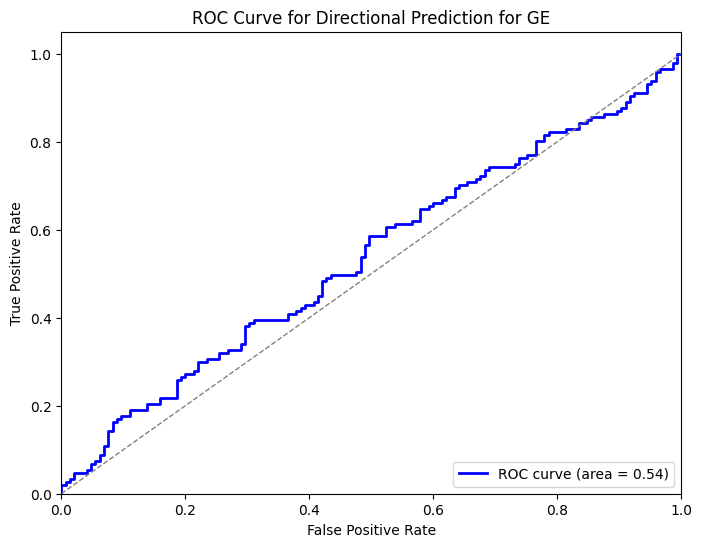


Processing ticker: GOOGL
Ticker: GOOGL - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0183 - val_loss: 0.0040
Epoch 2/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2531e-04 - val_loss: 0.0021
Epoch 3/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0925e-04 - val_loss: 0.0021
Epoch 4/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.1160e-04 - val_loss: 0.0017
Epoch 5/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.7237e-04 - val_loss: 0.0016
Epoch 6/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.4168e-04 - val_loss: 0.0013
Epoch 7/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.4574e-04 - val_loss: 0.0012
Epoch 8/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.3138e-04 - val_loss: 0.0011
Epoch 9/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.5647e-04 - val_loss: 0.0012
Epoch 10/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.0426e-04 - val_loss: 9.6521e-04
Epoch 11/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.1672e-04 - val_loss: 9.4237e-04
Epoch 12/50
28/28 ━━━━━━━━━━━━━━━━━━━

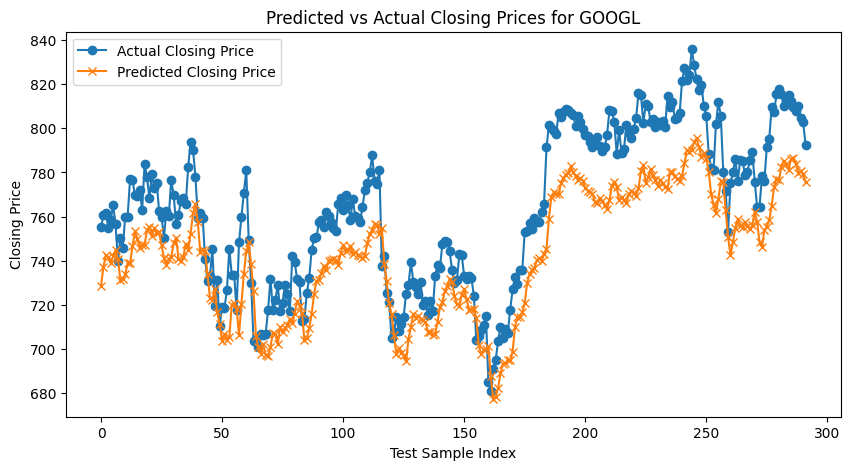

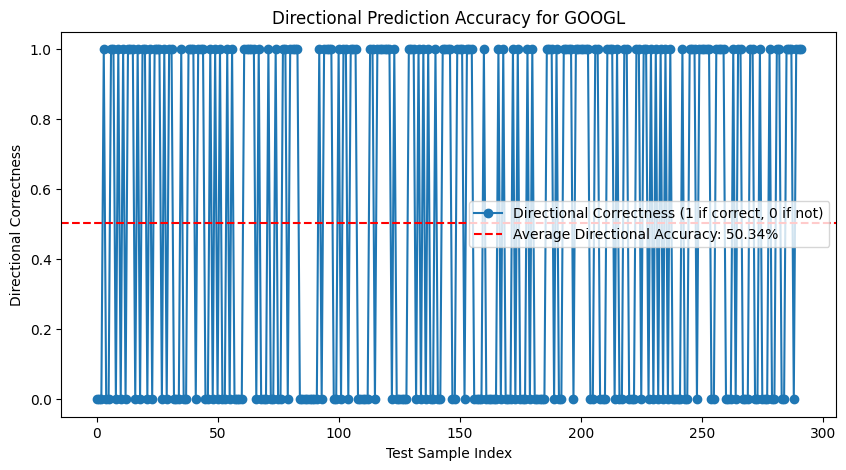

ROC AUC for GOOGL: 0.61


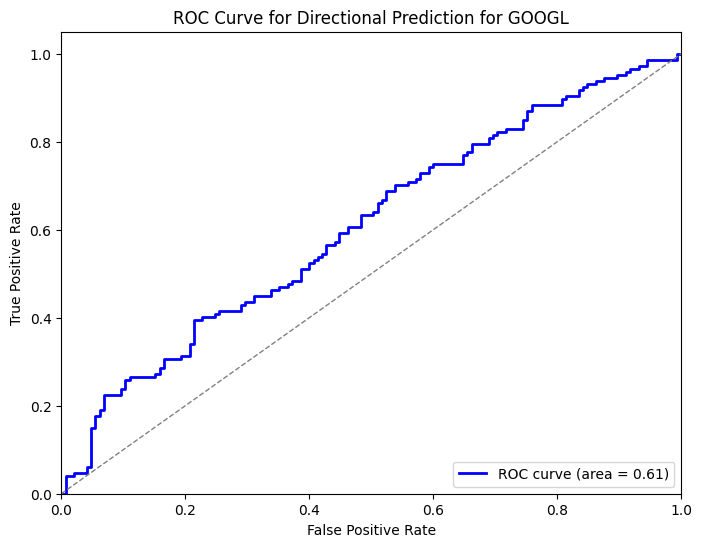


Processing ticker: GS
Ticker: GS - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0165 - val_loss: 0.0049
Epoch 2/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0015 - val_loss: 0.0049
Epoch 3/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0011 - val_loss: 0.0046
Epoch 4/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 8.7155e-04 - val_loss: 0.0031
Epoch 5/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.0734e-04 - val_loss: 0.0033
Epoch 6/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.7259e-04 - val_loss: 0.0024
Epoch 7/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1710e-04 - val_loss: 0.0021
Epoch 8/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 6.6957e-04 - val_loss: 0.0014
Epoch 9/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 5.6595e-04 - val_loss: 0.0012
Epoch 10/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 5.0662e-04 - val_loss: 0.0012
Epoch 11/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6614e-04 - val_loss: 0.0013
Epoch 12/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

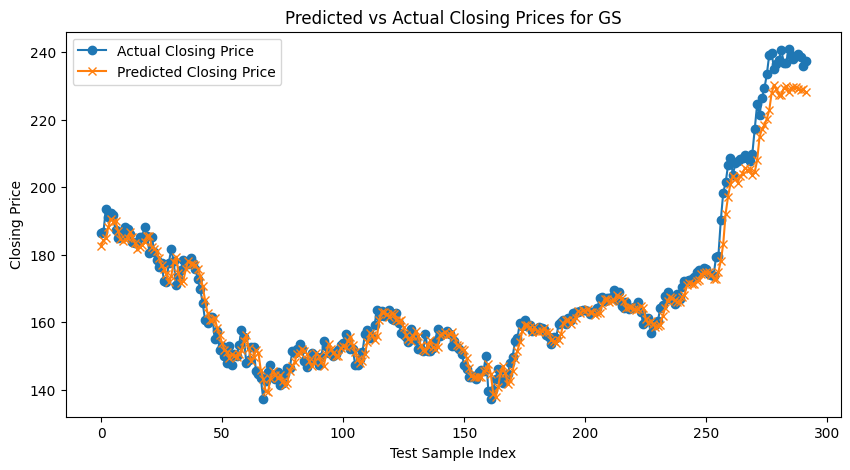

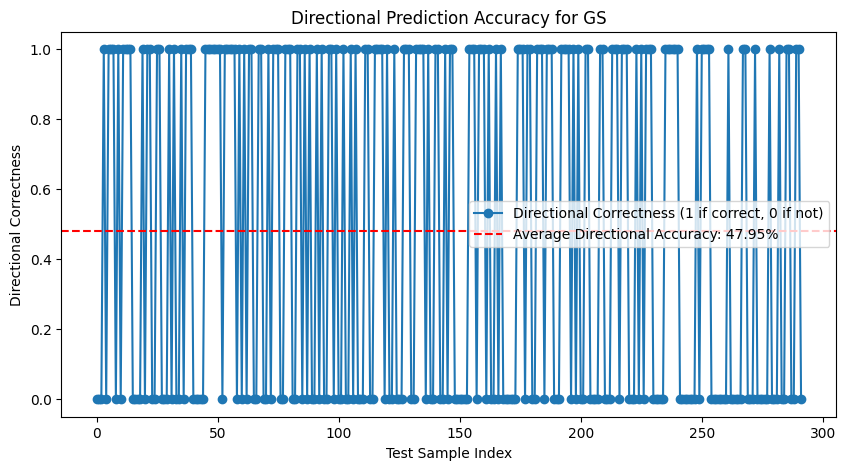

ROC AUC for GS: 0.48


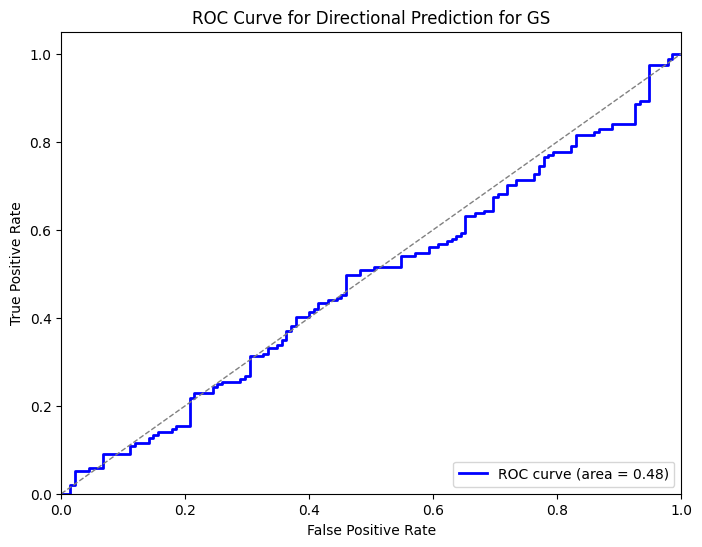


Processing ticker: HD
Ticker: HD - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0076 - val_loss: 0.0122
Epoch 2/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1.6917e-04 - val_loss: 0.0043
Epoch 3/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1.0318e-04 - val_loss: 0.0043
Epoch 4/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 9.3416e-05 - val_loss: 0.0040
Epoch 5/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 8.7962e-05 - val_loss: 0.0043
Epoch 6/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 9.1741e-05 - val_loss: 0.0032
Epoch 7/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 8.8397e-05 - val_loss: 0.0030
Epoch 8/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 8.7534e-05 - val_loss: 0.0029
Epoch 9/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.0452e-05 - val_loss: 0.0032
Epoch 10/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.6908e-05 - val_loss: 0.0042
Epoch 11/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 9.7869e-05 - val_loss: 0.0025
Epoch 12/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5m

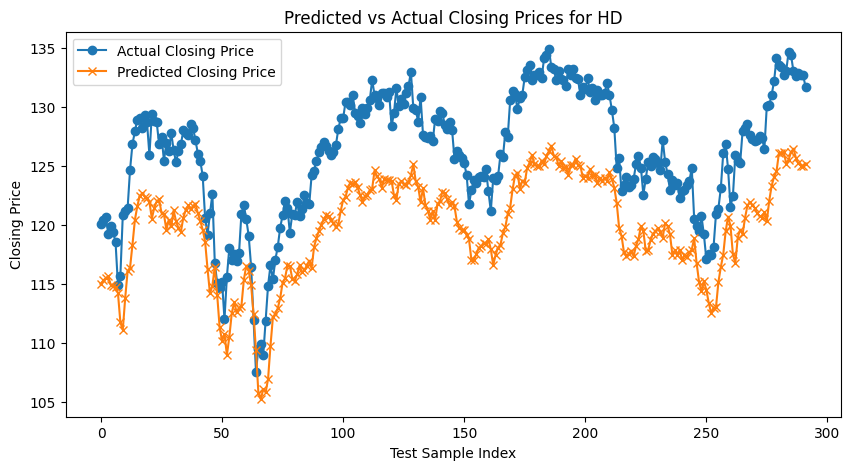

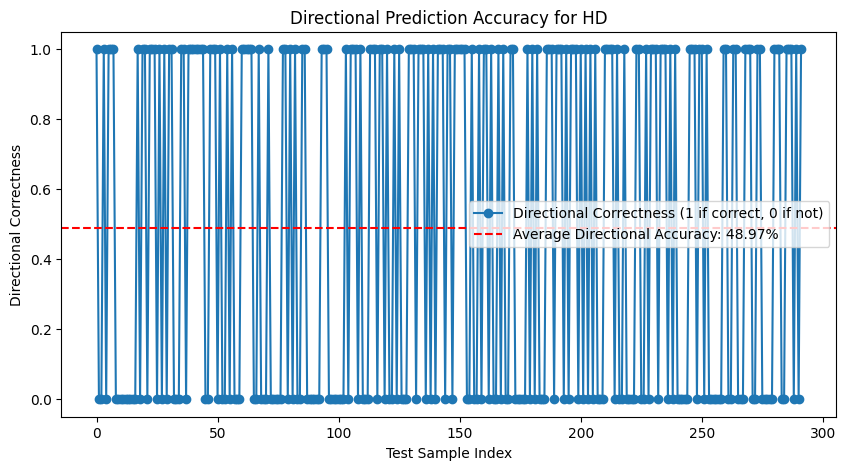

ROC AUC for HD: 0.58


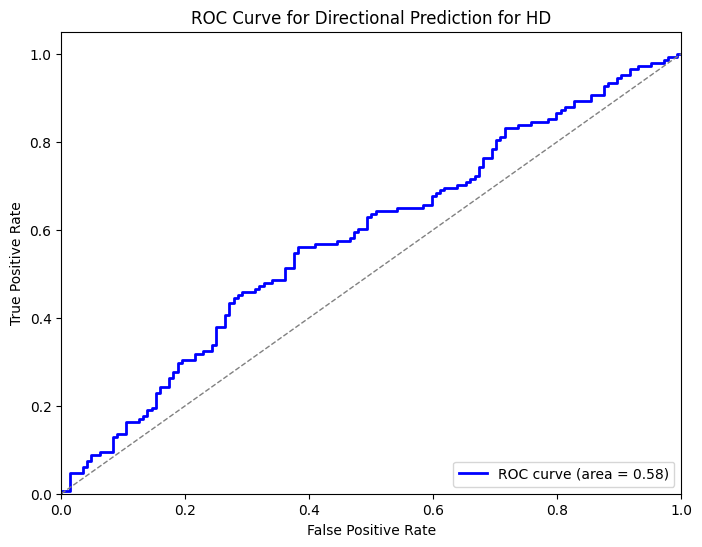


Processing ticker: HON
Ticker: HON - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 0.1529 - val_loss: 0.0062
Epoch 2/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0021 - val_loss: 0.0084
Epoch 3/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 9.1099e-04 - val_loss: 0.0046
Epoch 4/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 8.0770e-04 - val_loss: 0.0028
Epoch 5/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 8.0881e-04 - val_loss: 0.0030
Epoch 6/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.2935e-04 - val_loss: 0.0040
Epoch 7/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.8451e-04 - val_loss: 0.0027
Epoch 8/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.5717e-04 - val_loss: 0.0033
Epoch 9/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.4224e-04 - val_loss: 0.0022
Epoch 10/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.0521e-04 - val_loss: 0.0035
Epoch 11/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.7513e-04 - val_loss: 0.0014
Epoch 12/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/st

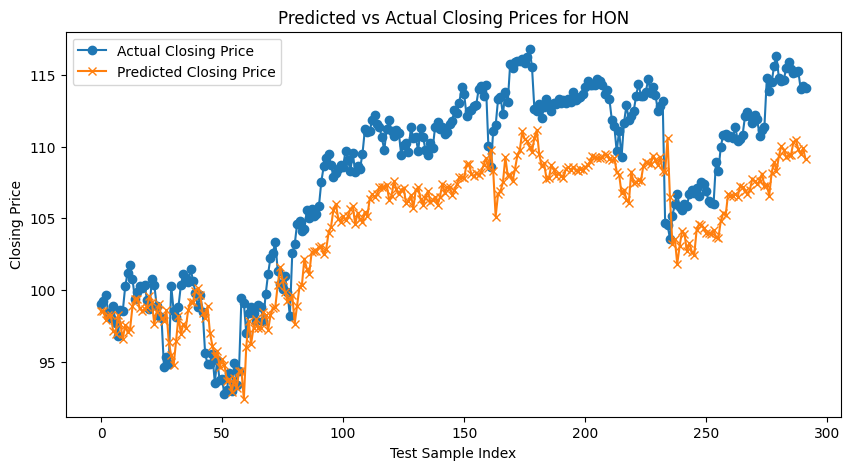

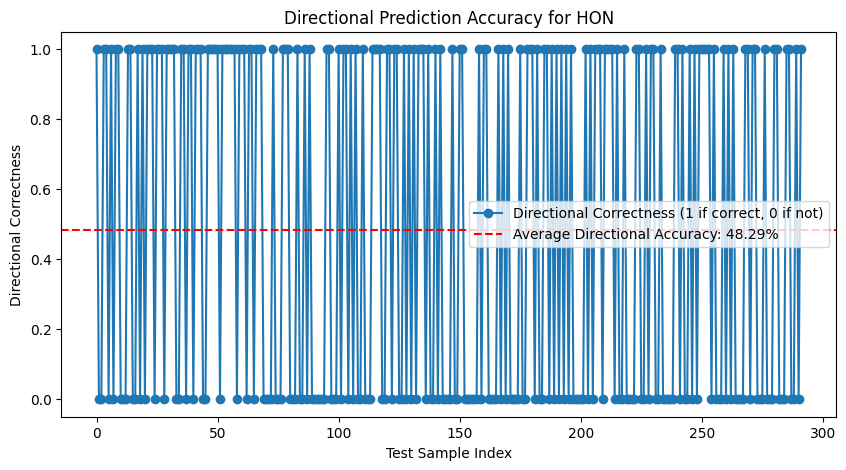

ROC AUC for HON: 0.52


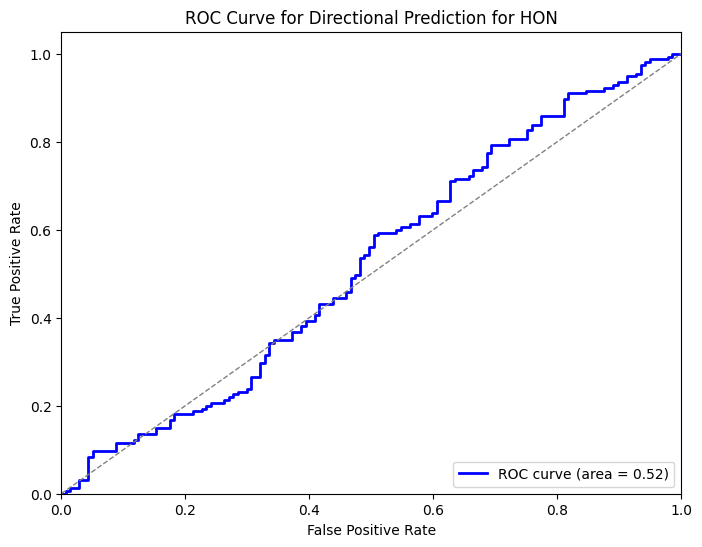


Processing ticker: IBM
Ticker: IBM - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0217 - val_loss: 0.0024
Epoch 2/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 3/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0017 - val_loss: 0.0023
Epoch 4/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 5/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0014 - val_loss: 0.0016
Epoch 6/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0013 - val_loss: 0.0014
Epoch 7/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0013 - val_loss: 0.0015
Epoch 8/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0013 - val_loss: 0.0011
Epoch 9/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0014 - val_loss: 0.0011
Epoch 10/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 9.9806e-04 - val_loss: 0.0017
Epoch 11/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0010 - val_loss: 9.3999e-04
Epoch 12/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0011 - val_loss

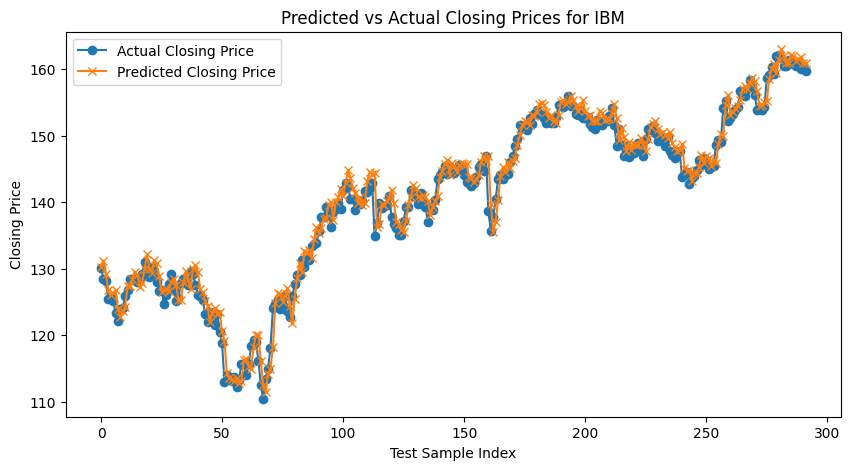

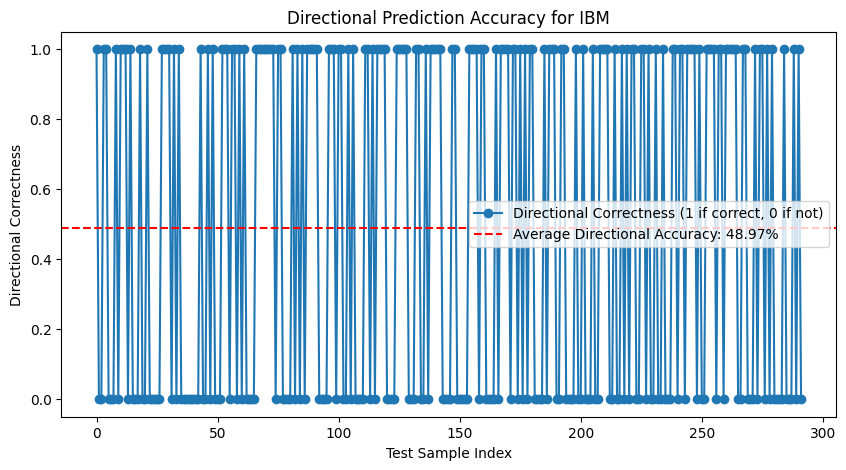

ROC AUC for IBM: 0.46


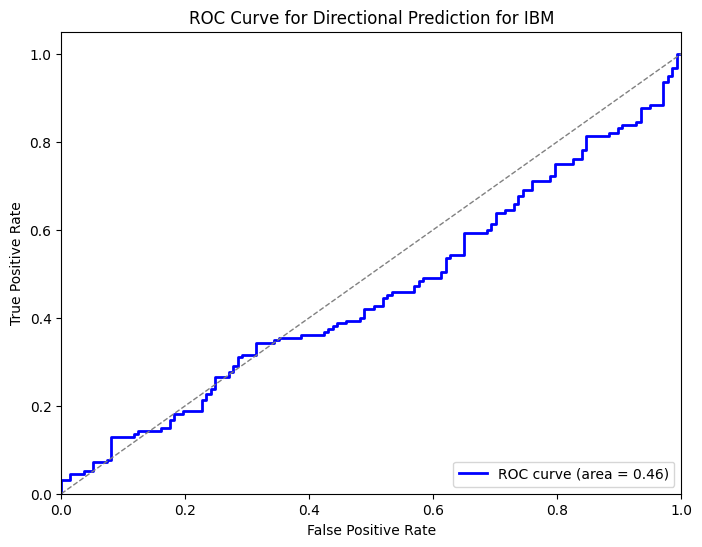


Processing ticker: INTU
Ticker: INTU - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0138 - val_loss: 0.0211
Epoch 2/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 9.6836e-04 - val_loss: 0.0113
Epoch 3/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.1927e-04 - val_loss: 0.0072
Epoch 4/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3110e-04 - val_loss: 0.0062
Epoch 5/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7342e-04 - val_loss: 0.0053
Epoch 6/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0926e-04 - val_loss: 0.0064
Epoch 7/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8512e-04 - val_loss: 0.0052
Epoch 8/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.8668e-04 - val_loss: 0.0034
Epoch 9/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.6477e-04 - val_loss: 0.0029
Epoch 10/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.4748e-04 - val_loss: 0.0027
Epoch 11/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.4112e-04 - val_loss: 0.0029
Epoch 12/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5m

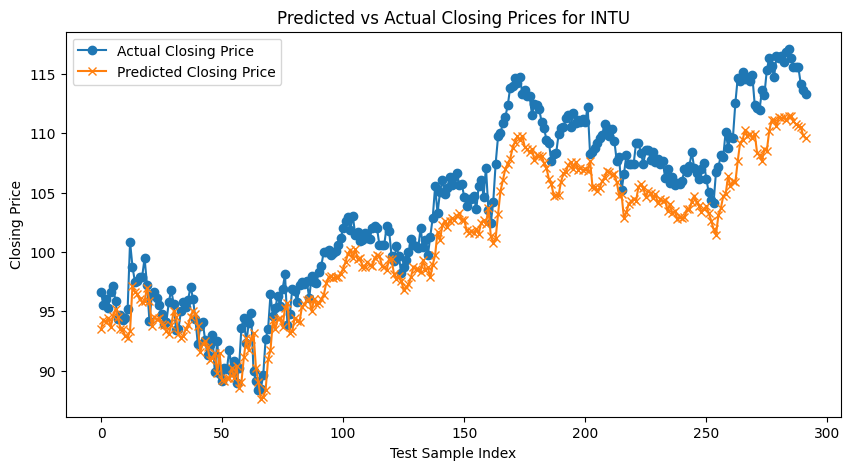

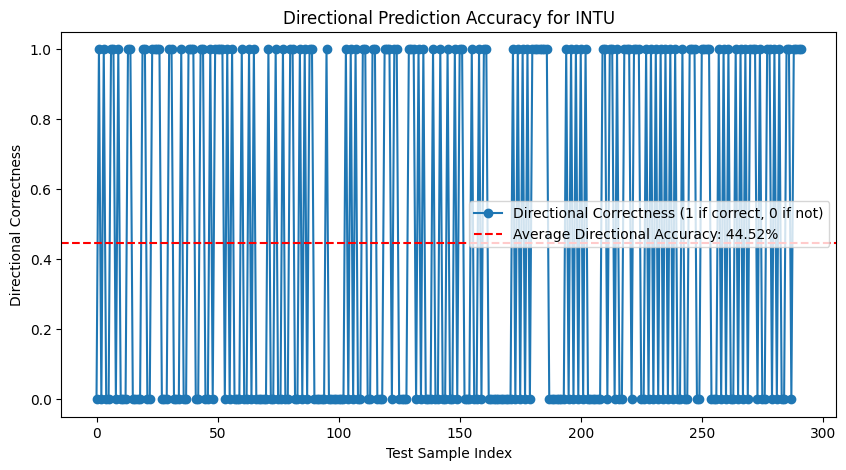

ROC AUC for INTU: 0.58


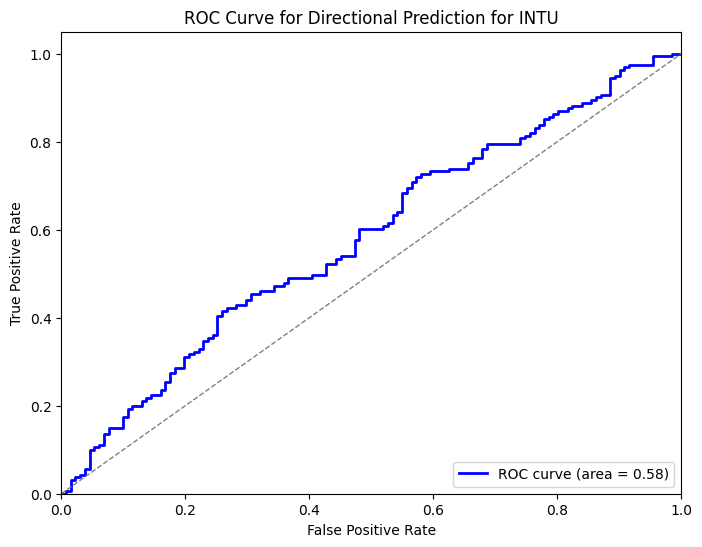


Processing ticker: JNJ
Ticker: JNJ - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.1418 - val_loss: 0.0131
Epoch 2/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0026 - val_loss: 0.0025
Epoch 3/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 9.3065e-04 - val_loss: 0.0019
Epoch 4/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 8.8999e-04 - val_loss: 0.0016
Epoch 5/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.8604e-04 - val_loss: 0.0014
Epoch 6/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.0230e-04 - val_loss: 0.0013
Epoch 7/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.7662e-04 - val_loss: 0.0013
Epoch 8/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.9286e-04 - val_loss: 0.0011
Epoch 9/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.5242e-04 - val_loss: 0.0016
Epoch 10/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7780e-04 - val_loss: 0.0010
Epoch 11/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5142e-04 - val_loss: 0.0010
Epoch 12/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/st

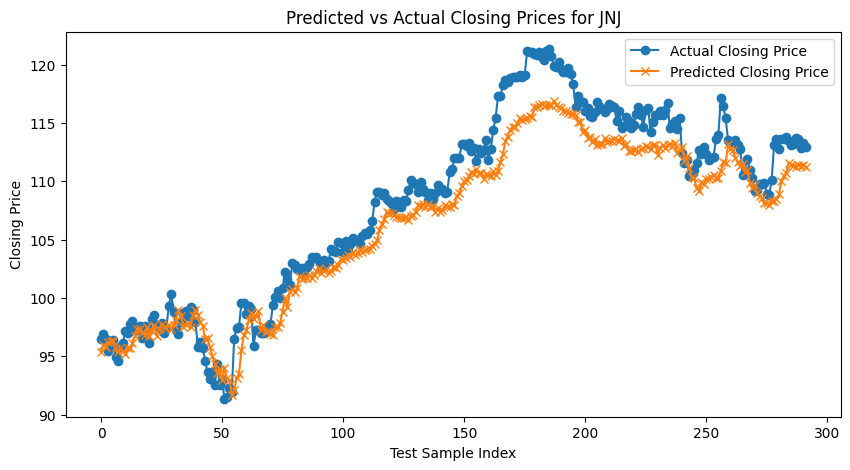

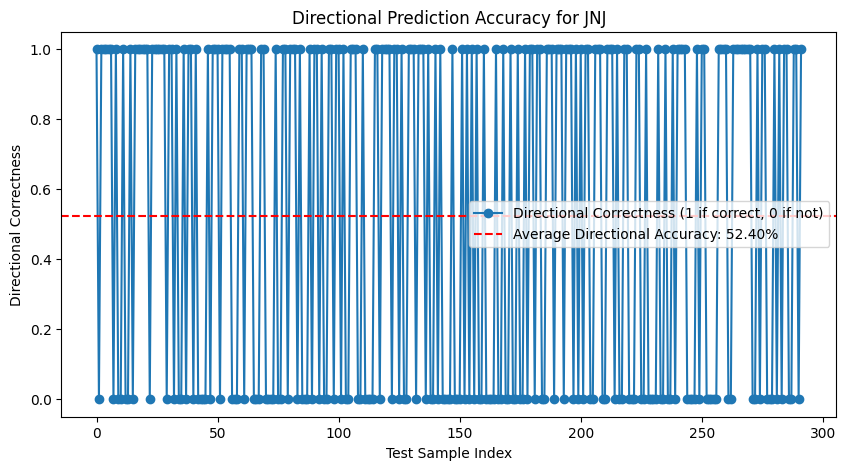

ROC AUC for JNJ: 0.57


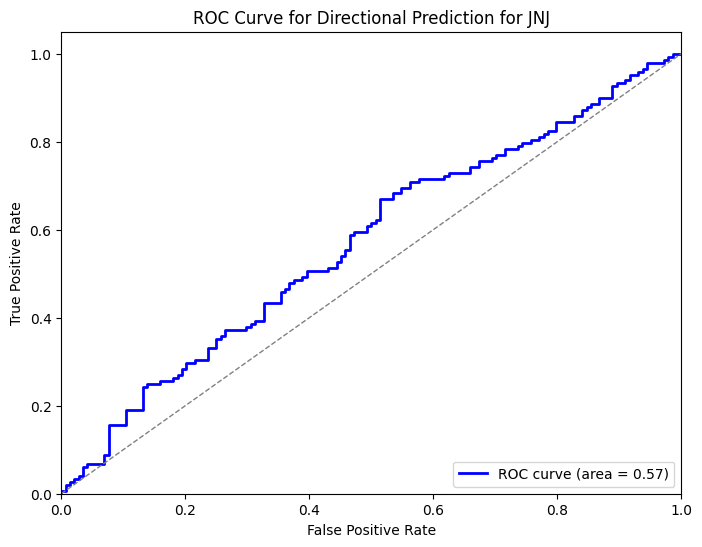


Processing ticker: JPM
Ticker: JPM - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0137 - val_loss: 9.2646e-04
Epoch 2/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0011 - val_loss: 0.0011
Epoch 3/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.4072e-04 - val_loss: 0.0013
Epoch 4/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.5914e-04 - val_loss: 0.0013
Epoch 5/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8402e-04 - val_loss: 9.1757e-04
Epoch 6/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8636e-04 - val_loss: 8.1053e-04
Epoch 7/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9942e-04 - val_loss: 6.7732e-04
Epoch 8/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8278e-04 - val_loss: 6.1542e-04
Epoch 9/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.5856e-04 - val_loss: 6.0269e-04
Epoch 10/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.4296e-04 - val_loss: 4.5552e-04
Epoch 11/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.6795e-04 - val_loss: 4.3963e-04
Epoch 12/50
28/2

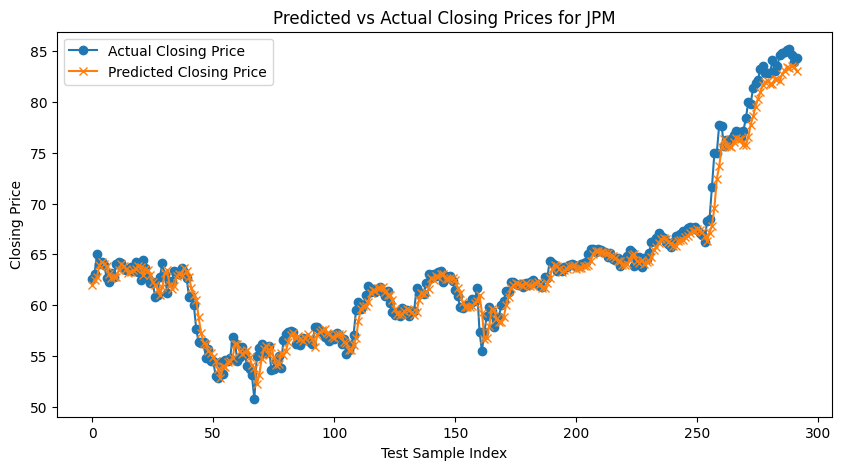

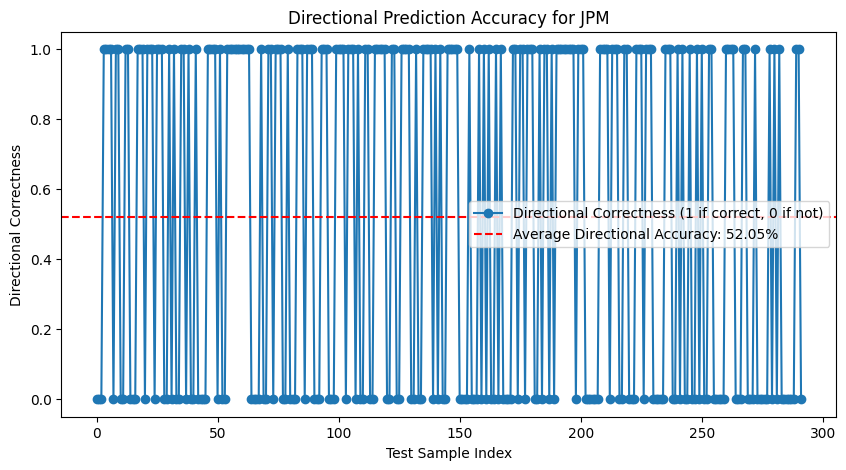

ROC AUC for JPM: 0.51


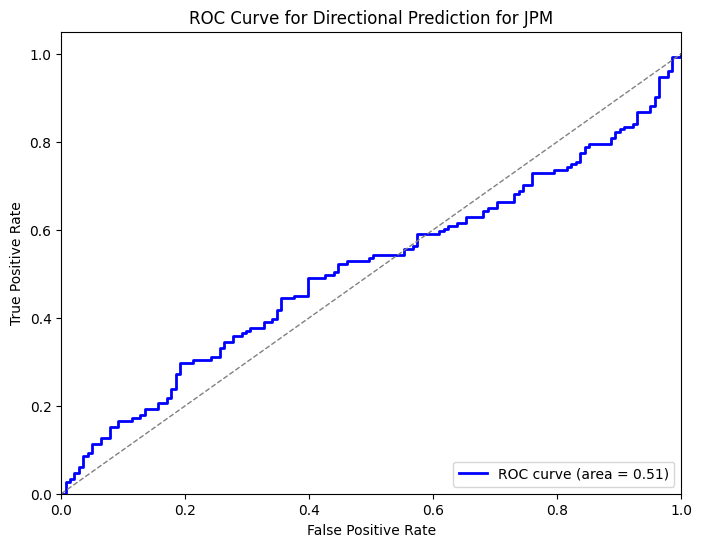


Processing ticker: KO
Ticker: KO - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0273 - val_loss: 0.0066
Epoch 2/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0029 - val_loss: 0.0076
Epoch 3/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0020 - val_loss: 0.0029
Epoch 4/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0020 - val_loss: 0.0028
Epoch 5/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0019 - val_loss: 0.0037
Epoch 6/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0015 - val_loss: 0.0024
Epoch 7/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0014 - val_loss: 0.0064
Epoch 8/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0018 - val_loss: 0.0024
Epoch 9/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0012 - val_loss: 0.0021
Epoch 10/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0011 - val_loss: 0.0022
Epoch 11/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 9.7941e-04 - val_loss: 0.0019
Epoch 12/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 9.6478e-04 - val_loss

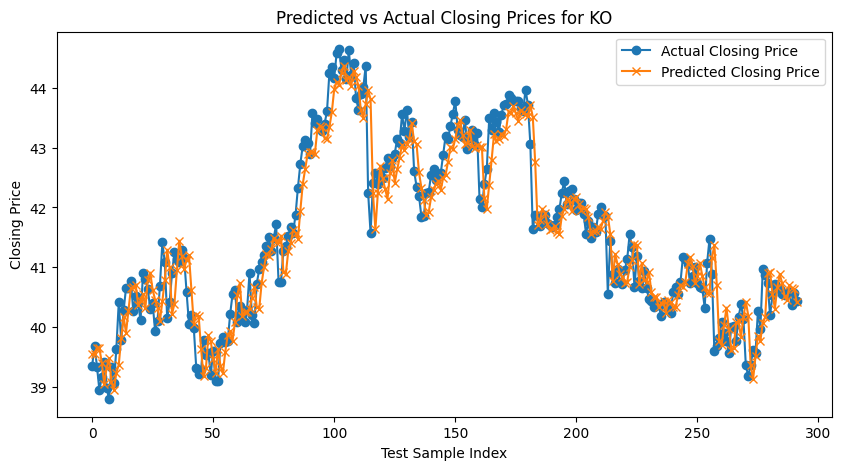

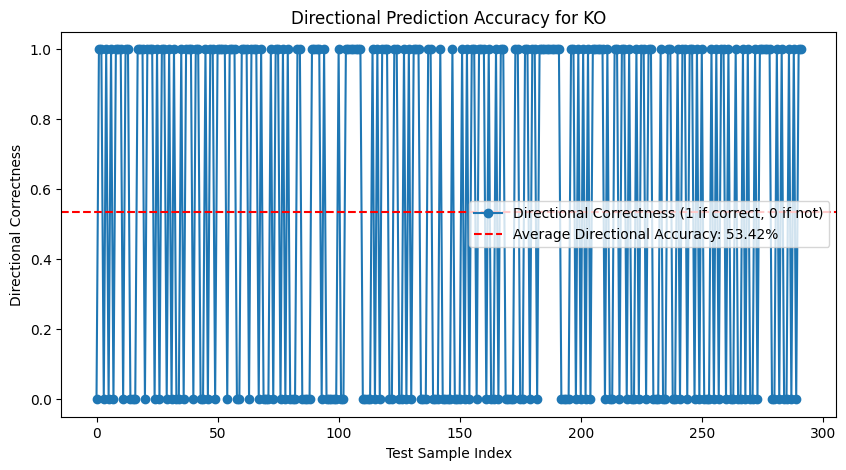

ROC AUC for KO: 0.56


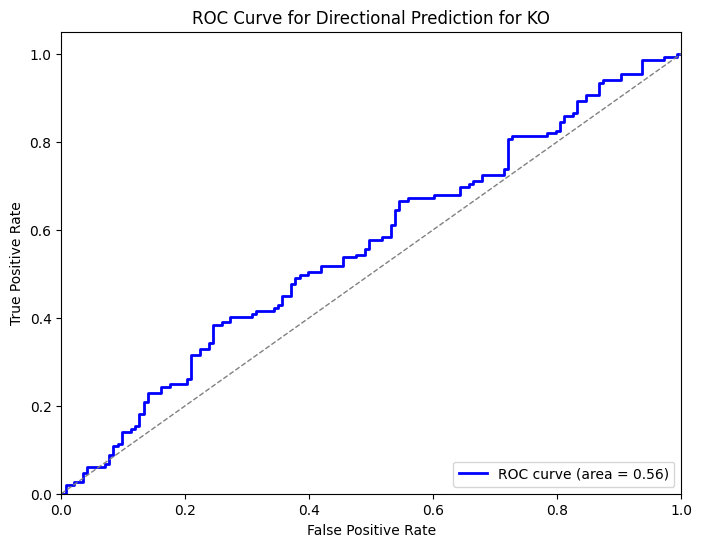


Processing ticker: LLY
Ticker: LLY - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0633 - val_loss: 0.0568
Epoch 2/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0014 - val_loss: 0.0288
Epoch 3/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.1121e-04 - val_loss: 0.0245
Epoch 4/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.4845e-04 - val_loss: 0.0213
Epoch 5/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1788e-04 - val_loss: 0.0177
Epoch 6/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0909e-04 - val_loss: 0.0156
Epoch 7/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2837e-04 - val_loss: 0.0164
Epoch 8/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9256e-04 - val_loss: 0.0148
Epoch 9/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.7542e-04 - val_loss: 0.0124
Epoch 10/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.4372e-04 - val_loss: 0.0116
Epoch 11/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.3765e-04 - val_loss: 0.0093
Epoch 12/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/ste

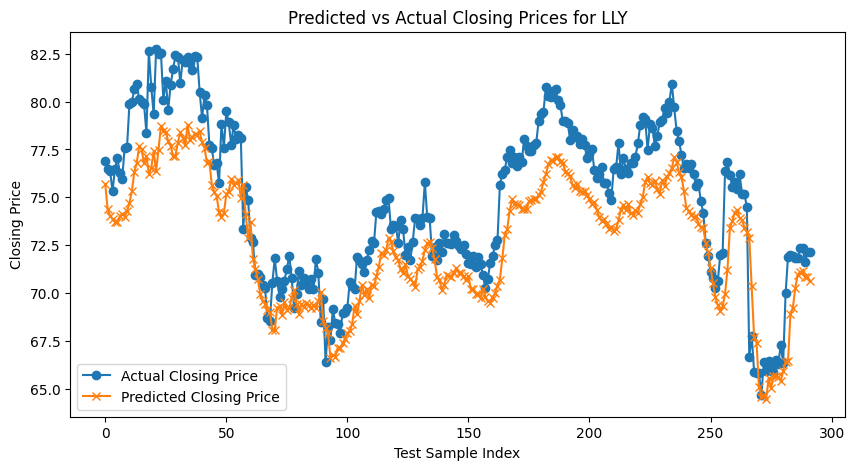

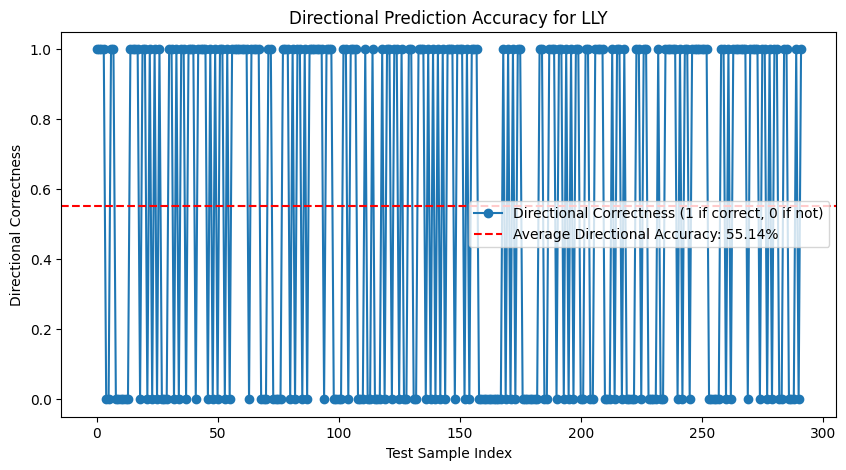

ROC AUC for LLY: 0.56


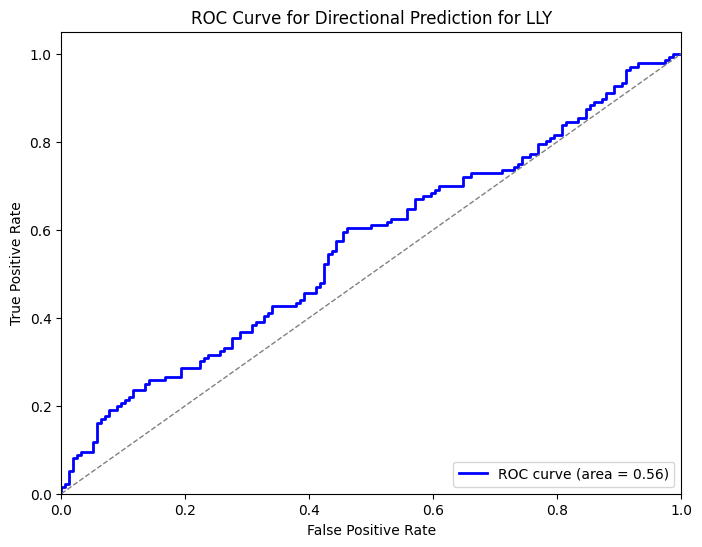


Processing ticker: MCD
Ticker: MCD - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0313 - val_loss: 0.0054
Epoch 2/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.4334e-04 - val_loss: 0.0022
Epoch 3/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3889e-04 - val_loss: 0.0017
Epoch 4/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.7935e-04 - val_loss: 0.0018
Epoch 5/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2428e-04 - val_loss: 0.0017
Epoch 6/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0879e-04 - val_loss: 0.0016
Epoch 7/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0604e-04 - val_loss: 0.0014
Epoch 8/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8127e-04 - val_loss: 0.0016
Epoch 9/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.6426e-04 - val_loss: 0.0013
Epoch 10/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.2516e-04 - val_loss: 0.0014
Epoch 11/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.6912e-04 - val_loss: 0.0014
Epoch 12/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms

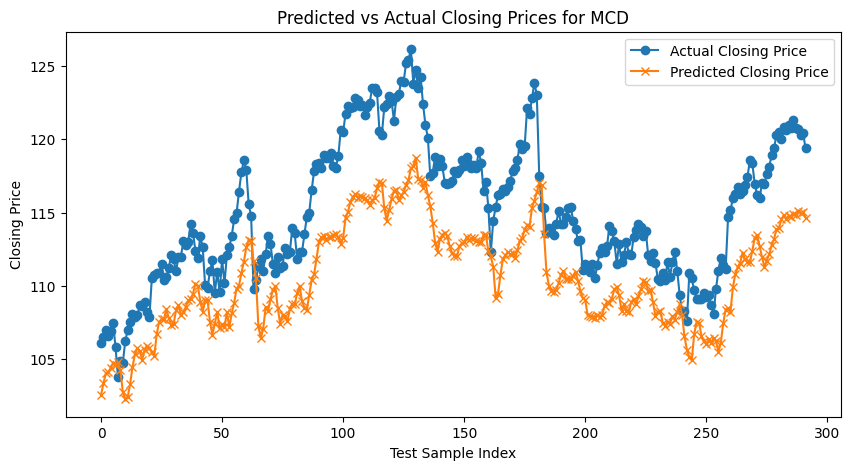

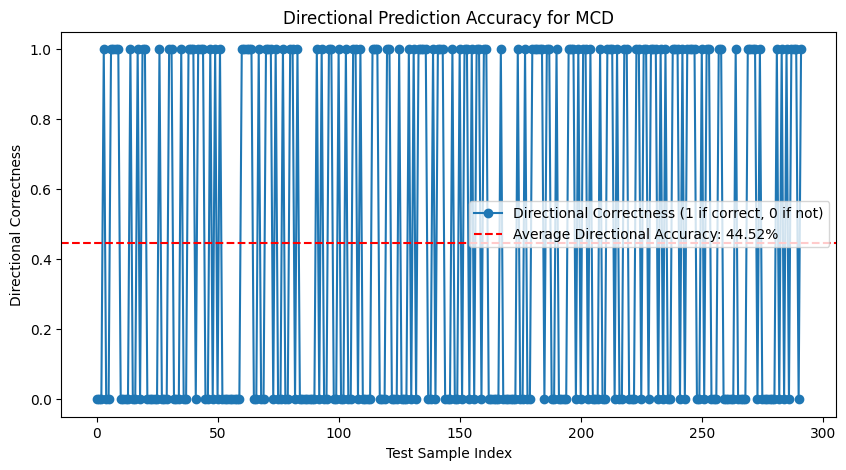

ROC AUC for MCD: 0.52


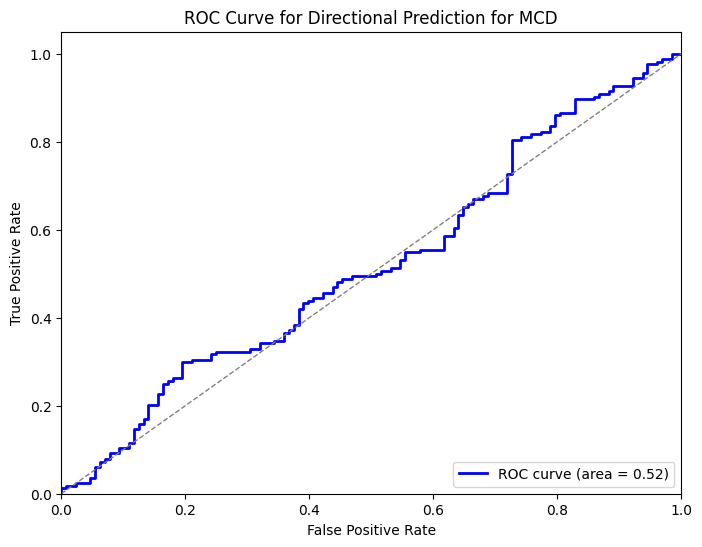


Processing ticker: MRK
Ticker: MRK - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0576 - val_loss: 0.0196
Epoch 2/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0027 - val_loss: 0.0028
Epoch 3/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0014 - val_loss: 0.0018
Epoch 4/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 9.7649e-04 - val_loss: 0.0026
Epoch 5/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.0525e-04 - val_loss: 0.0018
Epoch 6/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.6691e-04 - val_loss: 0.0021
Epoch 7/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0010 - val_loss: 0.0020
Epoch 8/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.0543e-04 - val_loss: 0.0016
Epoch 9/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2097e-04 - val_loss: 0.0015
Epoch 10/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.0631e-04 - val_loss: 0.0017
Epoch 11/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2529e-04 - val_loss: 0.0015
Epoch 12/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss

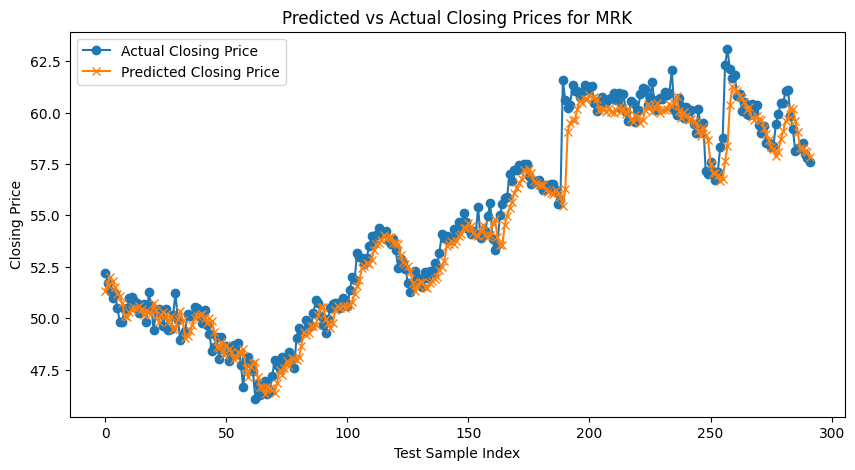

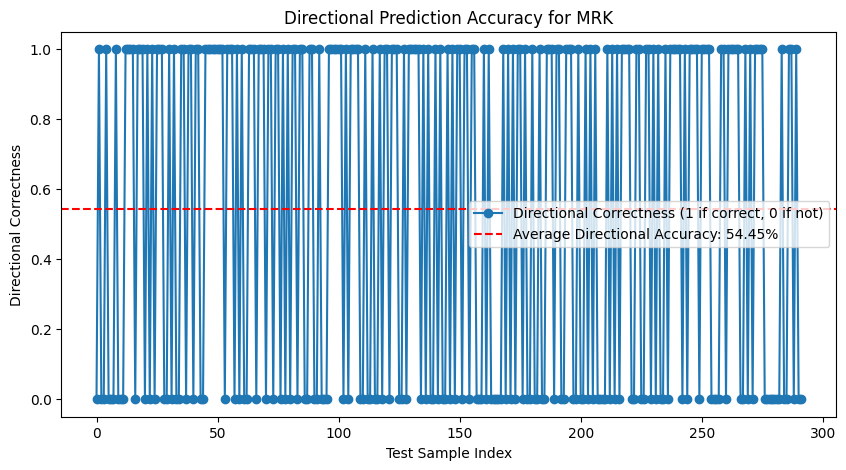

ROC AUC for MRK: 0.60


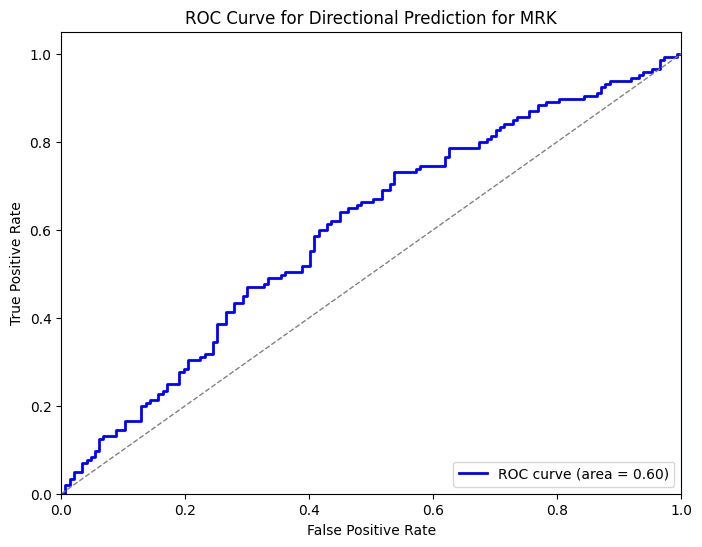


Processing ticker: MSFT
Ticker: MSFT - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0231 - val_loss: 0.0050
Epoch 2/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 8.5169e-04 - val_loss: 0.0042
Epoch 3/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 5.5734e-04 - val_loss: 0.0042
Epoch 4/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0464e-04 - val_loss: 0.0039
Epoch 5/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2704e-04 - val_loss: 0.0044
Epoch 6/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8016e-04 - val_loss: 0.0028
Epoch 7/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.5279e-04 - val_loss: 0.0024
Epoch 8/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.2677e-04 - val_loss: 0.0021
Epoch 9/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.9262e-04 - val_loss: 0.0021
Epoch 10/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.9288e-04 - val_loss: 0.0017
Epoch 11/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.3968e-04 - val_loss: 0.0015
Epoch 12/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5m

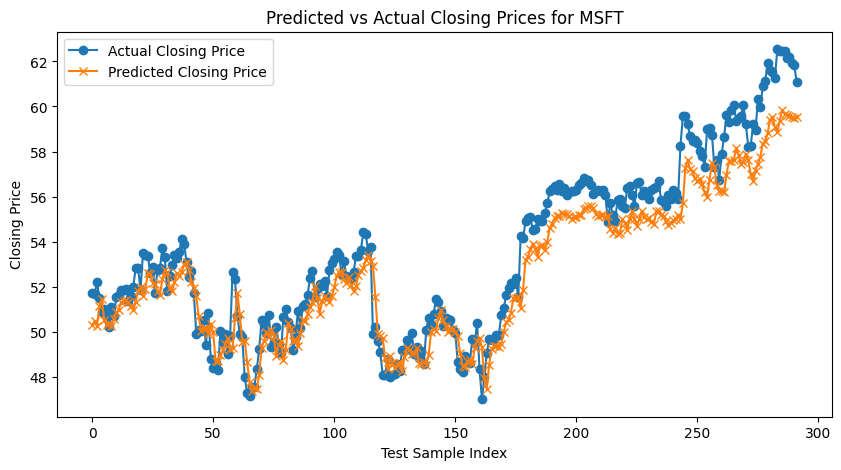

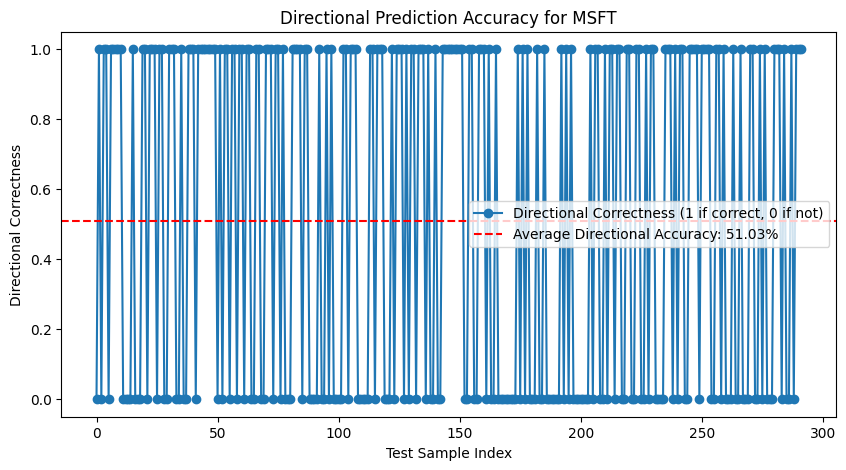

ROC AUC for MSFT: 0.55


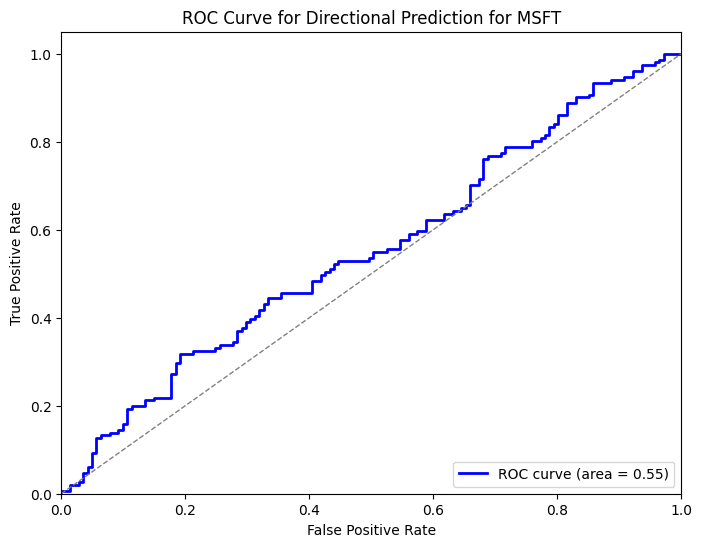


Processing ticker: NVDA
Ticker: NVDA - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0083 - val_loss: 6.1366e-04
Epoch 2/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.4563e-04 - val_loss: 6.3113e-04
Epoch 3/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.1709e-04 - val_loss: 3.6237e-04
Epoch 4/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 8.5191e-05 - val_loss: 2.6674e-04
Epoch 5/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 8.1862e-05 - val_loss: 2.6812e-04
Epoch 6/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 6.5978e-05 - val_loss: 1.7914e-04
Epoch 7/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 5.9970e-05 - val_loss: 1.7128e-04
Epoch 8/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.8900e-05 - val_loss: 1.4114e-04
Epoch 9/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6797e-05 - val_loss: 1.3049e-04
Epoch 10/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1107e-05 - val_loss: 1.1154e-04
Epoch 11/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7513e-05 - val_loss: 1.2345e-04


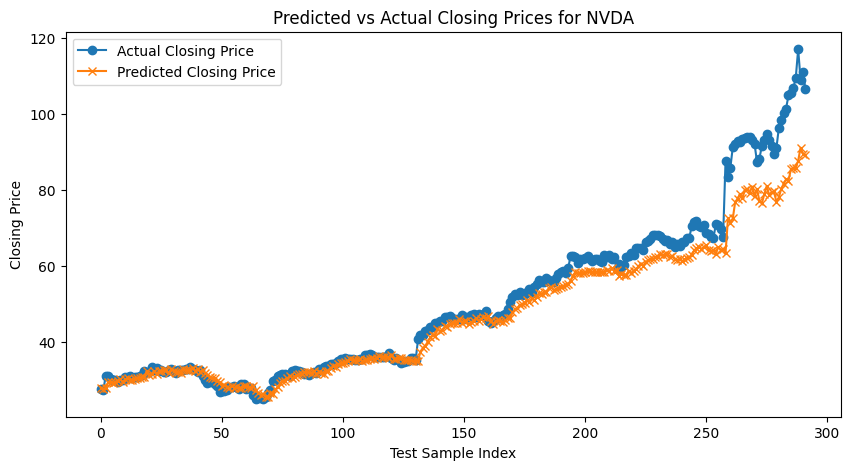

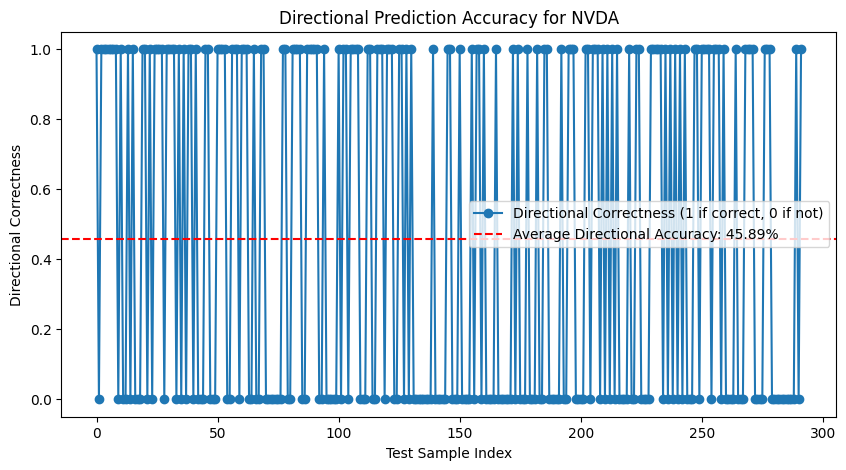

ROC AUC for NVDA: 0.50


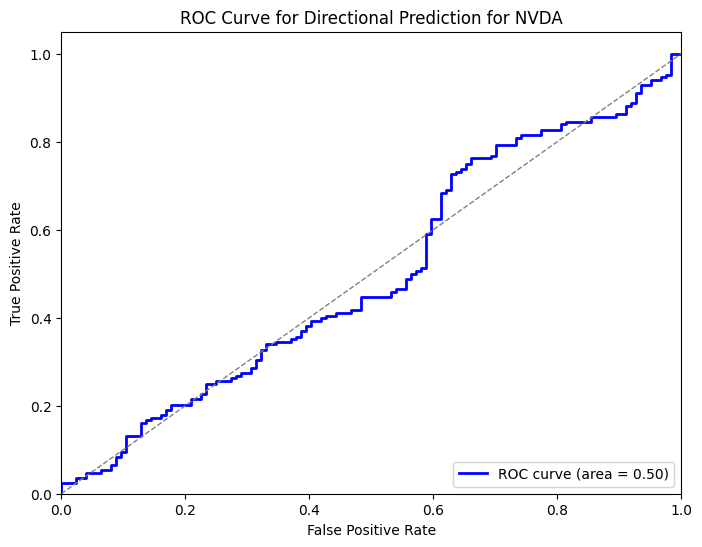


Processing ticker: ORCL
Ticker: ORCL - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.2662 - val_loss: 0.0161
Epoch 2/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0039 - val_loss: 0.0039
Epoch 3/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0026 - val_loss: 0.0044
Epoch 4/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0023 - val_loss: 0.0027
Epoch 5/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 6/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0014 - val_loss: 0.0020
Epoch 7/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0013 - val_loss: 0.0018
Epoch 8/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0012 - val_loss: 0.0016
Epoch 9/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0012 - val_loss: 0.0014
Epoch 10/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 9.6632e-04 - val_loss: 0.0014
Epoch 11/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 9.5710e-04 - val_loss: 0.0015
Epoch 12/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0011 - val_loss

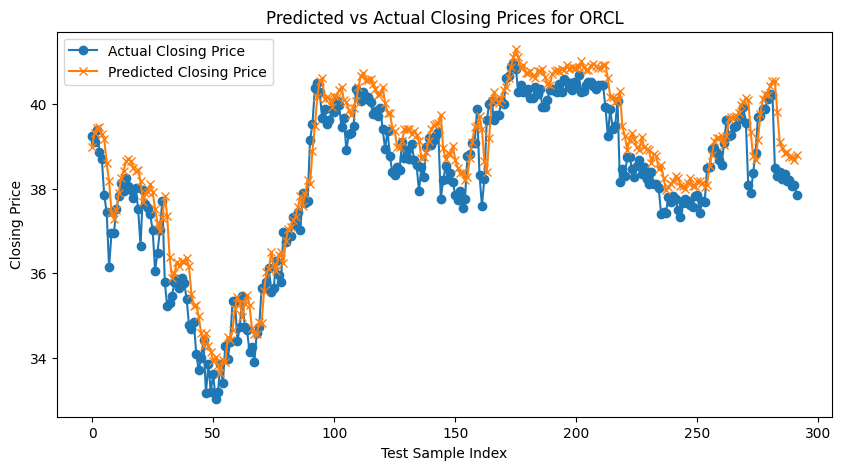

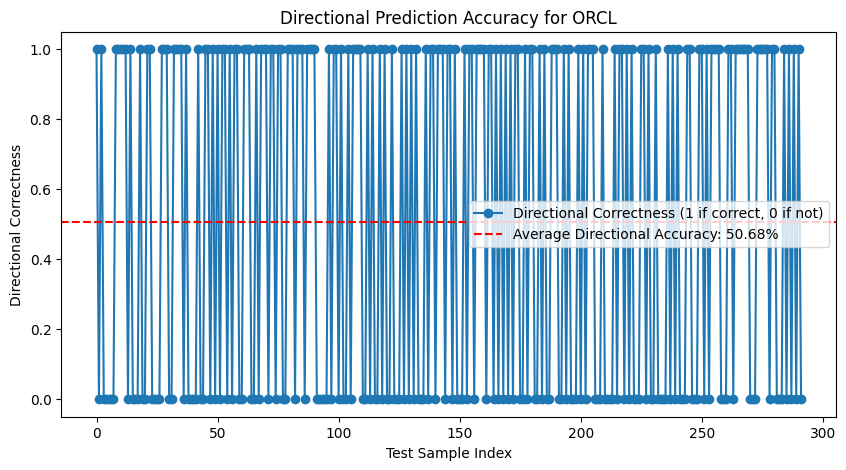

ROC AUC for ORCL: 0.58


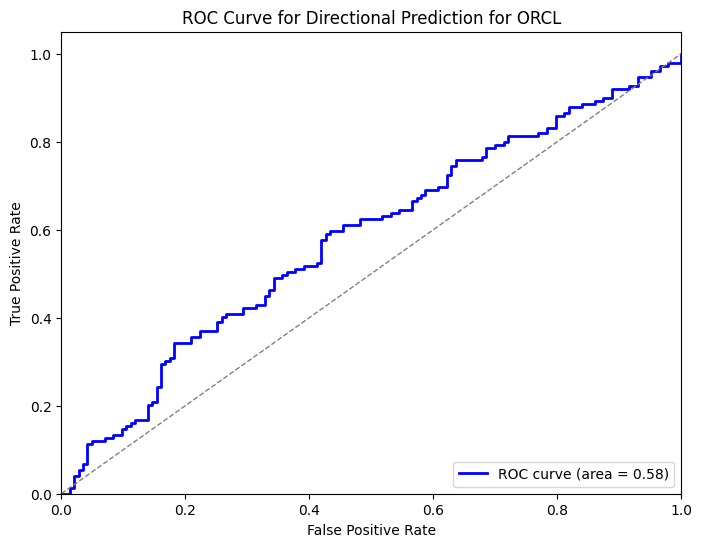


Processing ticker: PEP
Ticker: PEP - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0413 - val_loss: 0.0210
Epoch 2/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 9.3677e-04 - val_loss: 0.0103
Epoch 3/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.4595e-04 - val_loss: 0.0073
Epoch 4/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6389e-04 - val_loss: 0.0054
Epoch 5/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1852e-04 - val_loss: 0.0032
Epoch 6/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.6958e-04 - val_loss: 0.0027
Epoch 7/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.6247e-04 - val_loss: 0.0023
Epoch 8/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.3656e-04 - val_loss: 0.0013
Epoch 9/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.0983e-04 - val_loss: 0.0010
Epoch 10/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.2153e-04 - val_loss: 0.0016
Epoch 11/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3.1834e-04 - val_loss: 0.0017
Epoch 12/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5m

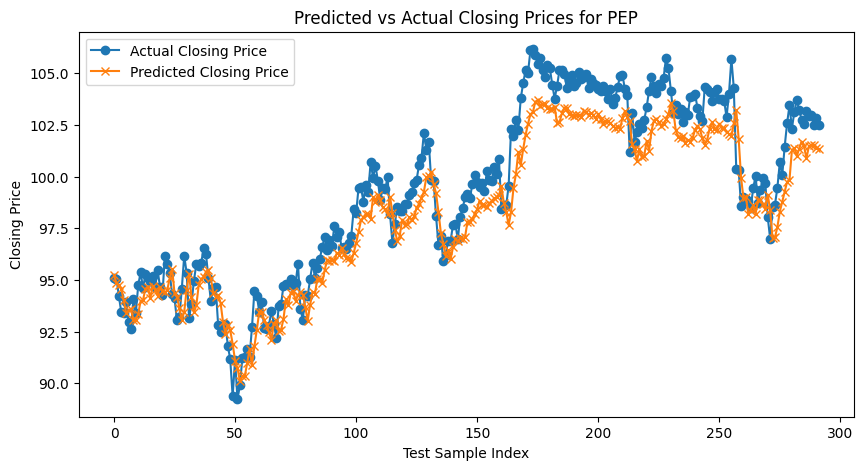

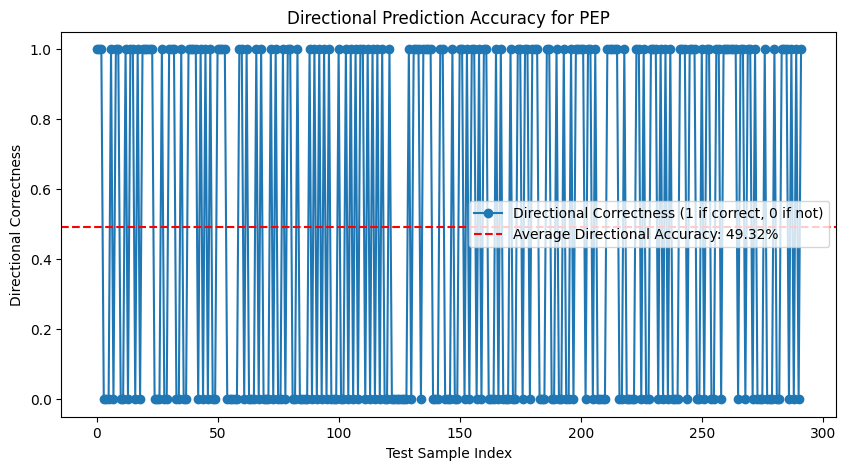

ROC AUC for PEP: 0.59


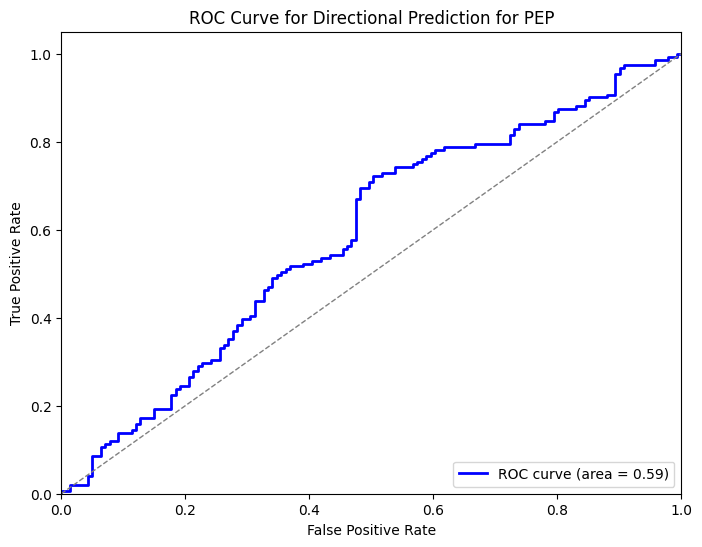


Processing ticker: PFE
Ticker: PFE - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0605 - val_loss: 0.0045
Epoch 2/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 7.8353e-04 - val_loss: 0.0044
Epoch 3/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8581e-04 - val_loss: 0.0037
Epoch 4/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5182e-04 - val_loss: 0.0035
Epoch 5/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.7544e-04 - val_loss: 0.0026
Epoch 6/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.7504e-04 - val_loss: 0.0028
Epoch 7/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.7441e-04 - val_loss: 0.0025
Epoch 8/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.6776e-04 - val_loss: 0.0024
Epoch 9/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8581e-04 - val_loss: 0.0024
Epoch 10/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.4787e-04 - val_loss: 0.0014
Epoch 11/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.6836e-04 - val_loss: 0.0022
Epoch 12/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5m

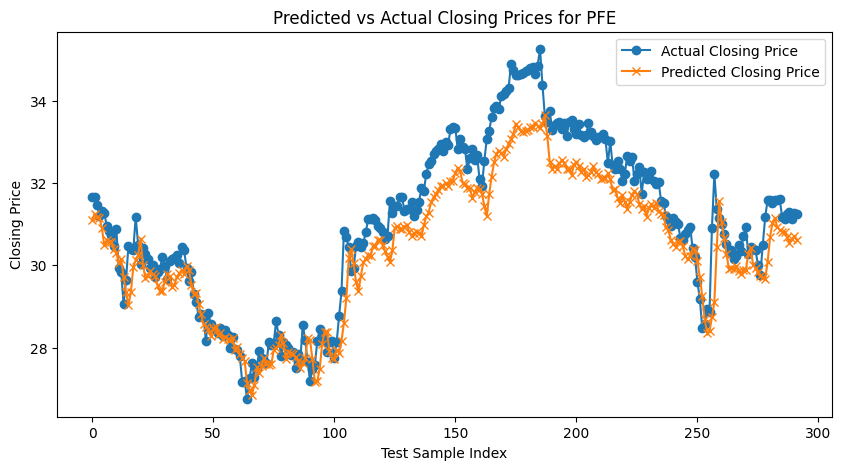

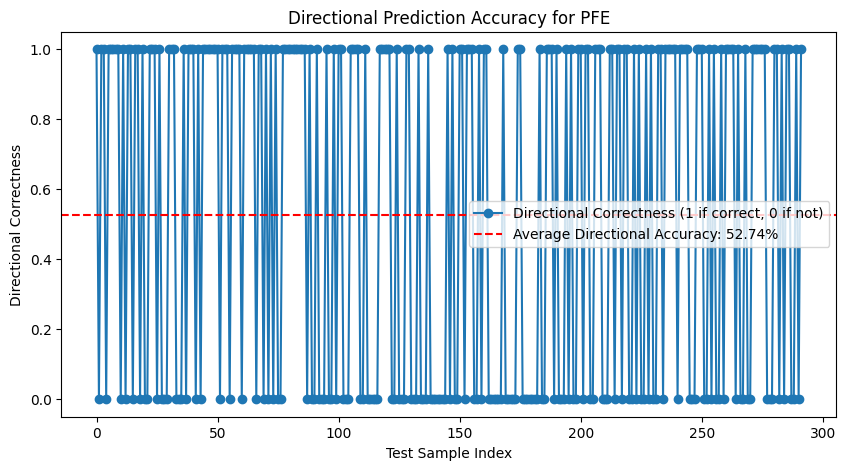

ROC AUC for PFE: 0.49


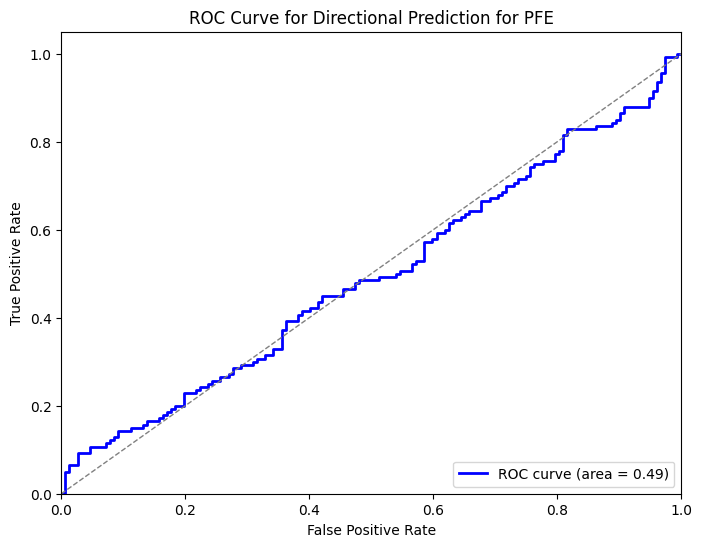


Processing ticker: PG
Ticker: PG - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0076 - val_loss: 7.7597e-04
Epoch 2/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.5155e-04 - val_loss: 8.4515e-04
Epoch 3/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3.8990e-04 - val_loss: 6.5315e-04
Epoch 4/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 6.2368e-04 - val_loss: 6.3088e-04
Epoch 5/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4.2780e-04 - val_loss: 7.8190e-04
Epoch 6/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.3822e-04 - val_loss: 5.7383e-04
Epoch 7/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3.3773e-04 - val_loss: 6.1971e-04
Epoch 8/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.0290e-04 - val_loss: 6.5396e-04
Epoch 9/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.9853e-04 - val_loss: 5.6896e-04
Epoch 10/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4.0250e-04 - val_loss: 5.6092e-04
Epoch 11/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.1972e-04 - val_loss: 5.5343e-04


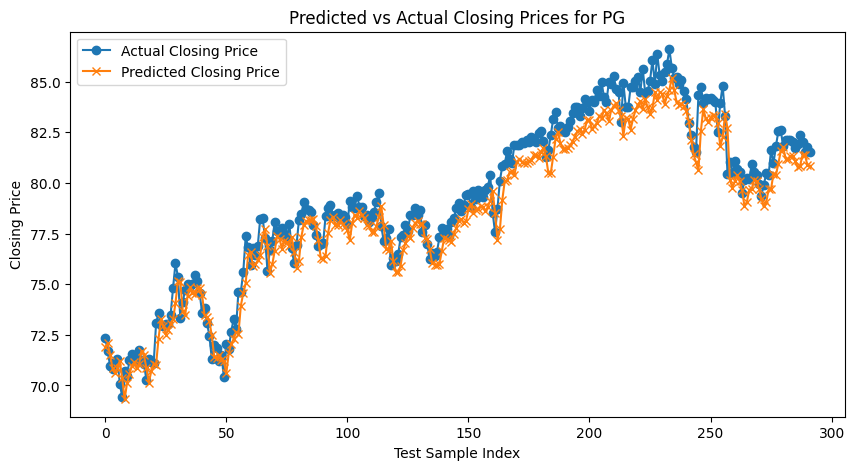

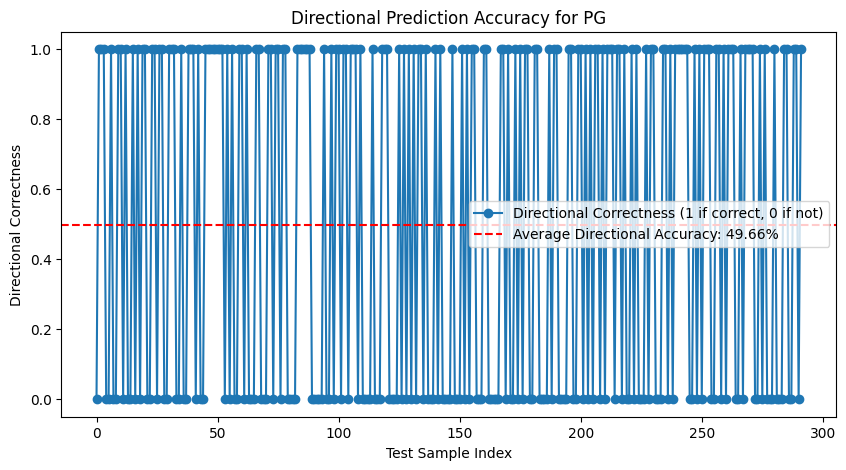

ROC AUC for PG: 0.55


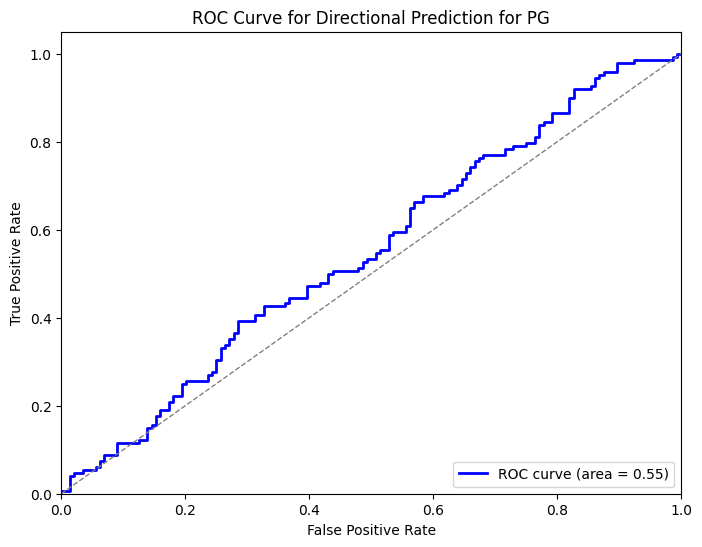


Processing ticker: PGR
Ticker: PGR - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0024 - val_loss: 0.0042
Epoch 2/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.4504e-04 - val_loss: 0.0031
Epoch 3/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.4366e-04 - val_loss: 0.0040
Epoch 4/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.1017e-04 - val_loss: 0.0039
Epoch 5/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.1456e-04 - val_loss: 0.0016
Epoch 6/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.1715e-04 - val_loss: 0.0037
Epoch 7/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.8566e-04 - val_loss: 0.0019
Epoch 8/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.7473e-04 - val_loss: 0.0023
Epoch 9/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.4808e-04 - val_loss: 0.0027
Epoch 10/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.1309e-04 - val_loss: 0.0021
Epoch 11/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.9727e-04 - val_loss: 0.0015
Epoch 12/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 6m

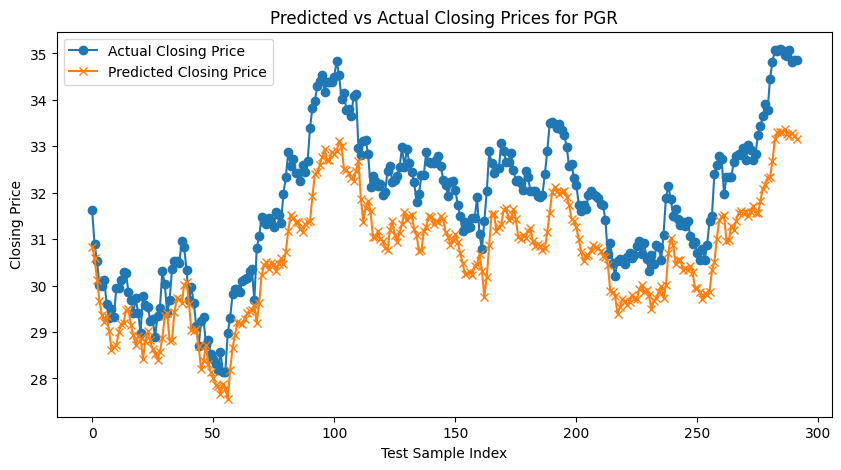

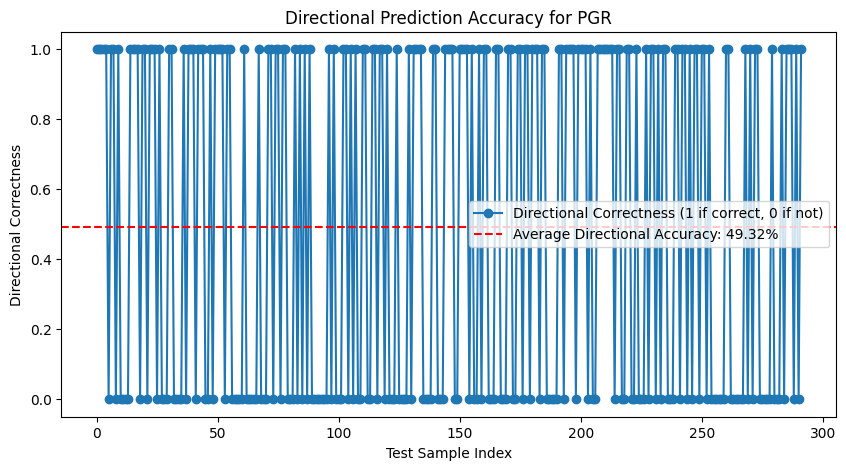

ROC AUC for PGR: 0.48


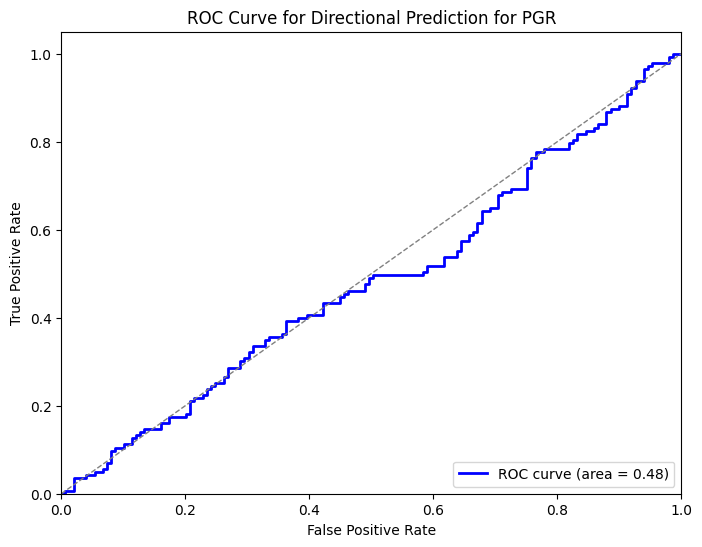


Processing ticker: QCOM
Ticker: QCOM - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.1097 - val_loss: 0.0030
Epoch 2/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0038 - val_loss: 0.0024
Epoch 3/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0021 - val_loss: 0.0023
Epoch 4/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0019 - val_loss: 0.0029
Epoch 5/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0021 - val_loss: 0.0024
Epoch 6/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0021 - val_loss: 0.0023
Epoch 7/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0019 - val_loss: 0.0019
Epoch 8/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0015 - val_loss: 0.0019
Epoch 9/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0017 - val_loss: 0.0023
Epoch 10/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0012 - val_loss: 0.0018
Epoch 11/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0013 - val_loss: 0.0020
Epoch 12/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0013 - val_loss: 0.0019

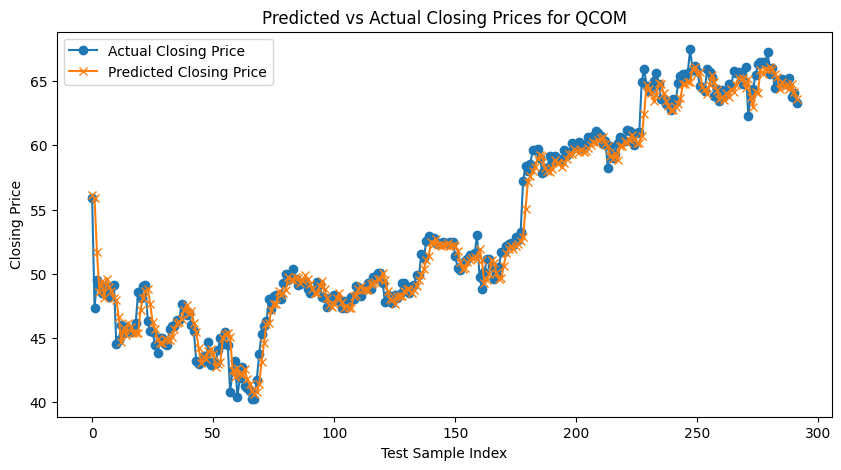

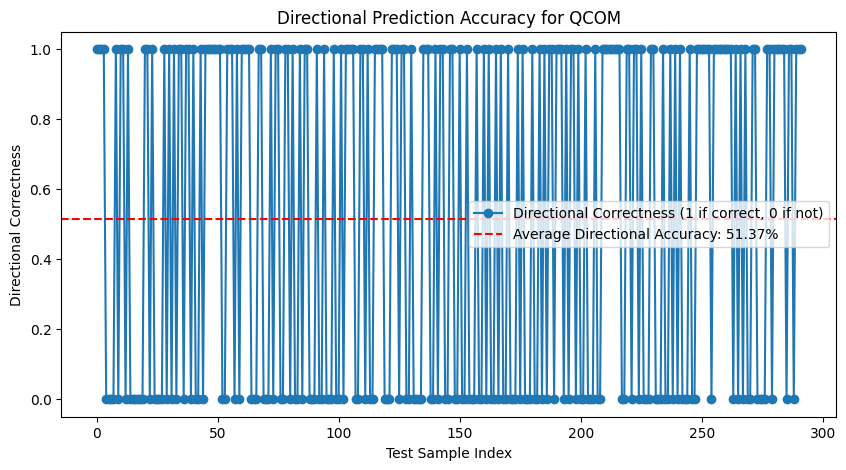

ROC AUC for QCOM: 0.57


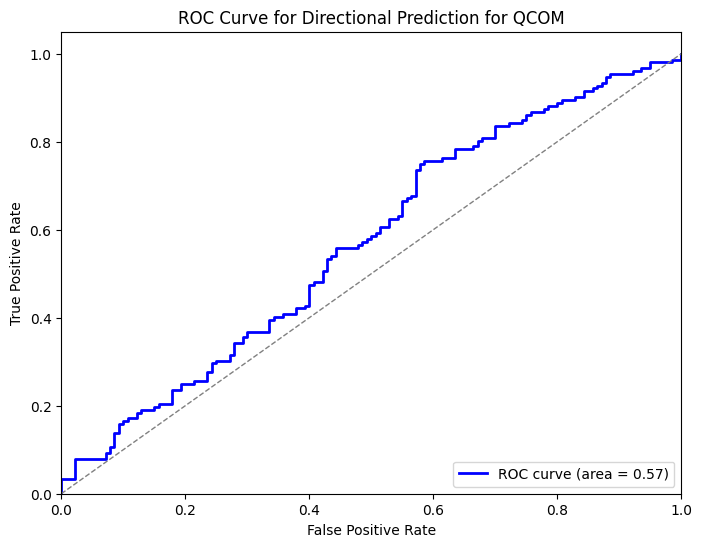


Processing ticker: SMFG
Ticker: SMFG - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.1341 - val_loss: 0.0044
Epoch 2/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0042 - val_loss: 0.0025
Epoch 3/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0025 - val_loss: 0.0031
Epoch 4/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0023 - val_loss: 0.0025
Epoch 5/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 6/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0019 - val_loss: 0.0020
Epoch 7/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0018 - val_loss: 0.0019
Epoch 8/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 9/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0016 - val_loss: 0.0017
Epoch 10/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0017 - val_loss: 0.0019
Epoch 11/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0015 - val_loss: 0.0015
Epoch 12/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0014 - val_loss: 0.0015

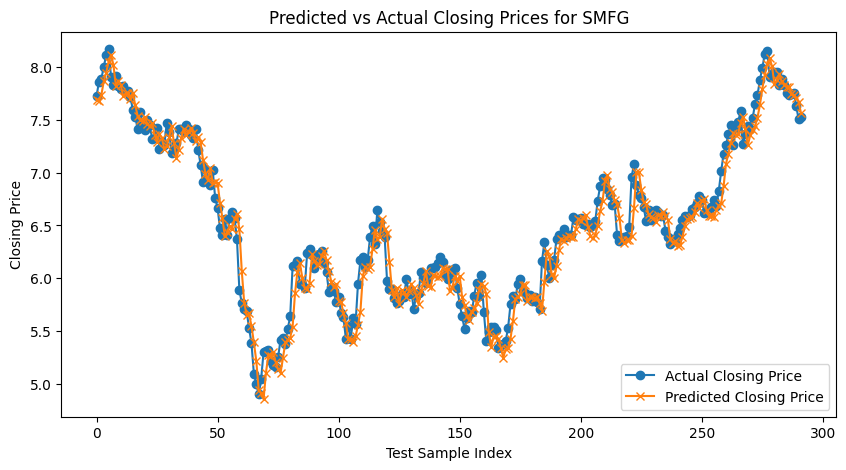

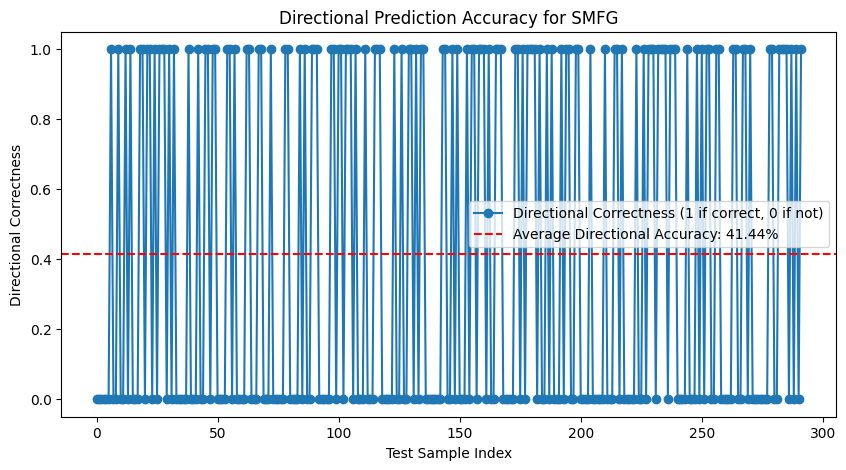

ROC AUC for SMFG: 0.42


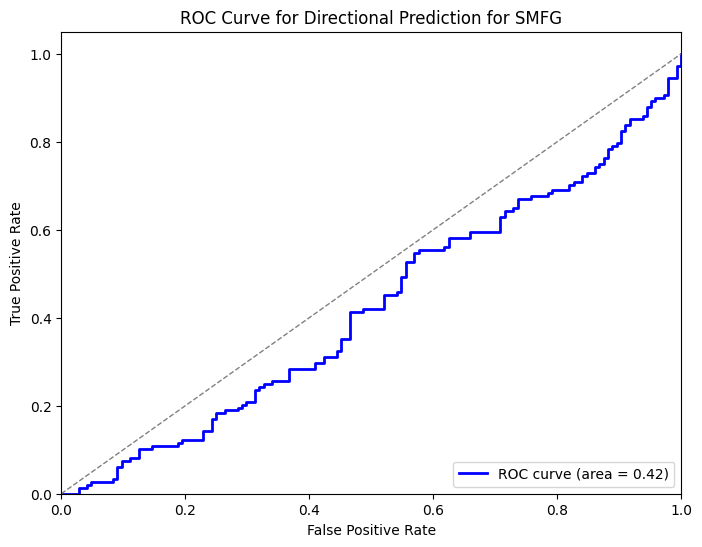


Processing ticker: SPGI
Ticker: SPGI - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0230 - val_loss: 0.0102
Epoch 2/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.2756e-04 - val_loss: 0.0054
Epoch 3/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5977e-04 - val_loss: 0.0053
Epoch 4/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8844e-04 - val_loss: 0.0046
Epoch 5/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7922e-04 - val_loss: 0.0039
Epoch 6/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7374e-04 - val_loss: 0.0031
Epoch 7/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.1608e-04 - val_loss: 0.0020
Epoch 8/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.7405e-04 - val_loss: 0.0035
Epoch 9/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.5652e-04 - val_loss: 0.0026
Epoch 10/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.4493e-04 - val_loss: 0.0016
Epoch 11/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.0849e-04 - val_loss: 0.0022
Epoch 12/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms

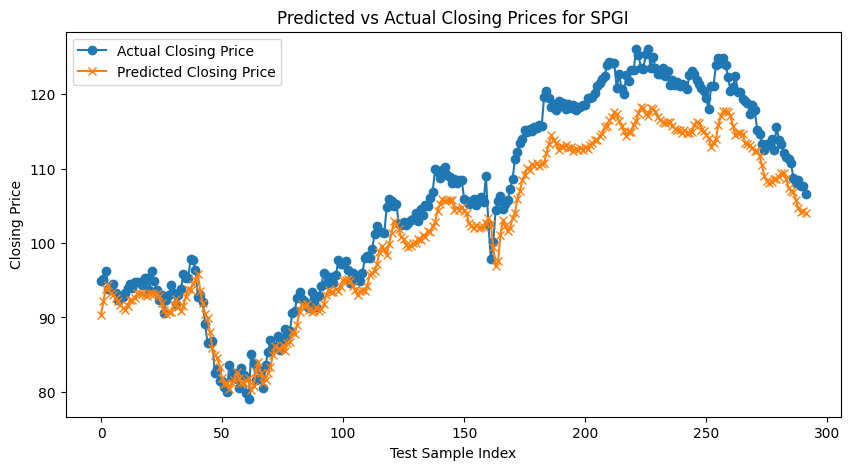

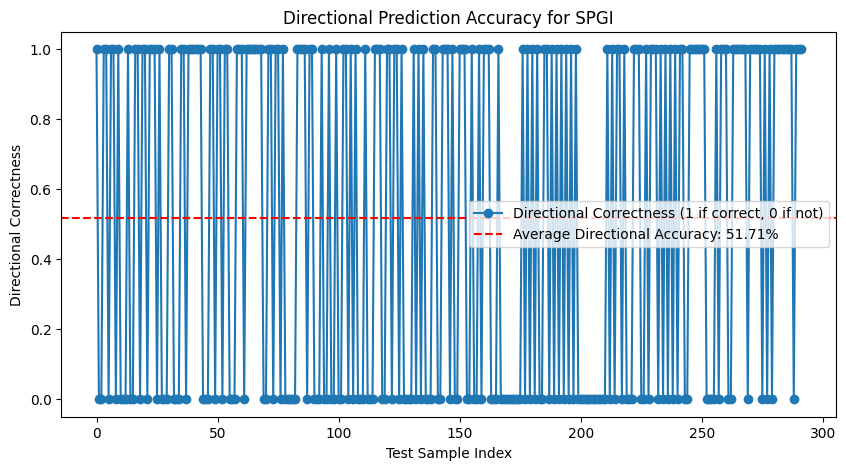

ROC AUC for SPGI: 0.54


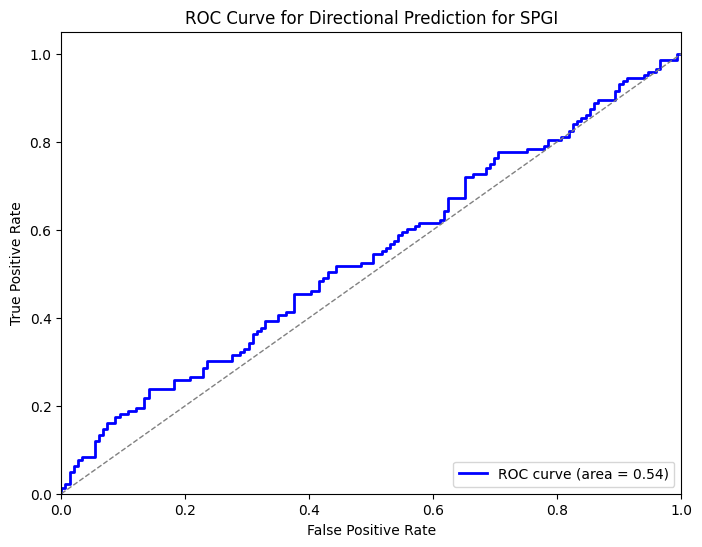


Processing ticker: SYK
Ticker: SYK - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0019 - val_loss: 7.4538e-04
Epoch 2/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.8514e-04 - val_loss: 6.9604e-04
Epoch 3/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.4985e-04 - val_loss: 7.6211e-04
Epoch 4/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.0922e-04 - val_loss: 0.0015
Epoch 5/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.8195e-04 - val_loss: 5.4227e-04
Epoch 6/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.7381e-04 - val_loss: 9.3558e-04
Epoch 7/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.4977e-04 - val_loss: 5.7171e-04
Epoch 8/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.4402e-04 - val_loss: 7.6796e-04
Epoch 9/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.2073e-04 - val_loss: 9.7271e-04
Epoch 10/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.2217e-04 - val_loss: 3.2773e-04
Epoch 11/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.1585e-04 - val_loss: 3.2715e-04
Epoch

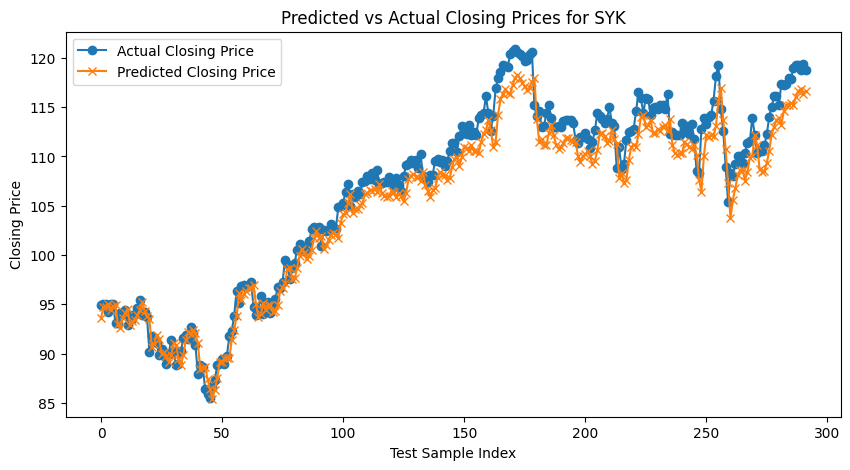

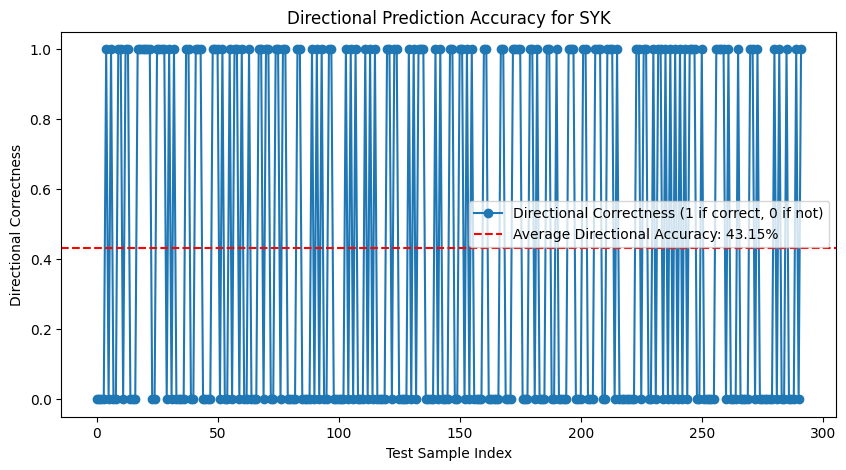

ROC AUC for SYK: 0.54


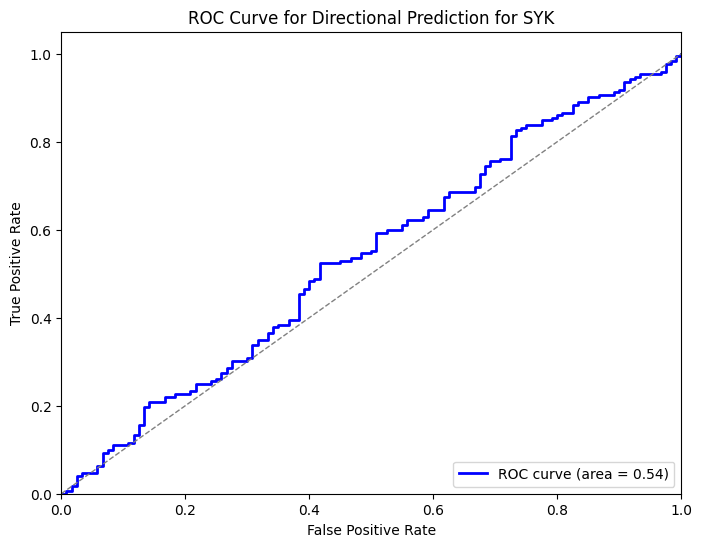


Processing ticker: T
Ticker: T - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0067 - val_loss: 8.5810e-04
Epoch 2/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.1930e-04 - val_loss: 0.0012
Epoch 3/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5875e-04 - val_loss: 7.8493e-04
Epoch 4/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4289e-04 - val_loss: 5.3160e-04
Epoch 5/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9055e-04 - val_loss: 5.4112e-04
Epoch 6/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7477e-04 - val_loss: 4.5763e-04
Epoch 7/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8587e-04 - val_loss: 4.0395e-04
Epoch 8/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5285e-04 - val_loss: 3.6838e-04
Epoch 9/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.4106e-04 - val_loss: 3.5630e-04
Epoch 10/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.2656e-04 - val_loss: 3.5118e-04
Epoch 11/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.2416e-04 - val_loss: 3.2992e-04
Epoc

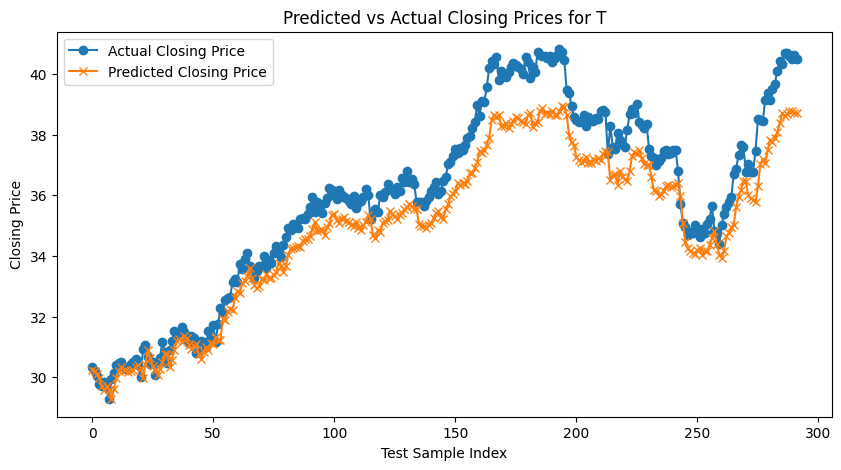

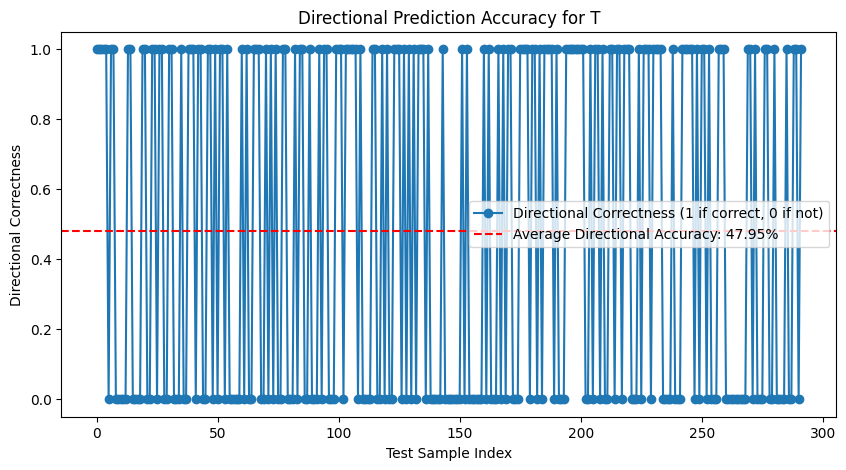

ROC AUC for T: 0.55


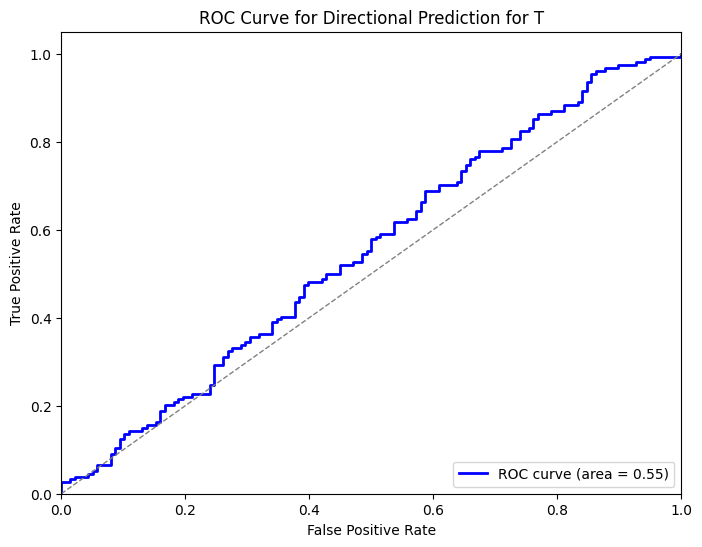


Processing ticker: TMO
Ticker: TMO - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0024 - val_loss: 0.0014
Epoch 2/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7498e-04 - val_loss: 7.6910e-04
Epoch 3/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.4491e-04 - val_loss: 9.9659e-04
Epoch 4/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.6892e-04 - val_loss: 8.6911e-04
Epoch 5/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.7716e-04 - val_loss: 0.0013
Epoch 6/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5390e-04 - val_loss: 7.4584e-04
Epoch 7/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.2597e-04 - val_loss: 7.5541e-04
Epoch 8/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.5577e-04 - val_loss: 5.9454e-04
Epoch 9/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.0082e-04 - val_loss: 0.0010
Epoch 10/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.6637e-04 - val_loss: 5.8302e-04
Epoch 11/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.7455e-04 - val_loss: 5.4227e-04
Epoch 12/50
2

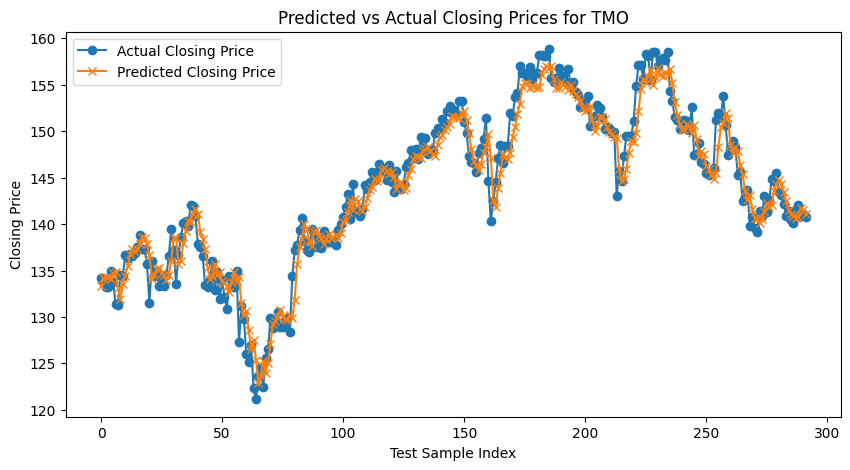

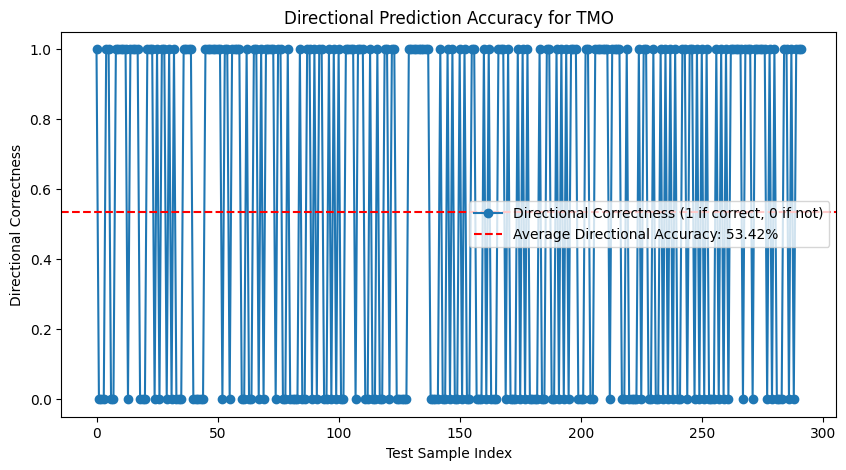

ROC AUC for TMO: 0.56


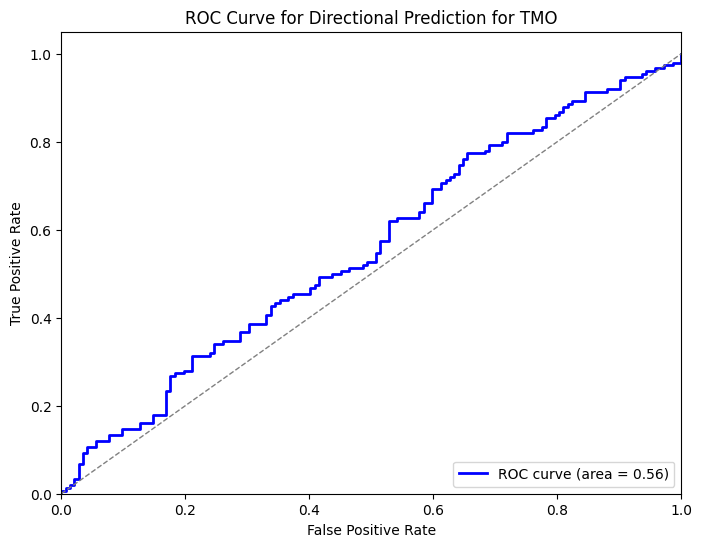


Processing ticker: TXN
Ticker: TXN - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0349 - val_loss: 0.0011
Epoch 2/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.0996e-04 - val_loss: 0.0013
Epoch 3/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.9271e-04 - val_loss: 5.7054e-04
Epoch 4/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.5991e-04 - val_loss: 7.9397e-04
Epoch 5/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.7238e-04 - val_loss: 6.4919e-04
Epoch 6/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.5075e-04 - val_loss: 7.1490e-04
Epoch 7/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.3566e-04 - val_loss: 8.3758e-04
Epoch 8/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.5529e-04 - val_loss: 7.9018e-04
Epoch 9/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.2773e-04 - val_loss: 7.1501e-04
Epoch 10/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.2716e-04 - val_loss: 8.6950e-04
Epoch 11/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.3181e-04 - val_loss: 5.3089e-04
Epoch 12/

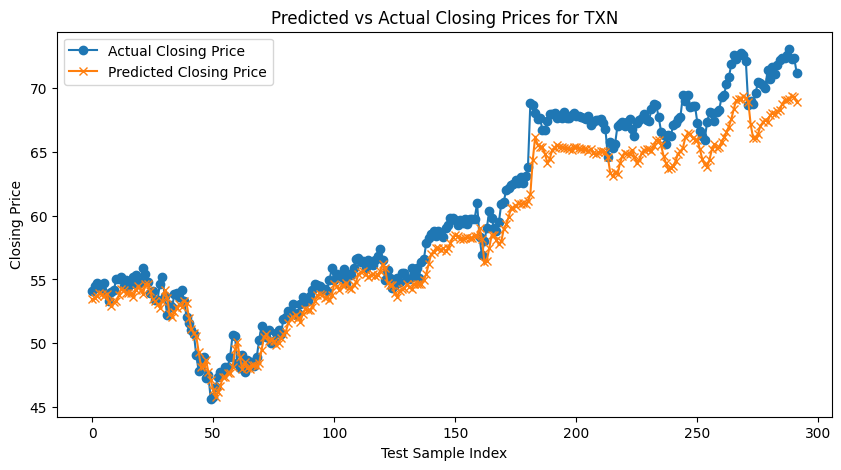

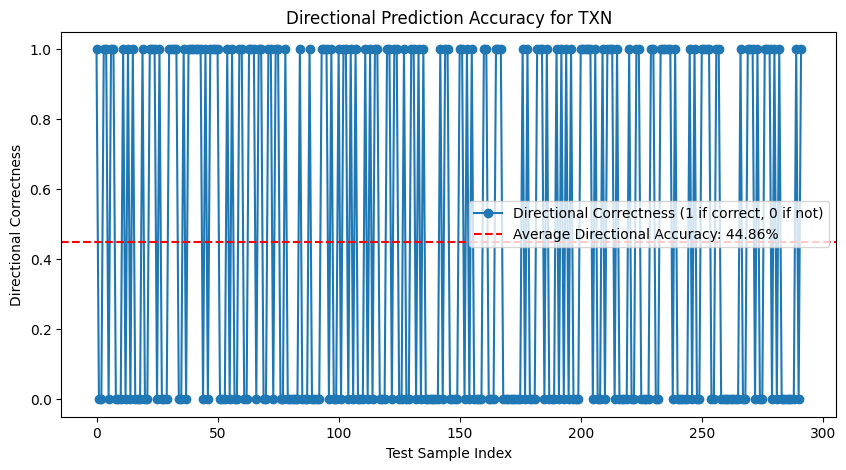

ROC AUC for TXN: 0.54


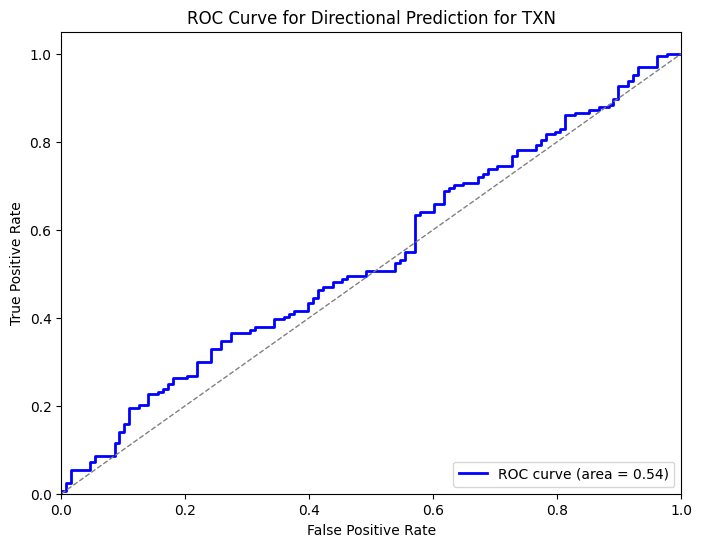


Processing ticker: UNH
Ticker: UNH - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0079 - val_loss: 0.0091
Epoch 2/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.3846e-04 - val_loss: 0.0075
Epoch 3/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.9599e-04 - val_loss: 0.0053
Epoch 4/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.7272e-04 - val_loss: 0.0038
Epoch 5/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.7555e-04 - val_loss: 0.0043
Epoch 6/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.6358e-04 - val_loss: 0.0035
Epoch 7/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.6182e-04 - val_loss: 0.0029
Epoch 8/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.5022e-04 - val_loss: 0.0027
Epoch 9/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.5511e-04 - val_loss: 0.0024
Epoch 10/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.5490e-04 - val_loss: 0.0027
Epoch 11/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.4088e-04 - val_loss: 0.0023
Epoch 12/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms

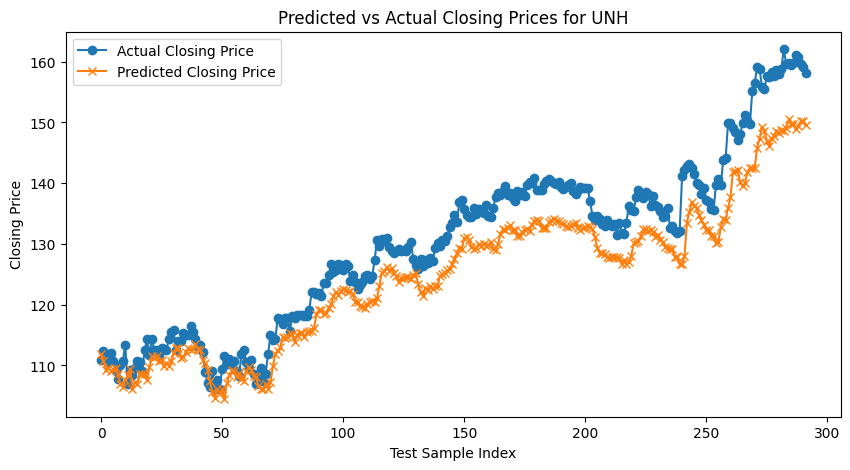

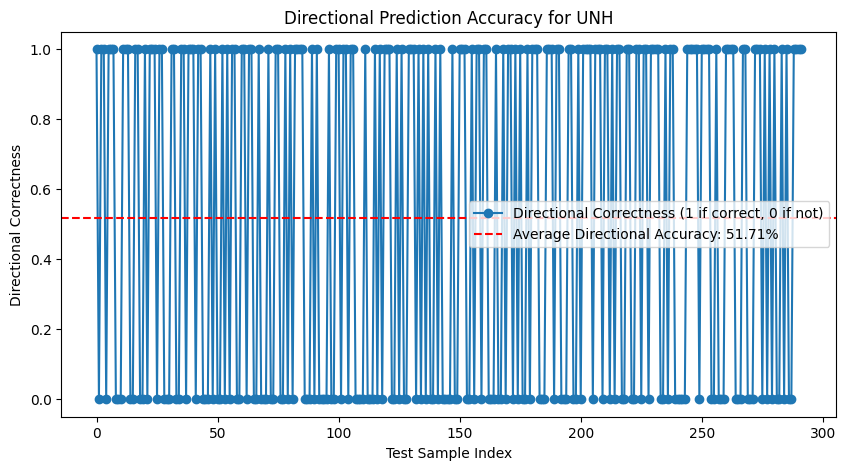

ROC AUC for UNH: 0.54


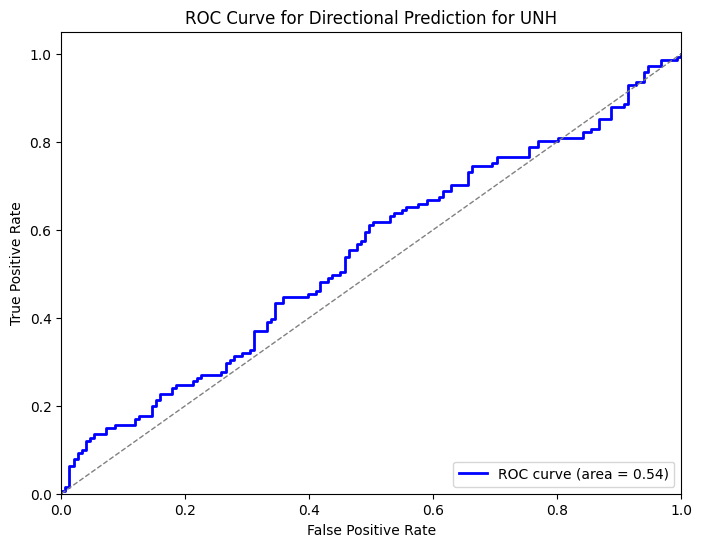


Processing ticker: UNP
Ticker: UNP - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0207 - val_loss: 0.0094
Epoch 2/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6948e-04 - val_loss: 0.0046
Epoch 3/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6068e-04 - val_loss: 0.0029
Epoch 4/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4067e-04 - val_loss: 0.0029
Epoch 5/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1362e-04 - val_loss: 0.0035
Epoch 6/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.4488e-04 - val_loss: 0.0029
Epoch 7/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.2166e-04 - val_loss: 0.0022
Epoch 8/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.1334e-04 - val_loss: 0.0017
Epoch 9/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.9808e-04 - val_loss: 0.0018
Epoch 10/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.0910e-04 - val_loss: 0.0018
Epoch 11/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.5321e-04 - val_loss: 0.0015
Epoch 12/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms

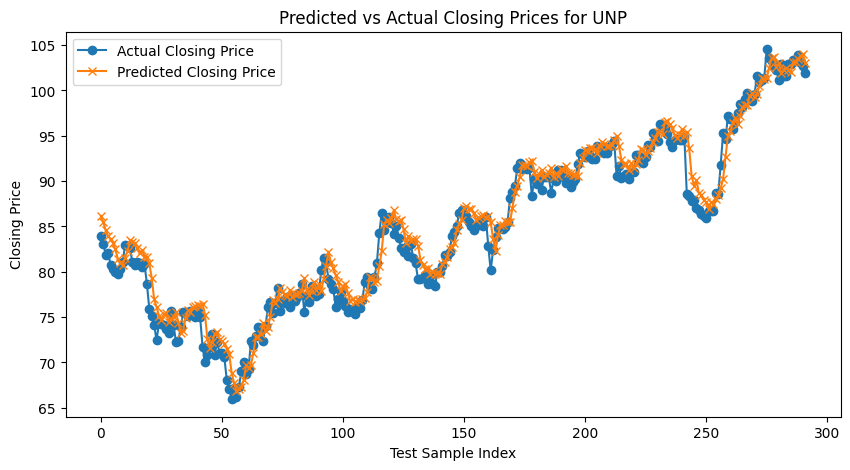

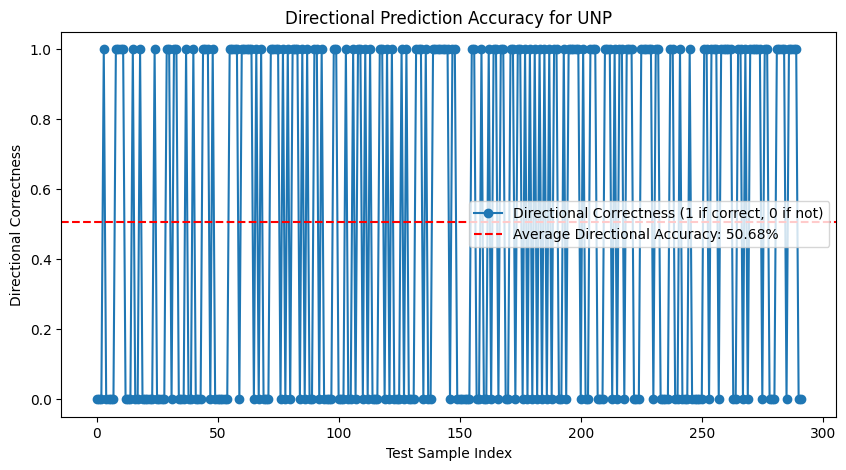

ROC AUC for UNP: 0.50


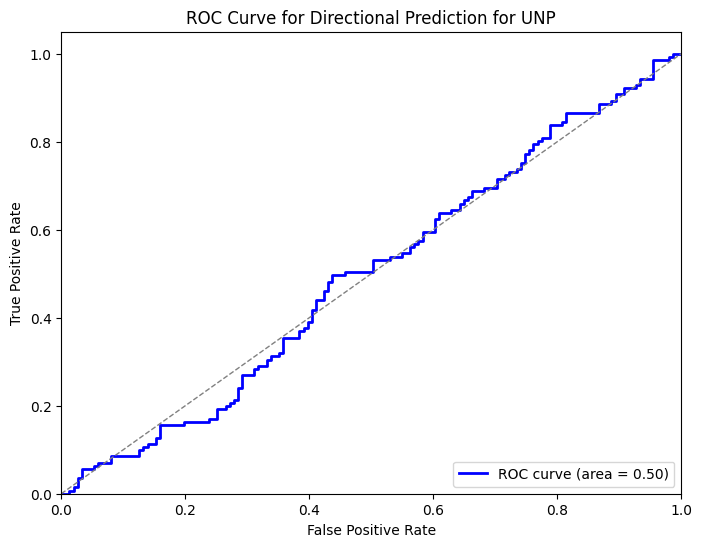


Processing ticker: VZ
Ticker: VZ - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0493 - val_loss: 0.0044
Epoch 2/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0011 - val_loss: 6.9645e-04
Epoch 3/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0050e-04 - val_loss: 3.2339e-04
Epoch 4/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5820e-04 - val_loss: 3.0583e-04
Epoch 5/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.0382e-04 - val_loss: 3.7465e-04
Epoch 6/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.8106e-04 - val_loss: 3.1152e-04
Epoch 7/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.4528e-04 - val_loss: 2.9236e-04
Epoch 8/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.4162e-04 - val_loss: 3.6914e-04
Epoch 9/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.2254e-04 - val_loss: 3.1378e-04
Epoch 10/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.3285e-04 - val_loss: 2.6342e-04
Epoch 11/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.1966e-04 - val_loss: 2.9673e-04
Epoch 12

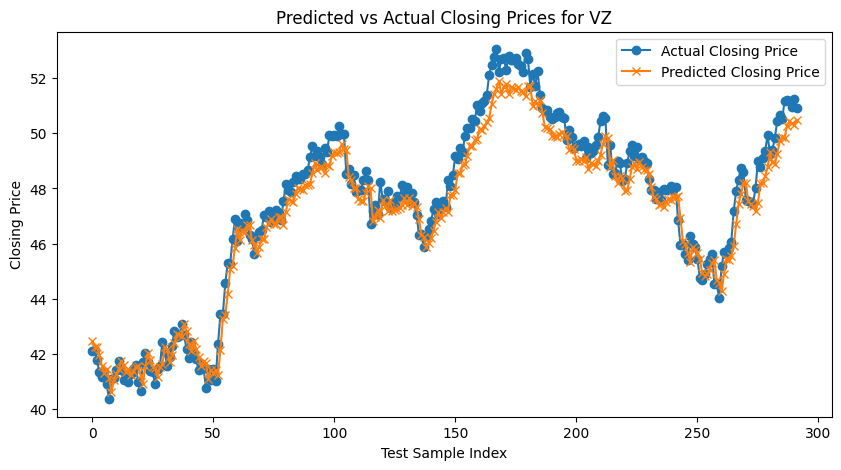

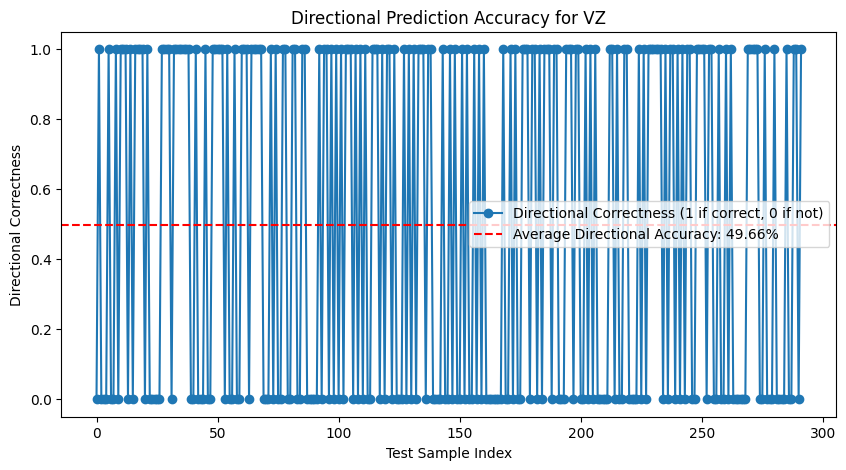

ROC AUC for VZ: 0.54


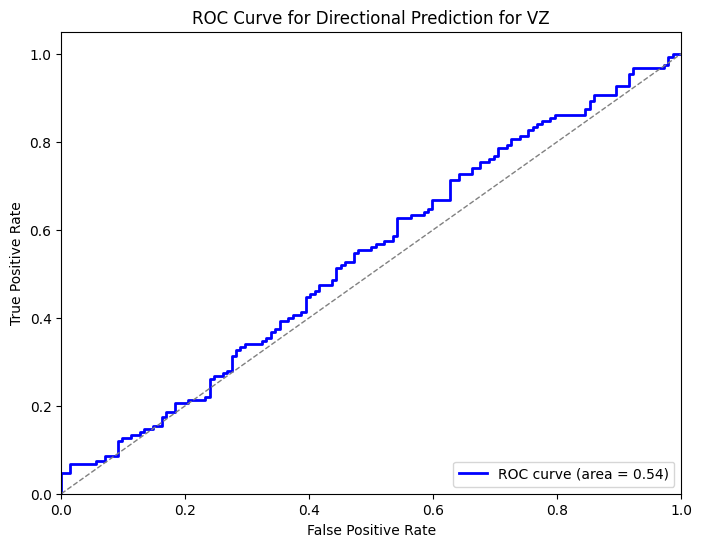


Processing ticker: WFC
Ticker: WFC - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.3076 - val_loss: 0.0020
Epoch 2/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0018 - val_loss: 0.0040
Epoch 3/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7342e-04 - val_loss: 0.0021
Epoch 4/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4173e-04 - val_loss: 0.0025
Epoch 5/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1412e-04 - val_loss: 0.0021
Epoch 6/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2044e-04 - val_loss: 0.0017
Epoch 7/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2546e-04 - val_loss: 0.0021
Epoch 8/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.4551e-04 - val_loss: 0.0013
Epoch 9/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5559e-04 - val_loss: 0.0012
Epoch 10/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.4458e-04 - val_loss: 0.0014
Epoch 11/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.0028e-04 - val_loss: 0.0014
Epoch 12/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/ste

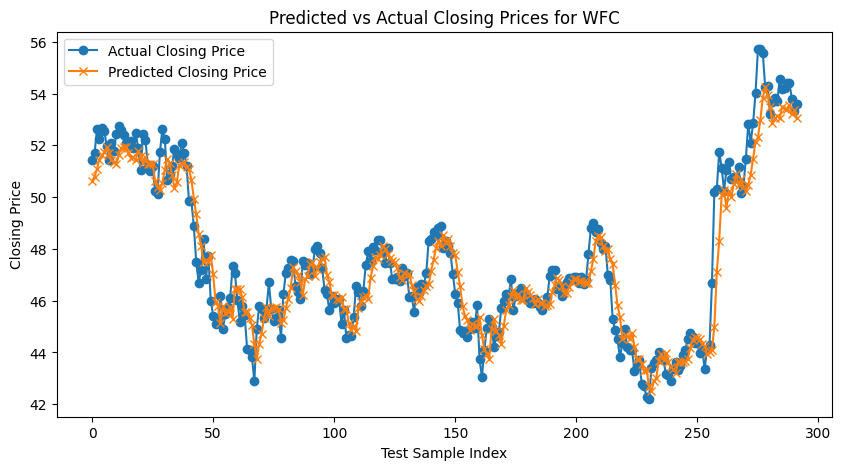

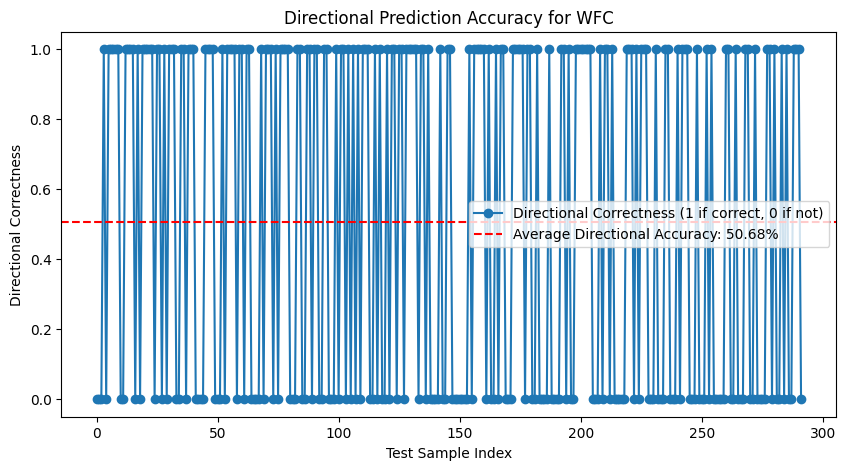

ROC AUC for WFC: 0.52


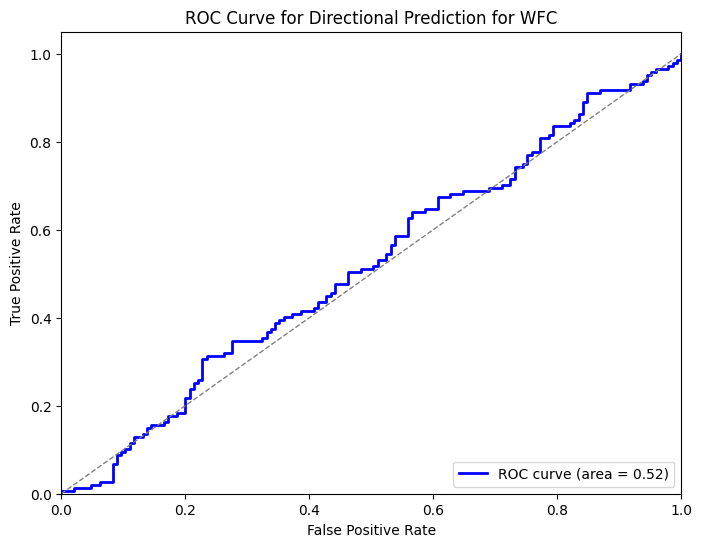


Processing ticker: WMT
Ticker: WMT - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0074 - val_loss: 0.0047
Epoch 2/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.5775e-04 - val_loss: 0.0024
Epoch 3/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8498e-04 - val_loss: 0.0017
Epoch 4/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3814e-04 - val_loss: 0.0020
Epoch 5/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2731e-04 - val_loss: 0.0016
Epoch 6/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.7846e-04 - val_loss: 0.0018
Epoch 7/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7052e-04 - val_loss: 0.0017
Epoch 8/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0922e-04 - val_loss: 0.0013
Epoch 9/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.1618e-04 - val_loss: 0.0011
Epoch 10/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.0853e-04 - val_loss: 0.0014
Epoch 11/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8596e-04 - val_loss: 0.0011
Epoch 12/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5m

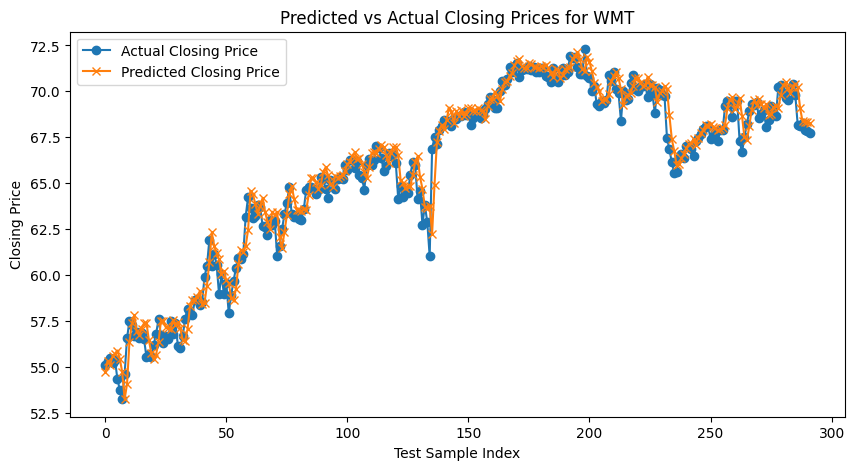

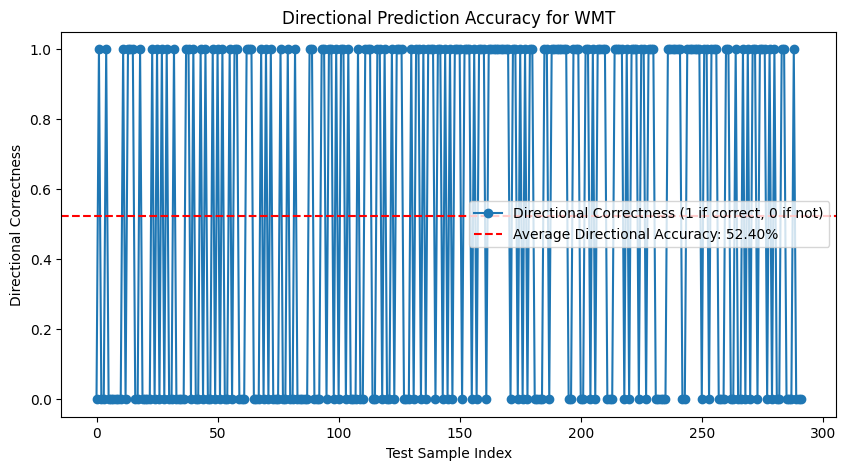

ROC AUC for WMT: 0.52


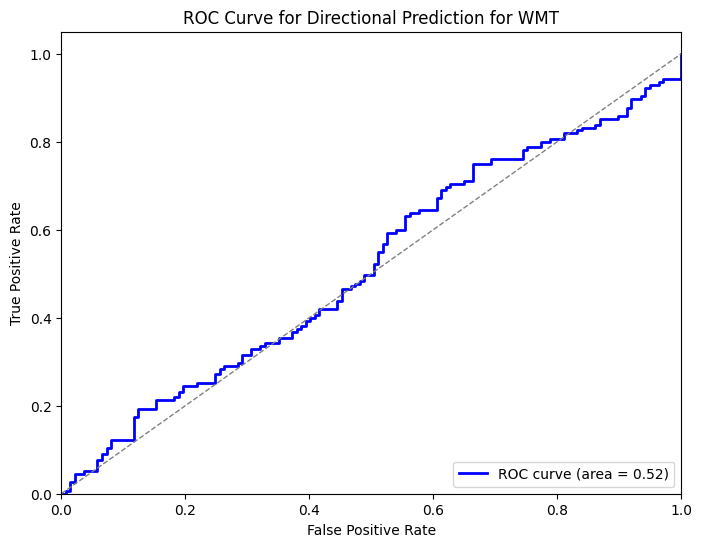


Processing ticker: XOM
Ticker: XOM - Total sequences created: 1460
Training samples: 876, Validation samples: 292, Testing samples: 292
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.3677 - val_loss: 0.0179
Epoch 2/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0137 - val_loss: 0.0049
Epoch 3/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0042 - val_loss: 0.0042
Epoch 4/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0033 - val_loss: 0.0043
Epoch 5/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0025 - val_loss: 0.0039
Epoch 6/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0022 - val_loss: 0.0034
Epoch 7/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0016 - val_loss: 0.0036
Epoch 8/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0017 - val_loss: 0.0034
Epoch 9/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0016 - val_loss: 0.0034
Epoch 10/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0016 - val_loss: 0.0029
Epoch 11/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0014 - val_loss: 0.0031
Epoch 12/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0015 - val_loss: 0.0031


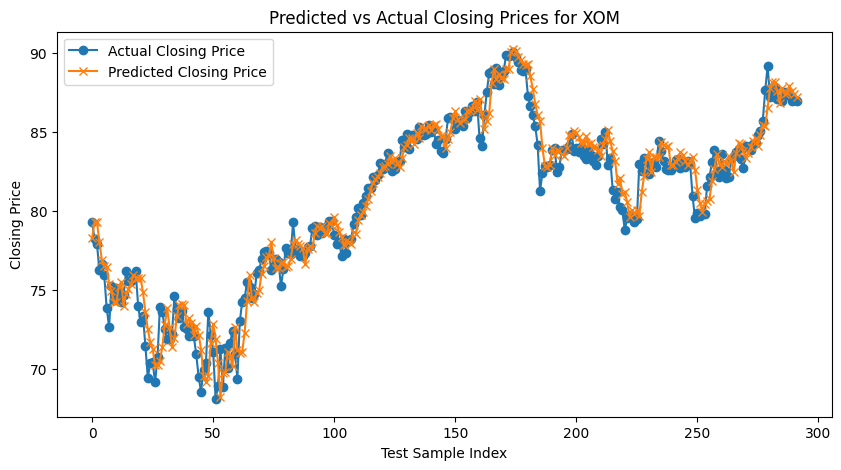

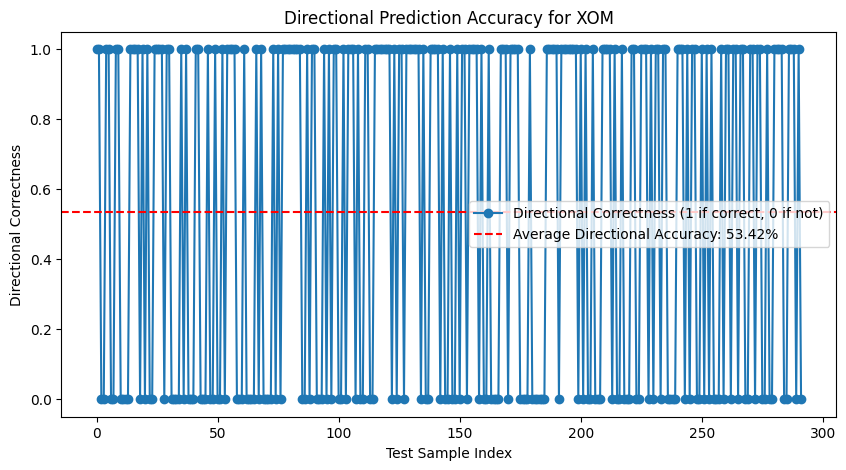

ROC AUC for XOM: 0.54


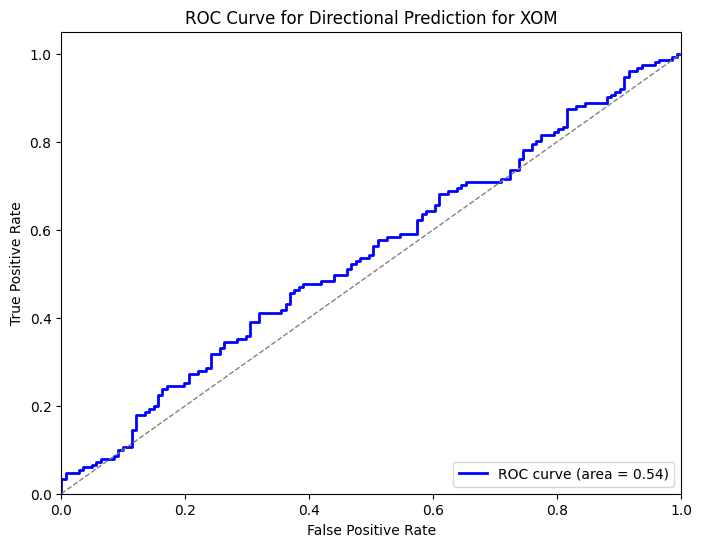

In [ ]:
# Import required libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, SimpleRNN
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, roc_curve, auc

# Set the rolling window size (number of past data pdoints in each sequence)
rolling_window = 50  # Change as needed

# Set a specific ticker to analyze (e.g., 'AAPL'). If set to None, the code iterates through all tickers.
specific_ticker = None  # Example: 'AAPL' or None for all tickers

# Training parameters
epochs = 50
batch_size = 32

# =====================================================
# STEP 1: LOAD AND PRE-PROCESS THE DATA
# =====================================================
# The CSV is assumed to have these columns in order: 
# Date,index,Open,High,Low,Close,Volume,OpenInt,ticker
data = pd.read_csv('filtered_stocks_combined.csv')  # Update with your actual file name

print("Loaded data with {} records.".format(len(data)))

# Convert the 'Date' column to datetime and sort by 'Date' and 'index'
data['Date'] = pd.to_datetime(data['Date'])
data.sort_values(['Date', 'index'], inplace=True)
print("Data sorted by 'Date' and 'index'.")
print(data.head())

# =====================================================
# STEP 2: DEFINE HELPER FUNCTIONS
# =====================================================
def create_sequences(data_series, seq_length):
    """
    Create overlapping sequences for RNN training.
    Each sample consists of 'seq_length' consecutive values,
    and the target is the immediately following value.
    """
    xs, ys = [], []
    for i in range(len(data_series) - seq_length):
        x = data_series[i:(i + seq_length)]
        y = data_series[i + seq_length]
        xs.append(x)
        ys.append(y)
    return np.array(xs), np.array(ys)

def build_rnn_model(seq_length):
    """
    Build and compile a simple RNN model.
    """
    model = Sequential()
    model.add(SimpleRNN(50, activation='tanh', input_shape=(seq_length, 1)))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mse')
    return model

def process_ticker(ticker, df, rolling_window, epochs=10, batch_size=32, verbose=1):
    """
    For the specified ticker:
      - Filter and sort the data.
      - Scale the 'Close' price.
      - Create sequences of scaled values.
      - Split the data into training (60%), validation (20%) and test (20%) sets.
      - Train a simple RNN model.
      - Predict the test set closing prices.
      - Calculate error metrics.
      - Compute directional prediction correctness.
      - Plot actual vs. predicted prices.
      - Plot the directional correctness (binary indicator) and a ROC curve.
    """
    print("\n==============================")
    print("Processing ticker:", ticker)
    print("==============================")
    
    # Filter data for this ticker and sort by Date and index
    stock_data = df[df['ticker'].str.upper() == ticker.upper()].copy()
    stock_data.sort_values(['Date', 'index'], inplace=True)
    
    # Ensure sufficient data for sequence creation
    if stock_data.shape[0] < rolling_window + 1:
        print(f"Not enough data for ticker {ticker} to create sequences.")
        return None
    
    # Scale the 'Close' price using MinMaxScaler
    scaler = MinMaxScaler()
    stock_data['Close_Scaled'] = scaler.fit_transform(stock_data['Close'].values.reshape(-1, 1))
    
    # Create sequences from the scaled 'Close' values
    prices = stock_data['Close_Scaled'].values
    X, y = create_sequences(prices, rolling_window)
    X = X.reshape((X.shape[0], rolling_window, 1))
    
    print(f"Ticker: {ticker} - Total sequences created: {X.shape[0]}")
    
    # ---------------------------
    # Split into training (60%), validation (20%) and testing (20%) sets
    # ---------------------------
    total_samples = len(X)
    train_end = int(total_samples * 0.6)
    val_end = train_end + int(total_samples * 0.2)
    X_train, X_val, X_test = X[:train_end], X[train_end:val_end], X[val_end:]
    y_train, y_val, y_test = y[:train_end], y[train_end:val_end], y[val_end:]
    print(f"Training samples: {X_train.shape[0]}, Validation samples: {X_val.shape[0]}, Testing samples: {X_test.shape[0]}")
    
    # Build and train the RNN model on the training data, validating on the validation set.
    model = build_rnn_model(rolling_window)
    history = model.fit(X_train, y_train, 
                        validation_data=(X_val, y_val),
                        epochs=epochs, 
                        batch_size=batch_size, 
                        verbose=verbose)
    
    # Predict on the test set.
    predictions_scaled = model.predict(X_test)
    predictions = scaler.inverse_transform(predictions_scaled)
    y_test_actual = scaler.inverse_transform(y_test.reshape(-1, 1))
    
    # Calculate error metrics.
    mean_squared_error_value = mean_squared_error(y_test_actual, predictions)
    print(f"Mean Squared Error for {ticker}: {mean_squared_error_value:.4f}")
    
    
    # ---------------------------
    # Directional Prediction Calculation
    # ---------------------------
    # For each test sample, compare the predicted change (predicted price - last value of input sequence)
    # with the actual change (actual closing price - last value of input sequence).
    direction_correct = []
    actual_labels = []      # For ROC: actual upward movement indicator (1 if up, 0 if down)
    predicted_scores = []   # For ROC: predicted price difference used as the score
    
    for i in range(len(X_test)):
        # Last value in the corresponding input sequence (scaled)
        last_val = X_test[i, -1, 0]
        pred_diff = predictions_scaled[i, 0] - last_val  # using scaled differences
        actual_diff = y_test[i] - last_val
        
        # Determine directional correctness: same direction yields 1, otherwise 0.
        if (pred_diff > 0 and actual_diff > 0) or (pred_diff < 0 and actual_diff < 0):
            direction_correct.append(1)
        else:
            direction_correct.append(0)
        
        # For ROC curve:
        # Actual label: 1 if actual_diff > 0, else 0.
        actual_labels.append(1 if actual_diff > 0 else 0)
        # Predicted score: use the predicted difference.
        predicted_scores.append(pred_diff)
        
    direction_correct = np.array(direction_correct)
    directional_accuracy = np.mean(direction_correct) * 100
    print(f"Directional Accuracy for {ticker}: {directional_accuracy:.2f}%")
    
    # ---------------------------
    # Plot: Actual vs Predicted Closing Prices
    # ---------------------------
    plt.figure(figsize=(10, 5))
    plt.plot(y_test_actual, label='Actual Closing Price', marker='o')
    plt.plot(predictions, label='Predicted Closing Price', marker='x')
    plt.title(f'Predicted vs Actual Closing Prices for {ticker}')
    plt.xlabel('Test Sample Index')
    plt.ylabel('Closing Price')
    plt.legend()
    plt.show()
    
    # ---------------------------
    # Plot: Directional Prediction Accuracy (Binary Indicator)
    # ---------------------------
    plt.figure(figsize=(10, 5))
    plt.plot(direction_correct, 'o-', label='Directional Correctness (1 if correct, 0 if not)')
    plt.axhline(np.mean(direction_correct), color='red', linestyle='--', 
                label=f'Average Directional Accuracy: {directional_accuracy:.2f}%')
    plt.xlabel('Test Sample Index')
    plt.ylabel('Directional Correctness')
    plt.title(f'Directional Prediction Accuracy for {ticker}')
    plt.legend()
    plt.show()
    
    # ---------------------------
    # Plot: ROC Curve for Directional Prediction
    # ---------------------------
    # Compute ROC curve and AUC using the actual labels and predicted scores.
    fpr, tpr, thresholds = roc_curve(actual_labels, predicted_scores)
    roc_auc = auc(fpr, tpr)
    print(f"ROC AUC for {ticker}: {roc_auc:.2f}")
    
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='grey', lw=1, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve for Directional Prediction for {ticker}')
    plt.legend(loc="lower right")
    plt.show()

# =====================================================
# STEP 3: PROCESS TICKERS
# =====================================================
if specific_ticker is None:
    tickers = data['ticker'].unique()
    print("Processing all tickers:\n", tickers)
    for ticker in tickers:
        process_ticker(ticker, data, rolling_window, epochs, batch_size)
else:
    print("Processing specific ticker:", specific_ticker)
    process_ticker(specific_ticker, data, rolling_window, epochs, batch_size)
